In [1]:
### Import packages.
#import numpy as np
#import pandas as pd
#import matplotlib.pyplot as plt
#%matplotlib inline 
#import seaborn as sns
#import os
#from sklearn.ensemble import RandomForestClassifier

seed = 212

# systems
import os
import sys

# basic data processing
import numpy as np
np.random.seed(seed) # sklearn's random seed is the same as np.random.seed
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import itertools as it
from pprint import pprint

# ML-related (e.g. models, stats)
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn import metrics
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
import tensorflow
import keras
#import tensorflow as tf

# visualizations
%matplotlib inline
import matplotlib.pyplot as plt
#plt.rcParams['figure.figsize'] = [20, 8]
import seaborn as sns
sns.set(font_scale=1.2)

In [2]:
# hide warnings
import warnings
warnings.filterwarnings("ignore")

In [149]:
import sys
!{sys.executable} -m pip install plotly

     |████████████████████████████████| 21.8 MB 790 kB/s eta 0:00:01
You should consider upgrading via the '/usr/local/Cellar/jupyterlab/3.1.6/libexec/bin/python3.9 -m pip install --upgrade pip' command.


In [253]:
# Load data
starr = pd.read_csv('starr.csv', header = 0)
mimic = pd.read_csv('mimic.csv', header = 0)

print('starr: ', starr.shape)
print('mimic: ', mimic.shape)

starr:  (3107, 123)
mimic:  (13841, 123)


In [166]:
# to make sure features from MIMIC and STARR dataframes are in the same order
# smaller subset
feature_order = ['age', 'gender', 'ethnicity', 'icu_los', 'hospital_los', 'admit_ed', 
                 'ecg', 'xray', 'cxr', 'mri', 'ct', 'intub_days', 'extub_hrs', 
                 'diuretics', 'antihypertensives', 'inotrope_pressor', 'sedatives', 
                 'alt_last', 'ast_last', 'hco3_last', 'bnp_last', 'bun_last', 'ck_last', 'cr_last', 'crp_last', 
                 'dbili_last', 'esr_last', 'fio2_last', 'inr_last', 'hr_last', 'k_last', 'lac_last', 'ph_last', 
                 'lipase_last', 'na_last', 'map_last', 'pao2_last', 'paco2_last', 'plt_last', 'rr_last', 'sao2_last', 
                 'spo2_last', 'temp_last', 'tbili_last', 'wbc_last', 'trop_last', 'hgb_last', 'gcs_last', 'pafio2_last', 'rass_last',
                 'alt_max', 'ast_max', 'hco3_max', 'bnp_max', 'bun_max', 'ck_max', 'cr_max', 'crp_max', 'esr_max', 
                 'dbili_max', 'hr_max', 'k_max', 'inr_max', 'cortisol_max', 'lipase_max', 'lac_max', 'map_max', 'ph_max',
                 'na_max', 'paco2_max', 'pao2_max', 'rr_max', 'spo2_max', 'sao2_max', 'tbili_max', 'trop_max', 'temp_max',
                 'wbc_max', 'gcs_max', 'rass_max', 'gcs_min', 'hco3_min', 'cortisol_min', 'hr_min', 'inr_min', 'k_min', 'map_min', 'ph_min', 
                 'na_min', 'paco2_min', 'pao2_min', 'plt_min', 'rr_min', 'spo2_min', 'sao2_min', 'temp_min', 'wbc_min', 
                 'hgb_min', 'rass_min', 'hco3_high', 'bnp_high', 'bun_high', 'inflamm_marker', 'glu_high', 'hr_high', 'k_high', 'na_high', 
                 'lac_high', 'temp_high', 'trop_high', 'wbc_high', 'map_high', 'hco3_low', 'hgb_low', 'map_low', 'hr_low', 'k_low', 
                 'plt_low', 'na_low', 'wbc_low', 'temp_low']

In [4]:
# feature orders
# original subset
feature_order = ['age', 'gender', 'ethnicity', 'icu_los', 'hospital_los', 'admit_ed', 
                 'ecg', 'xray', 'cxr', 'mri', 'ct', 'intub_days', 'extub_hrs', 
                 'diuretics', 'antihypertensives', 'inotrope_pressor', 'sedatives', 
                 'alt_last', 'ast_last', 'hco3_last', 'bnp_last', 'bun_last', 'ck_last', 'cr_last', 'crp_last', 
                 'dbili_last', 'esr_last', 'fio2_last', 'inr_last', 'hr_last', 'k_last', 'lac_last', 'ph_last', 
                 'lipase_last', 'na_last', 'map_last', 'pao2_last', 'paco2_last', 'plt_last', 'sao2_last', 
                 'spo2_last', 'temp_last', 'tbili_last', 'wbc_last', 'trop_last', 'hgb_last', 'gcs_last', 'pafio2_last', 'rass_last',
                 'alt_max', 'ast_max', 'hco3_max', 'bnp_max', 'bun_max', 'ck_max', 'cr_max', 'crp_max', 'esr_max', 
                 'dbili_max', 'hr_max', 'k_max', 'inr_max', 'cortisol_max', 'lipase_max', 'lac_max', 'map_max', 'ph_max',
                 'na_max', 'paco2_max', 'pao2_max', 'spo2_max', 'sao2_max', 'tbili_max', 'trop_max', 'temp_max',
                 'wbc_max', 'gcs_max', 'rass_max', 'gcs_min', 'hco3_min', 'cortisol_min', 'hr_min', 'inr_min', 'k_min', 'map_min', 'ph_min', 
                 'na_min', 'paco2_min', 'pao2_min', 'plt_min', 'spo2_min', 'sao2_min', 'temp_min', 'wbc_min', 
                 'hgb_min', 'rass_min', 'hco3_high', 'bnp_high', 'bun_high', 'inflamm_marker', 'glu_high', 'hr_high', 'k_high', 'na_high', 
                 'lac_high', 'temp_high', 'trop_high', 'wbc_high', 'map_high', 'hco3_low', 'hgb_low', 'map_low', 'hr_low', 'k_low', 
                 'plt_low', 'na_low', 'wbc_low', 'temp_low']

In [5]:
starr_x = starr[feature_order]
starr_y = starr['readmit']
starr_x.head()

,age,gender,ethnicity,icu_los,hospital_los,admit_ed,ecg,xray,cxr,mri,ct,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,inr_last,hr_last,k_last,lac_last,ph_last,lipase_last,na_last,map_last,pao2_last,paco2_last,plt_last,rr_last,sao2_last,spo2_last,temp_last,tbili_last,wbc_last,trop_last,hgb_last,gcs_last,pafio2_last,rass_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cr_max,crp_max,esr_max,dbili_max,hr_max,k_max,inr_max,cortisol_max,lipase_max,lac_max,map_max,ph_max,na_max,paco2_max,pao2_max,rr_max,spo2_max,sao2_max,tbili_max,trop_max,temp_max,wbc_max,gcs_max,rass_max,gcs_min,hco3_min,cortisol_min,hr_min,inr_min,k_min,map_min,ph_min,na_min,paco2_min,pao2_min,plt_min,rr_min,spo2_min,sao2_min,temp_min,wbc_min,hgb_min,rass_min,hco3_high,bnp_high,bun_high,inflamm_marker,glu_high,hr_high,k_high,na_high,lac_high,temp_high,trop_high,wbc_high,map_high,hco3_low,hgb_low,map_low,hr_low,k_low,plt_low,na_low,wbc_low,temp_low
0,30,1,1,13,28,0,1.0,11.0,11.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,3.0,NaN,14.0,25.7,4996.0,18.0,NaN,0.77,NaN,NaN,NaN,NaN,1.1,84.0,3.9,NaN,7.365,NaN,135.0,81.0,NaN,NaN,219.0,NaN,NaN,98.0,98.1,0.3,8.2,NaN,13.3,15.0,NaN,0.0,32.0,32.0,27.6,4996.0,28.0,NaN,1.17,NaN,NaN,NaN,118.0,4.6,1.1,NaN,NaN,NaN,101.0,7.437,142.0,NaN,NaN,NaN,100.0,NaN,0.3,NaN,98.5,11.2,15.0,0.0,14.0,23.1,NaN,45.0,1.1,3.1,46.0,7.347,131.0,NaN,NaN,158.0,NaN,93.0,NaN,97.4,7.3,12.7,-1.0,0.0,1.0,9.0,0.0,0.0,25.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,14.0,8.0,0.0,0.0,0.0,0.0,0.0
1,70,0,3,14,49,0,0.0,4.0,3.0,0.0,1.0,0.0,0.0,18.0,0.0,0.0,2.0,NaN,45.0,NaN,NaN,21.0,NaN,0.50,NaN,1.50,NaN,NaN,1.1,110.0,4.0,1.1,7.380,NaN,134.0,76.0,NaN,NaN,321.0,NaN,NaN,96.0,98.8,0.5,11.6,NaN,7.2,15.0,NaN,0.0,21.0,21.0,NaN,NaN,23.0,NaN,0.80,NaN,NaN,1.50,119.0,4.2,1.1,NaN,NaN,1.3,123.0,7.380,135.0,NaN,NaN,NaN,100.0,NaN,2.2,NaN,101.1,19.1,15.0,1.0,14.0,NaN,NaN,90.0,1.1,3.0,76.0,7.380,130.0,NaN,NaN,289.0,NaN,90.0,NaN,97.7,10.7,5.8,-1.0,0.0,0.0,4.0,0.0,0.0,17.0,0.0,0.0,0.0,1.0,0.0,16.0,54.0,0.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,44,1,1,14,65,0,1.0,7.0,3.0,0.0,2.0,3.0,294.0,0.0,0.0,8.0,1.0,NaN,97.0,23.5,NaN,16.0,NaN,1.10,NaN,NaN,NaN,40.0,3.5,79.0,4.5,2.8,7.400,NaN,143.0,72.0,70.0,41.6,15.0,NaN,93.0,100.0,97.7,38.8,14.1,NaN,7.5,9.0,1.75,-1.0,45.0,45.0,28.2,NaN,128.0,NaN,10.08,NaN,NaN,NaN,104.0,4.5,5.6,7.4,NaN,9.9,315.0,7.450,147.0,48.4,110.0,NaN,100.0,98.0,44.9,NaN,99.9,17.0,15.0,2.0,7.0,19.2,7.4,48.0,2.2,3.4,35.0,7.220,134.0,35.8,52.0,7.0,NaN,0.0,81.0,34.7,3.1,6.4,-5.0,0.0,0.0,11.0,0.0,0.0,8.0,0.0,18.0,10.0,0.0,0.0,2.0,1.0,7.0,26.0,109.0,4.0,0.0,38.0,0.0,4.0,65.0
3,59,1,1,14,29,0,1.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,4.0,NaN,21.0,NaN,NaN,30.0,NaN,0.80,14.1,0.30,NaN,NaN,1.5,87.0,4.7,NaN,NaN,NaN,132.0,87.0,NaN,NaN,359.0,NaN,NaN,95.0,97.2,0.2,4.9,NaN,6.7,NaN,NaN,-1.0,18.0,18.0,NaN,NaN,43.0,NaN,2.10,20.9,NaN,1.50,113.0,5.1,1.6,NaN,NaN,NaN,112.0,NaN,144.0,NaN,NaN,NaN,100.0,NaN,2.3,NaN,100.0,21.6,NaN,0.0,NaN,NaN,NaN,84.0,1.5,3.3,71.0,NaN,132.0,NaN,NaN,170.0,NaN,89.0,NaN,97.2,4.0,6.5,-1.0,0.0,0.0,12.0,5.0,0.0,28.0,1.0,4.0,0.0,0.0,0.0,4.0,3.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,62,1,1,15,28,0,2.0,20.0,17.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,3.0,NaN,32.0,21.5,NaN,35.0,NaN,3.82,NaN,0.16,NaN,NaN,NaN,91.0,5.4,2.1,7.360,NaN,127.0,82.0,NaN,NaN,270.0,NaN,NaN,99.0,97.7,0.5,15.4,NaN,9.4,15.0,NaN,0.0,53.0,53.0,23.9,NaN,93.0,NaN,5.49,NaN,NaN,0.16,126.0,5.7,NaN,NaN,NaN,2.7,128.0,7.387,136.0,NaN,NaN,NaN,100.0,NaN,0.5,NaN,99.9,16.1,15.0,2.0,11.0,21.2,NaN,75.0,NaN,4.2,46.0,7.347,125.0,NaN,NaN,195.0,NaN,86.0,NaN,96.9,5.0,9.2,-5.0,0.0,0.0,19.0,0.0,0.0,68.0,5.0,0.0,2.0,0.0,0.0,2.0,7.0,0.0,0.0,4.0,0.0,0.0,0.0,7.0,0.0,2.0


In [6]:
mimic_x = mimic[feature_order]
mimic_y = starr['readmit']
mimic_x.head()

,age,gender,ethnicity,icu_los,hospital_los,admit_ed,ecg,xray,cxr,mri,ct,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,inr_last,hr_last,k_last,lac_last,ph_last,lipase_last,na_last,map_last,pao2_last,paco2_last,plt_last,rr_last,sao2_last,spo2_last,temp_last,tbili_last,wbc_last,trop_last,hgb_last,gcs_last,pafio2_last,rass_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cr_max,crp_max,esr_max,dbili_max,hr_max,k_max,inr_max,cortisol_max,lipase_max,lac_max,map_max,ph_max,na_max,paco2_max,pao2_max,rr_max,spo2_max,sao2_max,tbili_max,trop_max,temp_max,wbc_max,gcs_max,rass_max,gcs_min,hco3_min,cortisol_min,hr_min,inr_min,k_min,map_min,ph_min,na_min,paco2_min,pao2_min,plt_min,rr_min,spo2_min,sao2_min,temp_min,wbc_min,hgb_min,rass_min,hco3_high,bnp_high,bun_high,inflamm_marker,glu_high,hr_high,k_high,na_high,lac_high,temp_high,trop_high,wbc_high,map_high,hco3_low,hgb_low,map_low,hr_low,k_low,plt_low,na_low,wbc_low,temp_low
0,65.0,1.0,1.0,15.076204,15.082454,1.0,4.0,8.0,8.0,0.0,2.0,10.0,127.0,8.0,1.0,2.0,17.0,23.0,22.0,31.0,NaN,27.0,21.0,0.7,51.1,NaN,NaN,40.0,1.1,73.0,3.6,0.9,7.44,NaN,148.0,NaN,165.0,52.0,669.0,18.0,98.0,97.0,97.0,0.4,10.2,0.01,7.2,15.0,4.125,NaN,29.0,30.0,36.0,NaN,27.0,604.0,0.8,137.7,NaN,NaN,184.0,4.8,20.2,NaN,NaN,3.0,NaN,7.51,148.0,66.0,206.0,41.0,100.0,98.0,0.4,0.04,101.8,24.8,15.0,NaN,6.0,28.0,NaN,53.0,1.0,2.6,NaN,7.26,135.0,35.0,50.0,353.0,0.0,89.0,98.0,96.4,9.9,7.0,NaN,13.0,0.0,2.0,5.0,1.0,48.0,0.0,10.0,4.0,3.0,0.0,14.0,0.0,0.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
1,74.0,1.0,1.0,4.165255,4.174977,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,6.0,NaN,NaN,27.0,NaN,27.0,NaN,1.1,NaN,NaN,NaN,50.0,1.0,88.0,3.9,1.6,7.41,NaN,138.0,NaN,72.0,40.0,122.0,29.0,NaN,99.0,99.3,NaN,9.4,0.01,11.5,10.0,1.440,1.0,NaN,NaN,27.0,NaN,34.0,NaN,1.6,NaN,NaN,NaN,122.0,6.0,1.4,NaN,NaN,4.5,NaN,7.41,147.0,54.0,157.0,34.0,100.0,NaN,NaN,0.01,100.1,9.9,12.0,3.0,7.0,19.0,NaN,79.0,1.0,2.8,NaN,7.22,135.0,34.0,72.0,100.0,0.0,93.0,NaN,97.5,2.7,11.3,-4.0,0.0,0.0,10.0,0.0,0.0,33.0,8.0,2.0,11.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0
2,53.0,1.0,1.0,1.390637,1.462859,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,44.0,74.0,28.0,NaN,12.0,NaN,0.6,NaN,NaN,NaN,NaN,NaN,65.0,3.9,NaN,NaN,NaN,138.0,NaN,NaN,NaN,114.0,19.0,NaN,95.0,97.5,0.5,5.5,NaN,12.8,15.0,NaN,2.0,44.0,74.0,28.0,NaN,12.0,NaN,0.7,NaN,NaN,NaN,87.0,5.8,NaN,NaN,NaN,NaN,NaN,NaN,141.0,NaN,NaN,21.0,100.0,NaN,0.5,NaN,98.6,6.6,15.0,2.0,14.0,26.0,NaN,56.0,NaN,3.9,NaN,NaN,138.0,NaN,NaN,114.0,9.0,92.0,NaN,96.9,5.5,12.8,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,42.0,0.0,7.0,2.577616,2.642894,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,19.0,19.0,23.0,NaN,9.0,NaN,0.5,NaN,NaN,NaN,40.0,1.2,107.0,4.6,2.0,7.30,NaN,129.0,NaN,159.0,36.0,161.0,26.0,98.0,93.0,99.3,0.5,19.1,NaN,13.0,15.0,3.975,0.0,19.0,19.0,23.0,NaN,11.0,NaN,0.8,NaN,NaN,NaN,108.0,4.8,1.2,NaN,NaN,2.4,NaN,7.30,138.0,44.0,215.0,57.0,100.0,98.0,0.5,NaN,101.2,28.1,15.0,1.0,8.0,15.0,NaN,46.0,1.2,3.3,NaN,7.20,126.0,36.0,65.0,161.0,0.0,86.0,87.0,98.4,19.1,13.0,-1.0,0.0,0.0,0.0,0.0,0.0,15.0,0.0,0.0,3.0,2.0,0.0,3.0,0.0,6.0,0.0,0.0,14.0,0.0,0.0,3.0,0.0,0.0
4,40.0,1.0,1.0,1.268438,1.827720,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,95.0,26.0,NaN,9.0,NaN,0.6,NaN,NaN,NaN,NaN,0.9,68.0,4.3,NaN,NaN,NaN,140.0,NaN,NaN,NaN,200.0,14.0,NaN,97.0,98.1,0.4,5.8,NaN,13.6,15.0,NaN,1.0,117.0,95.0,26.0,NaN,9.0,NaN,0.6,NaN,NaN,NaN,94.0,4.3,0.9,NaN,NaN,NaN,NaN,NaN,140.0,NaN,NaN,26.0,100.0,NaN,0.4,NaN,98.5,5.8,15.0,3.0,15.0,25.0,NaN,59.0,0.9,3.6,NaN,NaN,139.0,NaN,NaN,200.0,10.0,94.0,NaN,97.6,5.8,13.6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Imputation

In [103]:
starr.isna().sum()
#starr.shape[1]

id                      0
age                     0
hospital_los            0
icu_los                 0
readmit                 0
admit_ed                0
gender                  0
ecg                     0
xray                    0
cxr                     0
mri                     0
ct                      0
diuretics               0
antihypertensives       0
inotrope_pressor        0
sedatives               0
intub_days              0
extub_hrs               0
hgb_low                 0
wbc_low                 0
wbc_high                0
plt_low                 0
glu_high                0
bun_high                0
hco3_low                0
hco3_high               0
k_low                   0
k_high                  0
na_low                  0
na_high                 0
lac_high                0
bnp_high                0
trop_high               0
map_low                 0
map_high                0
hr_low                  0
hr_high                 0
temp_low                0
temp_high   

In [5]:
mimic.isna().sum()

subject_id               0
age                      0
gender                   0
ethnicity                0
icu_los                  0
hospital_los             0
admit_ed                 0
readmit                  0
gcs_max                  0
gcs_min                  0
gcs_last                 0
intub_days               0
extub_hrs                0
diuretics                0
antihypertensives        0
inotrope_pressor         0
sedatives                0
ecg                      0
cxr                      0
xray                     0
ct                       0
mri                      0
alt_last              6680
ast_last              6689
hco3_last               32
bnp_last             13208
bun_last                31
ck_last               9004
cr_last                 30
crp_last             13380
dbili_last           12669
esr_last             13604
fio2_last             5092
hgb_last                42
hr_last                  0
inr_last              1350
k_last                  26
l

In [6]:
starr.describe()

,age,hospital_los,icu_los,readmit,admit_ed,gender,ecg,xray,cxr,mri,ct,diuretics,antihypertensives,inotrope_pressor,sedatives,intub_days,extub_hrs,hgb_low,wbc_low,wbc_high,plt_low,glu_high,bun_high,hco3_low,hco3_high,k_low,k_high,na_low,na_high,lac_high,bnp_high,trop_high,map_low,map_high,hr_low,hr_high,temp_low,temp_high,inflamm_marker,hgb_last,wbc_last,plt_last,inr_last,ck_last,alt_last,ast_last,dbili_last,tbili_last,lipase_last,bun_last,na_last,k_last,hco3_last,ph_last,cr_last,lac_last,bnp_last,trop_last,fio2_last,pao2_last,paco2_last,pafio2_last,crp_last,esr_last,temp_last,hr_last,rr_last,map_last,gcs_last,rass_last,sao2_last,spo2_last,hgb_min,wbc_max,wbc_min,plt_min,inr_max,inr_min,cortisol_max,cortisol_min,ck_max,alt_max,ast_max,dbili_max,tbili_max,lipase_max,ph_max,ph_min,na_max,na_min,k_max,k_min,hco3_max,hco3_min,bun_max,cr_max,lac_max,bnp_max,trop_max,paco2_max,paco2_min,pao2_max,pao2_min,sao2_max,sao2_min,esr_max,crp_max,temp_max,temp_min,hr_max,hr_min,rr_max,rr_min,spo2_max,spo2_min,map_max,map_min,gcs_max,gcs_min,rass_max,rass_min,ethnicity
count,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3069.000000,3063.000000,3066.000000,2295.000000,476.000000,3.500000e+01,2540.000000,1233.000000,2440.000000,193.000000,3067.000000,3078.000000,3077.000000,1.889000e+03,2.271000e+03,3076.000000,1515.000000,197.000000,9.100000e+01,1.405000e+03,1.692000e+03,1.689000e+03,1370.000000,154.000000,89.000000,3086.000000,3087.000000,0.0,2692.000000,2632.000000,2954.000000,1.649000e+03,3099.000000,3069.000000,3063.000000,3063.000000,3066.000000,2295.000000,2295.000000,140.000000,140.000000,476.000000,2491.000000,2491.000000,1233.000000,2440.000000,193.000000,2271.000000,2271.000000,3078.000000,3078.000000,3077.000000,3077.000000,1889.000000,1889.000000,3067.000000,3076.000000,1515.000000,197.000000,422.000000,1689.000000,1689.000000,1692.000000,1692.000000,1649.000000,1649.000000,89.000000,154.000000,3101.000000,3101.000000,3102.000000,3102.000000,0.0,0.0,3106.000000,3106.000000,2802.000000,2802.000000,2635.000000,2635.000000,2966.000000,2966.000000,3107.000000
mean,59.402961,10.946250,2.697136,0.092050,0.214355,0.568394,1.032507,3.224010,2.470550,0.261667,0.968458,0.847441,0.641777,0.663663,3.136466,0.651754,13.051818,1.492436,0.323785,1.914387,1.426135,0.426778,2.738333,1.016736,1.058256,0.015771,0.502092,0.529128,2.875443,0.961699,0.072739,0.224010,4.718056,11.274541,2.737045,25.990023,6.282588,2.196653,0.068233,10.206549,19.930591,190.622635,1.388497,902.716387,2.858239e+05,76.991732,1.002790,1.484057,317.673575,21.820020,137.822612,3.957394,5.318635e+03,4.410742e+03,1.286788,1.572799,4691.675127,7.912087e+06,4.273294e+04,6.023882e+03,5.960660e+03,38.024401,12.490909,52.123596,98.488529,85.263686,NaN,89.125680,14.216185,-0.299594,1.222511e+04,96.818974,9.516650,68.823670,8.769213,161.438030,1.603660,1.315730,22.886929,20.224786,1349.638655,142.547973,142.547973,1.157745,1.961885,397.502591,7.442633,7.317522,140.762508,134.738142,4.535327,3.582548,26.740127,21.298729,27.713727,1.606414,2.875795,4991.167513,3.056957,46.590527,35.200829,202.723995,90.984634,98.564463,93.074530,52.797753,14.948701,100.011964,95.751854,117.204062,61.346551,NaN,NaN,99.795557,89.138764,131.569001,57.838444,14.603795,11.028083,0.860755,-1.900202,2.341165
std,17.164777,12.232219,3.173559,0.289143,0.410440,0.495380,1.957346,4.231322,3.316725,0.658850,1.458915,2.088950,1.487260,1.332337,3.776863,2.031402,39.728695,3.746326,1.453317,3.744978,3.740788,1.717874,5.482932,3.023046,5.128122,0.170439,1.621922,2.680936,7.527088,2.727034,0.359563,1.062758,1

In [254]:
# For values of 9999999.0, make NA
# alt_last, hco3_last, ph_last, trop_last, fio2_last, pao2_last, paco2_last, sao2_last 9999999
print("number of 9999999.0 values: %d" % sum(starr.alt_last == 9999999.0))
starr.alt_last = np.where(starr.alt_last == 9999999.0, np.nan, starr.alt_last)
starr.alt_last.value_counts()
starr.alt_last.isna().sum()

print("number of 9999999.0 values: %d" % sum(starr.hco3_last == 9999999.0))
starr.hco3_last = np.where(starr.hco3_last == 9999999.0, np.nan, starr.hco3_last)
starr.hco3_last.value_counts()
starr.hco3_last.isna().sum()

print("number of 9999999.0 values: %d" % sum(starr.ph_last == 9999999.0))
starr.ph_last = np.where(starr.ph_last == 9999999.0, np.nan, starr.ph_last)
starr.ph_last.value_counts()
starr.ph_last.isna().sum()

print("number of 9999999.0 values: %d" % sum(starr.trop_last == 9999999.0))
starr.trop_last = np.where(starr.trop_last == 9999999.0, np.nan, starr.trop_last)
starr.trop_last.value_counts()
starr.trop_last.isna().sum()

print("number of 9999999.0 values: %d" % sum(starr.fio2_last == 9999999.0))
starr.fio2_last = np.where(starr.fio2_last == 9999999.0, np.nan, starr.fio2_last)
starr.fio2_last.value_counts()
starr.fio2_last.isna().sum()

print("number of 9999999.0 values: %d" % sum(starr.pao2_last == 9999999.0))
starr.pao2_last = np.where(starr.pao2_last == 9999999.0, np.nan, starr.pao2_last)
starr.pao2_last.value_counts()
starr.pao2_last.isna().sum()

print("number of 9999999.0 values: %d" % sum(starr.paco2_last == 9999999.0))
starr.paco2_last = np.where(starr.paco2_last == 9999999.0, np.nan, starr.paco2_last)
starr.paco2_last.value_counts()
starr.paco2_last.isna().sum()

print("number of 9999999.0 values: %d" % sum(starr.sao2_last == 9999999.0))
starr.sao2_last = np.where(starr.sao2_last == 9999999.0, np.nan, starr.sao2_last)
starr.sao2_last.value_counts()
starr.sao2_last.isna().sum()

number of 9999999.0 values: 1
number of 9999999.0 values: 1
number of 9999999.0 values: 1
number of 9999999.0 values: 72
number of 9999999.0 values: 6
number of 9999999.0 values: 1
number of 9999999.0 values: 1
number of 9999999.0 values: 2


1460

In [255]:
# hr_last 0; temp_last 36.8; map_last negative; wbc_max 34000k; temp_max 145.4; 
# hr_max 7576; map_max 941; map_min 314; map_min -40; extub_hrs no negatives 

# For values of hr_last < 10, make NA
starr.hr_last.value_counts().sort_index(ascending = False) #.sort_values(ascending = False)
print("number of patients with hr_last < 10: %d" % sum(starr.hr_last < 10))
starr.hr_last = np.where(starr.hr_last < 10, np.nan, starr.hr_last)

# temp_last: 85.5 (1), 60.8 (1), 45.0 (1), 36.8 (1); clinically possible...
starr.temp_last.value_counts().sort_index(ascending = False)

# For values of map_last < 0, make NA
starr.map_last.value_counts().sort_index(ascending = False)
print("number of patients with map_last < 0: %d" % sum(starr.map_last < 0))
starr.map_last = np.where(starr.map_last < 0, np.nan, starr.map_last)

# For values of wbc_max > 1k, divide by 1k
starr.wbc_max.value_counts().sort_index(ascending = False)
print("number of patients with wbc_max > 1k: %d" % sum(starr.wbc_max > 1000))
starr.wbc_max = np.where(starr.wbc_max > 1000, starr.wbc_max/1000, starr.wbc_max)

# For values of wbc_last > 1k, divide by 1k
starr.wbc_last.value_counts().sort_index(ascending = False)
print("number of patients with wbc_last > 1k: %d" % sum(starr.wbc_last > 1000))
starr.wbc_last = np.where(starr.wbc_last > 1000, starr.wbc_last/1000, starr.wbc_last)

# For values of temp_max > 115F, make NA.
starr.temp_max.value_counts().sort_index(ascending = False)
print("number of patients with temp_max > 115F: %d" % sum(starr.temp_max > 115))
starr.temp_max = np.where(starr.temp_max > 115, np.nan, starr.temp_max)

# For values of hr_max >= 400bpm, make NA.
starr.hr_max.value_counts().sort_index(ascending = False)
print("number of patients with hr_max >= 400bpm: %d" % sum(starr.hr_max >= 400))
starr.hr_max = np.where(starr.hr_max >= 400, np.nan, starr.hr_max)

# For values map_max >= 400, make NA.
starr.map_max.value_counts().sort_index(ascending = False)
print("number of patients with map_max >= 400: %d" % sum(starr.map_max >= 400))
starr.map_max = np.where(starr.map_max >= 400, np.nan, starr.map_max)

# For values of map_min < 0, make NA
starr.map_min.value_counts().sort_index(ascending = False)
print("number of patients with map_min < 0: %d" % sum(starr.map_min < 0))
starr.map_min = np.where(starr.map_min < 0, np.nan, starr.map_min)

# For values of extub_hrs < 0, make NA
starr.extub_hrs.value_counts().sort_index(ascending = False)
print("number of patients with extub_hrs < 0: %d" % sum(starr.extub_hrs < 0))
starr.extub_hrs = np.where(starr.extub_hrs < 0, np.nan, starr.extub_hrs)


number of patients with hr_last < 10: 9
number of patients with map_last < 0: 6
number of patients with wbc_max > 1k: 16
number of patients with wbc_last > 1k: 4
number of patients with temp_max > 115F: 1
number of patients with hr_max >= 400bpm: 2
number of patients with map_max >= 400: 4
number of patients with map_min < 0: 48
number of patients with extub_hrs < 0: 19


In [256]:
# For values of fio2_last <= 21, make NA. Change fio2 values from % to decimal.
starr.fio2_last.describe()
print("number of patients with fio2_last <= 21: %d" % sum(starr.fio2_last <= 21))
starr.fio2_last = np.where(starr.fio2_last <= 21, np.nan, starr.fio2_last)
starr.fio2_last = starr.fio2_last/100


number of patients with fio2_last <= 21: 572


In [257]:
starr.pao2_last.describe()

count    1691.000000
mean      113.784329
std        55.383117
min        23.000000
25%        79.000000
50%        98.000000
75%       134.000000
max       512.000000
Name: pao2_last, dtype: float64

In [258]:
# recalc pafio2_last
starr.fio2_last.describe()
starr.pafio2_last = starr.pao2_last/starr.fio2_last
starr.pafio2_last.describe()

count     817.000000
mean      284.748328
std       130.136136
min        67.000000
25%       192.500000
50%       262.500000
75%       365.714286
max      1275.000000
Name: pafio2_last, dtype: float64

In [259]:
starr.extub_hrs.value_counts()

0.0      2496
24.0       11
45.0       11
50.0       11
15.0       10
26.0       10
42.0        9
36.0        8
93.0        8
27.0        8
33.0        8
68.0        8
31.0        8
60.0        8
66.0        8
22.0        8
16.0        8
49.0        8
39.0        8
48.0        8
28.0        7
14.0        7
70.0        7
29.0        7
73.0        7
34.0        7
64.0        7
44.0        7
1.0         7
38.0        7
2.0         7
13.0        6
30.0        6
43.0        6
32.0        6
46.0        6
61.0        6
37.0        6
72.0        6
3.0         6
53.0        6
56.0        5
17.0        5
52.0        5
35.0        5
51.0        5
25.0        5
40.0        5
8.0         5
12.0        4
65.0        4
160.0       4
41.0        4
10.0        4
94.0        4
7.0         4
71.0        4
83.0        4
76.0        4
79.0        4
69.0        4
21.0        4
62.0        4
54.0        4
184.0       4
63.0        4
57.0        4
86.0        3
55.0        3
58.0        3
92.0        3
118.0 

In [260]:
starr.intub_days.isna().sum()
starr.intub_days.fillna(0)

starr.extub_hrs.isna().sum()
#import math
#for i in range(starr.shape[0]):
#    if math.isnan(starr.extub_hrs[i]) == True:
#        starr.extub_hrs[i] = starr.icu_los[i]*24
#    else:
#        continue 
starr.extub_hrs = starr.extub_hrs.fillna(0)


In [261]:
mimic.describe()

,subject_id,age,gender,ethnicity,icu_los,hospital_los,admit_ed,readmit,gcs_max,gcs_min,gcs_last,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,ecg,cxr,xray,ct,mri,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,hgb_last,hr_last,inr_last,k_last,lac_last,lipase_last,map_last,na_last,ph_last,paco2_last,pao2_last,plt_last,rass_last,rr_last,sao2_last,spo2_last,tbili_last,temp_last,trop_last,wbc_last,pafio2_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cortisol_max,cr_max,crp_max,dbili_max,esr_max,hr_max,inr_max,k_max,lac_max,lipase_max,map_max,na_max,ph_max,paco2_max,pao2_max,rass_max,rr_max,sao2_max,spo2_max,tbili_max,temp_max,trop_max,wbc_max,hco3_min,cortisol_min,hgb_min,hr_min,inr_min,k_min,map_min,na_min,ph_min,paco2_min,pao2_min,plt_min,rass_min,rr_min,sao2_min,spo2_min,temp_min,wbc_min,hco3_low,hgb_low,hr_low,k_low,map_low,na_low,plt_low,temp_low,wbc_low,hco3_high,bnp_high,bun_high,glu_high,hr_high,k_high,lac_high,map_high,na_high,temp_high,trop_high,wbc_high,inflamm_marker
count,1.384100e+04,13841.00000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,7161.000000,7152.000000,13809.000000,633.000000,13810.000000,4837.000000,13811.000000,461.000000,1172.000000,237.000000,8749.000000,13799.000000,13841.000000,12491.000000,13815.000000,9342.000000,2241.000000,267.000000,13813.000000,8286.000000,8254.000000,8254.000000,13799.000000,11436.000000,13837.000000,4655.000000,1.384000e+04,7098.000000,13684.000000,4883.000000,13798.000000,7526.000,7161.000000,7152.000000,13809.000000,633.000000,13810.000000,4837.000000,838.000000,13811.000000,461.000000,1172.000000,237.000000,13841.000000,12491.000000,13815.000000,9342.000000,2241.000000,267.000000,13813.000000,8286.000000,8254.000000,8254.000000,11436.000000,1.383700e+04,4655.000000,1.384000e+04,7098.000000,13684.000000,4883.000000,13798.000000,13809.000000,838.000000,13799.000000,13841.000000,12491.000000,13815.00000,267.000000,13813.000000,8286.000000,8254.000000,8254.000000,13799.000000,11436.000000,13837.000000,4655.000000,13840.000000,13684.000000,13798.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.0,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000
mean,1.495052e+07,61.37649,0.592443,2.323243,4.553740,5.380658,0.481902,0.057944,14.549527,8.776533,13.955422,1.081714,29.481107,1.638321,0.874865,0.649953,3.117766,0.714905,1.780363,1.958746,0.455820,0.129398,122.064795,163.248602,25.137085,8922.560821,23.556698,938.445111,1.245960,90.475271,3.571843,52.329114,45.867511,10.368121,82.141030,161.466393,4.043098,215.885108,104.175814,81.546816,138.547528,490.140387,646.417737,724.537679,215.813610,-0.286988,19.642498,310.546509,3.359368e+02,1.909467,98.262877,0.609824,11.062556,inf,257.548387,426.221337,461.299660,9145.127962,1478.656915,2356.591896,30.662053,436.048649,96.782863,3.972782,52.911392,127.448392,2403.359143,945.766298,859.329611,166.178938,105.438202,793.065446,1455.664814,1381.490792,1584.575236,0.716509,2.068117e+02,527.038883,9.789796e+02,2.464539,100.889384,0.836134,884.900790,21.340568,25.164558,9.563207,63.105845,81.283453,3.58571,63.044944,135.068848,127.992600,277.055004,339.562515,168.324081,-2.456016,5.357375,308.436324,87.704263,96.601065,8.908706,1.840400,1.335201,1.477989,0.023554,0.048571,0.509503,1.593242,1.955084,0.294022,1.087310,0.044525,4.142640,0.194344,25.216389,1.032197,1.980493,0.0,3.358593,1.487310,0.257288,2.988325,0.047426
std,2.883794e+06,17.25083,0.491398,2.230889,5.750555,6.557731,0.499690,0.233646,1.664668,5.123587,2.716885,2.934258,73.957472,3.277435,1.758038,1.5

In [262]:
# bnp_last, inr_last, lac_last, ph_last, paco2_last, pao2_last, sao2_last, hco3_max, bnp_max, bun_max, cr_max, inr_max, k_max, lac_max, na_max, 
# ph_max, paco2_max, pao2_max, sao2_max, wbc_max, inr_min, ph_min, paco2_min, pao2_min, sao2_min, 999999; 

# For values of 999999.0, make NA.
# bnp_last
print("number of 999999.0 values: %d" % sum(mimic.bnp_last == 999999.0))
mimic.bnp_last = np.where(mimic.bnp_last == 999999.0, np.nan, mimic.bnp_last)
mimic.bnp_last.value_counts()
mimic.bnp_last.isna().sum()

# inr_last
print("number of 999999.0 values: %d" % sum(mimic.inr_last == 999999.0))
mimic.inr_last = np.where(mimic.inr_last == 999999.0, np.nan, mimic.inr_last)

# lac_last
print("number of 999999.0 values: %d" % sum(mimic.lac_last == 999999.0))
mimic.lac_last = np.where(mimic.lac_last == 999999.0, np.nan, mimic.lac_last)

# ph_last
print("number of 999999.0 values: %d" % sum(mimic.ph_last == 999999.0))
mimic.ph_last = np.where(mimic.ph_last == 999999.0, np.nan, mimic.ph_last)

# paco2_last
print("number of 999999.0 values: %d" % sum(mimic.paco2_last == 999999.0))
mimic.paco2_last = np.where(mimic.paco2_last == 999999.0, np.nan, mimic.paco2_last)

# pao2_last
print("number of 999999.0 values: %d" % sum(mimic.pao2_last == 999999.0))
mimic.pao2_last = np.where(mimic.pao2_last == 999999.0, np.nan, mimic.pao2_last)

# sao2_last
print("number of 999999.0 values: %d" % sum(mimic.sao2_last == 999999.0))
mimic.sao2_last = np.where(mimic.sao2_last == 999999.0, np.nan, mimic.sao2_last)

# hco3_max
print("number of 999999.0 values: %d" % sum(mimic.hco3_max == 999999.0))
mimic.hco3_max = np.where(mimic.hco3_max == 999999.0, np.nan, mimic.hco3_max)

# bnp_max
print("number of 999999.0 values: %d" % sum(mimic.bnp_max == 999999.0))
mimic.bnp_max = np.where(mimic.bnp_max == 999999.0, np.nan, mimic.bnp_max)

# bun_max
print("number of 999999.0 values: %d" % sum(mimic.bun_max == 999999.0))
mimic.bun_max = np.where(mimic.bun_max == 999999.0, np.nan, mimic.bun_max)

# cr_max
print("number of 999999.0 values: %d" % sum(mimic.cr_max == 999999.0))
mimic.cr_max = np.where(mimic.cr_max == 999999.0, np.nan, mimic.cr_max)

# inr_max
print("number of 999999.0 values: %d" % sum(mimic.inr_max == 999999.0))
mimic.inr_max = np.where(mimic.inr_max == 999999.0, np.nan, mimic.inr_max)

# k_max
print("number of 999999.0 values: %d" % sum(mimic.k_max == 999999.0))
mimic.k_max = np.where(mimic.k_max == 999999.0, np.nan, mimic.k_max)

# lac_max
print("number of 999999.0 values: %d" % sum(mimic.lac_max == 999999.0))
mimic.lac_max = np.where(mimic.lac_max == 999999.0, np.nan, mimic.lac_max)

# na_max
print("number of 999999.0 values: %d" % sum(mimic.na_max == 999999.0))
mimic.na_max = np.where(mimic.na_max == 999999.0, np.nan, mimic.na_max)

# ph_max
print("number of 999999.0 values: %d" % sum(mimic.ph_max == 999999.0))
mimic.ph_max = np.where(mimic.ph_max == 999999.0, np.nan, mimic.ph_max)

# paco2_max
print("number of 999999.0 values: %d" % sum(mimic.paco2_max == 999999.0))
mimic.paco2_max = np.where(mimic.paco2_max == 999999.0, np.nan, mimic.paco2_max)

# pao2_max
print("number of 999999.0 values: %d" % sum(mimic.pao2_max == 999999.0))
mimic.pao2_max = np.where(mimic.pao2_max == 999999.0, np.nan, mimic.pao2_max)

# sao2_max
print("number of 999999.0 values: %d" % sum(mimic.sao2_max == 999999.0))
mimic.sao2_max = np.where(mimic.sao2_max == 999999.0, np.nan, mimic.sao2_max)

# wbc_max
print("number of 999999.0 values: %d" % sum(mimic.wbc_max == 999999.0))
mimic.wbc_max = np.where(mimic.wbc_max == 999999.0, np.nan, mimic.wbc_max)

# inr_min
print("number of 999999.0 values: %d" % sum(mimic.inr_min == 999999.0))
mimic.inr_min = np.where(mimic.inr_min == 999999.0, np.nan, mimic.inr_min)

# ph_min
print("number of 999999.0 values: %d" % sum(mimic.ph_min == 999999.0))
mimic.ph_min = np.where(mimic.ph_min == 999999.0, np.nan, mimic.ph_min)

# paco2_min
print("number of 999999.0 values: %d" % sum(mimic.paco2_min == 999999.0))
mimic.paco2_min = np.where(mimic.paco2_min == 999999.0, np.nan, mimic.paco2_min)

# paco2_last
print("number of 999998.0 values: %d" % sum(mimic.paco2_last == 999998.0))
mimic.paco2_last = np.where(mimic.paco2_last == 999998.0, np.nan, mimic.paco2_last)

# pao2_min
print("number of 999999.0 values: %d" % sum(mimic.pao2_min == 999999.0))
mimic.pao2_min = np.where(mimic.pao2_min == 999999.0, np.nan, mimic.pao2_min)

# sao2_min
print("number of 999999.0 values: %d" % sum(mimic.sao2_min == 999999.0))
mimic.sao2_min = np.where(mimic.sao2_min == 999999.0, np.nan, mimic.sao2_min)


# paco2_max
print("number of 999998.0 values: %d" % sum(mimic.paco2_max == 999998.0))
mimic.paco2_max = np.where(mimic.paco2_max == 999998.0, np.nan, mimic.paco2_max)

# pao2_max
print("number of 999998.0 values: %d" % sum(mimic.pao2_max == 999998.0))
mimic.pao2_max = np.where(mimic.pao2_max == 999998.0, np.nan, mimic.pao2_max)



number of 999999.0 values: 1
number of 999999.0 values: 2
number of 999999.0 values: 2
number of 999999.0 values: 4
number of 999999.0 values: 3
number of 999999.0 values: 3
number of 999999.0 values: 1
number of 999999.0 values: 6
number of 999999.0 values: 1
number of 999999.0 values: 20
number of 999999.0 values: 6
number of 999999.0 values: 30
number of 999999.0 values: 13
number of 999999.0 values: 8
number of 999999.0 values: 9
number of 999999.0 values: 12
number of 999999.0 values: 7
number of 999999.0 values: 7
number of 999999.0 values: 2
number of 999999.0 values: 12
number of 999999.0 values: 1
number of 999999.0 values: 1
number of 999999.0 values: 2
number of 999998.0 values: 2
number of 999999.0 values: 2
number of 999999.0 values: 1
number of 999998.0 values: 4
number of 999998.0 values: 4


In [263]:
# Fix intub_days -4; fio2_last; 1000; hr_last 880; rr_last 280; spo2_last 333333; 

# For values of intub_days < 0, make NA. 
mimic.intub_days.value_counts().sort_index(ascending = False)
print("number of patients with intub_days < 0: %d" % sum(mimic.intub_days < 0))
mimic.intub_days = np.where(mimic.intub_days < 0, np.nan, mimic.intub_days)

# For values of fio2_last > 100, make NA. 
mimic.fio2_last.value_counts().sort_index(ascending = False)
print("number of patients with fio2_last > 100: %d" % sum(mimic.fio2_last > 100))
mimic.fio2_last = np.where(mimic.fio2_last > 100, np.nan, mimic.fio2_last)

# For values of hr_last >= 400, make NA. 
mimic.hr_last.value_counts().sort_index(ascending = False)
print("number of patients with hr_last >= 400: %d" % sum(mimic.hr_last >= 400))
mimic.hr_last = np.where(mimic.hr_last > 100, np.nan, mimic.hr_last)

# RR going to be removed. 
#mimic.rr_last.value_counts().sort_index(ascending = False)
#print("number of patients with hr_last >= 400: %d" % sum(mimic.hr_last >= 400))
#mimic.hr_last = np.where(mimic.hr_last > 100, np.nan, mimic.hr_last)

# For values of spo2_last > 100, make NA. 
mimic.spo2_last.value_counts().sort_index(ascending = False)
print("number of patients with hr_last > 100: %d" % sum(mimic.spo2_last > 100))
mimic.spo2_last = np.where(mimic.spo2_last > 100, np.nan, mimic.spo2_last)

# Fix hr_max 102115; rr_max 235556; spo2_max 636333; temp_max 999; 
# For values of hr_max >= 400, make NA. 
mimic.hr_max.value_counts().sort_index(ascending = False)
print("number of patients with hr_max >= 400: %d" % sum(mimic.hr_max >= 400))
mimic.hr_max = np.where(mimic.hr_max >= 400, np.nan, mimic.hr_max)

# For values of spo2_max > 100, make NA. 
mimic.spo2_max.value_counts().sort_index(ascending = False)
print("number of patients with spo2_max > 100: %d" % sum(mimic.spo2_max > 100))
mimic.spo2_max = np.where(mimic.spo2_max > 100, np.nan, mimic.spo2_max)

# For values of temp_max >= 115, make NA. 
mimic.temp_max.value_counts().sort_index(ascending = False)
print("number of patients with temp_max >= 115: %d" % sum(mimic.temp_max >= 115))
mimic.temp_max = np.where(mimic.temp_max >= 115, np.nan, mimic.temp_max)

# Fix rr_min -1; sao2_min 0; spo2_min -678; temp_min -18; 
# For values of spo2_min < 0, make NA. 
mimic.spo2_min.value_counts().sort_index(ascending = False)
print("number of patients with spo2_min < 0: %d" % sum(mimic.spo2_min < 0))
mimic.spo2_min = np.where(mimic.spo2_min < 0, np.nan, mimic.spo2_min)

# For values of temp_min < 0, make NA. Note: Lots in 30s and below, accidental recording in Celsius?
mimic.temp_min.value_counts().sort_index(ascending = False)
print("number of patients with temp_min < 0: %d" % sum(mimic.temp_min < 0))
mimic.temp_min = np.where(mimic.temp_min < 0, np.nan, mimic.temp_min)

# For values of ph_max > 20, make NA.
print("number of patients with ph_max > 20: %d" % sum(mimic.ph_max > 20))
mimic.ph_max = np.where(mimic.ph_max > 20, np.nan, mimic.ph_max)

# For values of sao2_max > 100, make NA.
print("number of patients with sao2_max > 100: %d" % sum(mimic.sao2_max > 100))
mimic.sao2_max = np.where(mimic.sao2_max > 100, np.nan, mimic.sao2_max)



number of patients with intub_days < 0: 15
number of patients with fio2_last > 100: 1
number of patients with hr_last >= 400: 1
number of patients with hr_last > 100: 1
number of patients with hr_max >= 400: 8
number of patients with spo2_max > 100: 28
number of patients with temp_max >= 115: 17
number of patients with spo2_min < 0: 2
number of patients with temp_min < 0: 1
number of patients with ph_max > 20: 1
number of patients with sao2_max > 100: 2


In [264]:
# For NA intub_days values, make 0.
mimic.intub_days = mimic.intub_days.fillna(0)
mimic.intub_days.isna().sum()

# For NA extub_hrs values, make 0.
mimic.extub_hrs = mimic.extub_hrs.fillna(0)
mimic.extub_hrs.isna().sum()



0

In [265]:
# fio2_last
# For values of fio2_last <= 21, make NA. Change fio2 values from % to decimal.
mimic.fio2_last.describe()
print("number of patients with fio2_last <= 21: %d" % sum(mimic.fio2_last <= 21))
#print("number of patients with fio2_last <= 1: %d" % sum(mimic.fio2_last <= 1))
#mimic.fio2_last.loc[np.where(mimic.fio2_last <= 1)]
mimic.fio2_last = np.where(mimic.fio2_last <= 21, np.nan, mimic.fio2_last)
mimic.fio2_last = mimic.fio2_last/100


number of patients with fio2_last <= 21: 470


In [266]:
mimic.fio2_last.describe()

count    8278.000000
mean        0.479609
std         0.159070
min         0.240000
25%         0.400000
50%         0.400000
75%         0.500000
max         1.000000
Name: fio2_last, dtype: float64

In [267]:
# pao2_last
mimic.pao2_last.describe()
mimic.pao2_last.value_counts().sort_index(ascending = False)
# For values of pao2_last >= 1000, make NA. 
print("number of patients with pao2_last >= 1000: %d" % sum(mimic.pao2_last >= 1000))
mimic.pao2_last = np.where(mimic.pao2_last > 100, np.nan, mimic.pao2_last)

# recalc pafio2_last
mimic.pafio2_last = mimic.pao2_last/mimic.fio2_last

number of patients with pao2_last >= 1000: 2


In [268]:
mimic.pafio2_last.describe()
mimic.pafio2_last.value_counts().sort_index(ascending = False)
mimic.pafio2_last.isna().sum()

10787

In [23]:
# Remove rr variables in starr and mimic.
# Fix low temps: C to F?

In [21]:
starr.describe()

,age,hospital_los,icu_los,readmit,admit_ed,gender,ecg,xray,cxr,mri,ct,diuretics,antihypertensives,inotrope_pressor,sedatives,intub_days,extub_hrs,hgb_low,wbc_low,wbc_high,plt_low,glu_high,bun_high,hco3_low,hco3_high,k_low,k_high,na_low,na_high,lac_high,bnp_high,trop_high,map_low,map_high,hr_low,hr_high,temp_low,temp_high,inflamm_marker,hgb_last,wbc_last,plt_last,inr_last,ck_last,alt_last,ast_last,dbili_last,tbili_last,lipase_last,bun_last,na_last,k_last,hco3_last,ph_last,cr_last,lac_last,bnp_last,trop_last,fio2_last,pao2_last,paco2_last,pafio2_last,crp_last,esr_last,temp_last,hr_last,rr_last,map_last,gcs_last,rass_last,sao2_last,spo2_last,hgb_min,wbc_max,wbc_min,plt_min,inr_max,inr_min,cortisol_max,cortisol_min,ck_max,alt_max,ast_max,dbili_max,tbili_max,lipase_max,ph_max,ph_min,na_max,na_min,k_max,k_min,hco3_max,hco3_min,bun_max,cr_max,lac_max,bnp_max,trop_max,paco2_max,paco2_min,pao2_max,pao2_min,sao2_max,sao2_min,esr_max,crp_max,temp_max,temp_min,hr_max,hr_min,rr_max,rr_min,spo2_max,spo2_min,map_max,map_min,gcs_max,gcs_min,rass_max,rass_min,ethnicity
count,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3069.000000,3063.000000,3066.000000,2295.000000,476.000000,34.000000,2540.000000,1233.000000,2440.000000,193.000000,3067.000000,3078.000000,3077.000000,1888.000000,2270.000000,3076.000000,1515.000000,197.000000,19.000000,827.000000,1691.000000,1688.000000,817.000000,154.000000,89.000000,3086.000000,3078.000000,0.0,2686.000000,2632.000000,2954.000000,1647.000000,3099.000000,3069.000000,3063.000000,3063.000000,3066.000000,2295.000000,2295.000000,140.000000,140.000000,476.000000,2491.000000,2491.000000,1233.000000,2440.000000,193.000000,2271.000000,2271.000000,3078.000000,3078.000000,3077.000000,3077.000000,1889.000000,1889.000000,3067.000000,3076.000000,1515.000000,197.000000,422.000000,1689.000000,1689.000000,1692.000000,1692.000000,1649.000000,1649.000000,89.000000,154.000000,3100.000000,3101.000000,3100.000000,3102.000000,0.0,0.0,3106.000000,3106.000000,2798.000000,2754.000000,2635.000000,2635.000000,2966.000000,2966.000000,3107.000000
mean,59.402961,10.946250,2.697136,0.092050,0.214355,0.568394,1.032507,3.224010,2.470550,0.261667,0.968458,0.847441,0.641777,0.663663,3.136466,0.651754,13.101384,1.492436,0.323785,1.914387,1.426135,0.426778,2.738333,1.016736,1.058256,0.015771,0.502092,0.529128,2.875443,0.961699,0.072739,0.224010,4.718056,11.274541,2.737045,25.990023,6.282588,2.196653,0.068233,10.206549,10.472217,190.622635,1.388497,902.716387,112.823529,76.991732,1.002790,1.484057,317.673575,21.820020,137.822612,3.957394,24.842267,7.398839,1.286788,1.572799,4691.675127,0.480684,0.447304,113.784329,40.021090,284.748328,12.490909,52.123596,98.488529,85.509747,NaN,89.357159,14.216185,-0.299594,96.663024,96.818974,9.516650,14.030330,8.769213,161.438030,1.603660,1.315730,22.886929,20.224786,1349.638655,142.547973,142.547973,1.157745,1.961885,397.502591,7.442633,7.317522,140.762508,134.738142,4.535327,3.582548,26.740127,21.298729,27.713727,1.606414,2.875795,4991.167513,3.056957,46.590527,35.200829,202.723995,90.984634,98.564463,93.074530,52.797753,14.948701,99.997323,95.751854,114.539032,61.346551,NaN,NaN,99.795557,89.138764,130.599836,59.055672,14.603795,11.028083,0.860755,-1.900202,2.341165
std,17.164777,12.232219,3.173559,0.289143,0.410440,0.495380,1.957346,4.231322,3.316725,0.658850,1.458915,2.088950,1.487260,1.332337,3.776863,2.031402,39.704012,3.746326,1.453317,3.744978,3.740788,1.717874,5.482932,3.023046,5.128122,0.170439,1.621922,2.680936,7.527088,2.727034,0.359563,1.062758,11.845445,23.426838,14.342896,66.602067,

In [22]:
starr.intub_days.value_counts().sort_index(ascending = False)
starr.extub_hrs.value_counts().sort_index(ascending = False)
starr.diuretics.value_counts().sort_index(ascending = False)
starr.antihypertensives.value_counts().sort_index(ascending = False)
starr.inotrope_pressor.value_counts().sort_index(ascending = False)
starr.sedatives.value_counts().sort_index(ascending = False)
starr.hgb_low.value_counts().sort_index(ascending = False)
starr.map_low.value_counts().sort_index(ascending = False)
starr.hgb_last.value_counts().sort_index(ascending = False)
starr.wbc_last.value_counts().sort_index(ascending = False)
starr.plt_last.value_counts().sort_index(ascending = False)
starr.ck_last.value_counts().sort_index(ascending = False)
starr.alt_last.value_counts().sort_index(ascending = False)
starr.cr_last.value_counts().sort_index(ascending = False)
starr.map_last.value_counts().sort_index(ascending = False)
starr.ck_max.value_counts().sort_index(ascending = False)

39842.0    1
18652.0    1
16123.0    1
15898.0    1
15043.0    1
15037.0    1
14812.0    1
13541.0    1
13154.0    1
12981.0    1
11468.0    1
10471.0    1
10408.0    1
9580.0     1
9438.0     1
9390.0     1
8876.0     1
8856.0     1
8762.0     1
8458.0     1
8093.0     1
7995.0     1
7843.0     1
7533.0     1
7308.0     1
7097.0     1
6839.0     1
6791.0     1
6572.0     1
6411.0     1
6159.0     1
6013.0     1
6002.0     1
5983.0     1
5828.0     1
5665.0     1
5479.0     1
5456.0     1
5368.0     1
5291.0     1
4600.0     1
4362.0     1
3970.0     1
3886.0     1
3875.0     1
3870.0     1
3795.0     1
3746.0     1
3681.0     1
3617.0     1
3536.0     1
3526.0     1
3514.0     1
3473.0     1
3326.0     1
3221.0     1
3213.0     1
3206.0     1
3193.0     1
3149.0     1
2879.0     1
2835.0     1
2775.0     1
2679.0     1
2674.0     1
2673.0     1
2584.0     1
2452.0     1
2408.0     1
2377.0     1
2341.0     1
2274.0     1
2135.0     1
2114.0     1
2113.0     1
1936.0     1
1933.0     2

In [23]:
mimic.describe()

,subject_id,age,gender,ethnicity,icu_los,hospital_los,admit_ed,readmit,gcs_max,gcs_min,gcs_last,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,ecg,cxr,xray,ct,mri,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,hgb_last,hr_last,inr_last,k_last,lac_last,lipase_last,map_last,na_last,ph_last,paco2_last,pao2_last,plt_last,rass_last,rr_last,sao2_last,spo2_last,tbili_last,temp_last,trop_last,wbc_last,pafio2_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cortisol_max,cr_max,crp_max,dbili_max,esr_max,hr_max,inr_max,k_max,lac_max,lipase_max,map_max,na_max,ph_max,paco2_max,pao2_max,rass_max,rr_max,sao2_max,spo2_max,tbili_max,temp_max,trop_max,wbc_max,hco3_min,cortisol_min,hgb_min,hr_min,inr_min,k_min,map_min,na_min,ph_min,paco2_min,pao2_min,plt_min,rass_min,rr_min,sao2_min,spo2_min,temp_min,wbc_min,hco3_low,hgb_low,hr_low,k_low,map_low,na_low,plt_low,temp_low,wbc_low,hco3_high,bnp_high,bun_high,glu_high,hr_high,k_high,lac_high,map_high,na_high,temp_high,trop_high,wbc_high,inflamm_marker
count,1.384100e+04,13841.00000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,7161.000000,7152.000000,13809.000000,632.000000,13810.000000,4837.000000,13811.000000,461.000000,1172.000000,237.000000,8278.000000,13799.000000,11770.000000,12489.000000,13815.000000,9340.000000,2241.000000,267.000000,13813.000000,8282.000000,8249.000000,3602.000000,13799.000000,11436.000000,13837.000000,4654.000000,13839.000000,7098.000000,13684.000000,4883.000000,13798.000000,3054.000000,7161.000000,7152.000000,13803.000000,632.000000,13790.000000,4837.000000,838.000000,13805.000000,461.000000,1172.000000,237.000000,13833.000000,12461.000000,13802.000000,9334.000000,2241.000000,267.000000,13804.000000,8273.000000,8243.000000,8243.000000,11436.000000,1.383700e+04,4651.000000,13812.000000,7098.000000,13667.000000,4883.000000,13786.000000,13809.000000,838.000000,13799.000000,13841.000000,12490.000000,13815.00000,267.000000,13813.000000,8285.000000,8252.000000,8252.000000,13799.000000,11436.000000,13837.000000,4654.000000,13838.000000,13683.000000,13798.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000,13790.0,13790.000000,13790.000000,13790.000000,13790.000000,13790.000000
mean,1.495052e+07,61.37649,0.592443,2.323243,4.553740,5.380658,0.481902,0.057944,14.549527,8.776533,13.955422,1.083737,29.481107,1.638321,0.874865,0.649953,3.117766,0.714905,1.780363,1.958746,0.455820,0.129398,122.064795,163.248602,25.137085,7354.401899,23.556698,938.445111,1.245960,90.475271,3.571843,52.329114,0.479609,10.368121,77.193373,1.351486,4.043098,1.798788,104.175814,81.546816,138.547528,7.402469,40.676324,80.057191,215.813610,-0.286988,19.642498,95.744521,95.096105,1.909467,98.262877,0.609824,11.062556,174.662497,257.548387,426.221337,26.812505,7577.321203,30.476577,2356.591896,30.662053,1.613465,96.782863,3.972782,52.911392,112.692128,1.636229,4.765570,2.985347,166.178938,105.438202,141.598232,7.447075,48.870557,252.226010,0.716509,2.068117e+02,97.062567,99.765421,2.464539,99.847174,0.836134,15.223640,21.340568,25.164558,9.563207,63.105845,1.225990,3.58571,63.044944,135.068848,7.308109,34.756907,97.279569,168.324081,-2.456016,5.357375,93.633883,87.766223,96.609441,8.908706,1.840400,1.335201,1.477989,0.023554,0.048571,0.509503,1.593242,1.955084,0.294022,1.087310,0.044525,4.142640,0.194344,25.216389,1.032197,1.980493,0.0,3.358593,1.487310,0.257288,2.988325,0.047426
std,2.883794e+06,17.25083,0.491398,2.230889,5.750555,6.557731,0.499690,0.233646,1.664668,5.123587,2.716885,2.932600,73.957472,3.277435,1.758038,1.547677,4.113105,1.157253,3.072278,

In [24]:
mimic.icu_los.value_counts().sort_index(ascending = False)
mimic.hospital_los.value_counts().sort_index(ascending = False)
mimic.cr_max.value_counts().sort_index(ascending = False)
mimic.na_max.value_counts().sort_index(ascending = False)
mimic.ph_max.value_counts().sort_index(ascending = False)
mimic.paco2_max.value_counts().sort_index(ascending = False)
mimic.pao2_max.value_counts().sort_index(ascending = False)
mimic.sao2_max.value_counts().sort_index(ascending = False)
mimic.wbc_max.value_counts().sort_index(ascending = False)
mimic.plt_min.value_counts().sort_index(ascending = False)
mimic.rr_max.value_counts().sort_index(ascending = False)

2355560.0      1
3537.0         1
3129.0         2
3024.0         1
2924.0         1
2628.0         1
2432.0         1
2426.0         1
2422.0         1
2325.0         1
2213.0         1
1827.0         1
1614.0         1
912.0          1
879.0          1
810.0          1
685.0          1
680.0          1
652.0          1
650.0          2
648.0          1
628.0          1
620.0          1
580.0          2
576.0          1
570.0          1
568.0          1
528.0          1
522.0          1
521.0          1
520.0          2
513.0          1
511.0          1
490.0          1
485.0          1
480.0          2
470.0          1
467.0          1
466.0          1
450.0          1
440.0          2
435.0          1
425.0          1
417.0          1
400.0          1
380.0          1
354.0          1
344.0          1
343.0          1
341.0          1
338.0          1
330.0          1
313.0          1
309.0          1
300.0          1
280.0          1
270.0          1
250.0          1
249.0         

In [252]:
# Remove features with > 50% missingness.

starr = starr.drop(['rr_last', 'rr_max', 'rr_min', 'sao2_last', 'sao2_max', 'sao2_min', 'esr_last', 'esr_max', 'dbili_last', 'dbili_max',
                   'crp_last', 'crp_max', 'lipase_last', 'lipase_max', 'trop_last', 'trop_max', 'ck_last', 'ck_max',
                   'cortisol_max', 'cortisol_min', 'bnp_last', 'bnp_max', 'map_last', 'map_max', 'map_min']
                   , axis=1)

mimic = mimic.drop(['rr_last', 'rr_max', 'rr_min', 'sao2_last', 'sao2_max', 'sao2_min', 'esr_last', 'esr_max', 'dbili_last', 'dbili_max',
                   'crp_last', 'crp_max', 'lipase_last', 'lipase_max', 'trop_last', 'trop_max', 'ck_last', 'ck_max',
                   'cortisol_max', 'cortisol_min', 'bnp_last', 'bnp_max', 'map_last', 'map_max', 'map_min']
                   , axis=1)


KeyError: "['rr_last' 'rr_max' 'rr_min'] not found in axis"

In [269]:
# CURRENT.
# Remove rr features.
starr = starr.drop(['rr_last', 'rr_max', 'rr_min', 'sao2_last', 'sao2_max', 'sao2_min'], axis = 1)
mimic = mimic.drop(['rr_last', 'rr_max', 'rr_min', 'sao2_last', 'sao2_max', 'sao2_min'], axis = 1)

In [270]:
starr.isna().sum() > starr.shape[0]*0.5 # need to keep fio2_last and pafio2_last
mimic.isna().sum() > mimic.shape[0]*0.5 # need to keep pao2_last, pafio2_last

subject_id           False
age                  False
gender               False
ethnicity            False
icu_los              False
hospital_los         False
admit_ed             False
readmit              False
gcs_max              False
gcs_min              False
gcs_last             False
intub_days           False
extub_hrs            False
diuretics            False
antihypertensives    False
inotrope_pressor     False
sedatives            False
ecg                  False
cxr                  False
xray                 False
ct                   False
mri                  False
alt_last             False
ast_last             False
hco3_last            False
bnp_last              True
bun_last             False
ck_last               True
cr_last              False
crp_last              True
dbili_last            True
esr_last              True
fio2_last            False
hgb_last             False
hr_last              False
inr_last             False
k_last               False
l

In [271]:
# Create imputation cols.
def impute_cols(data):
    import math
    for col in list(data.columns):
    #if data[col].isna().sum() > 0:
        if col in ('readmit', 'age', 'hospital_los', 'icu_los', 'admit_ed', 'gender', 'ecg', 'xray', 'cxr', 'mri', 'ct', 'diuretics', 'antihypertensives', 'inotrope_pressor', 'sedatives', 'intub_days', 'extub_hrs', 'ethnicity'):
            continue
        col_name = col + '_imputed'
        data[col_name] = [1 if math.isnan(x) == True else 0 for x in data[col]]
    return data

In [170]:
starr.describe()

,age,hospital_los,icu_los,readmit,admit_ed,gender,ecg,xray,cxr,mri,ct,diuretics,antihypertensives,inotrope_pressor,sedatives,intub_days,extub_hrs,hgb_low,wbc_low,wbc_high,plt_low,glu_high,bun_high,hco3_low,hco3_high,k_low,k_high,na_low,na_high,lac_high,bnp_high,trop_high,map_low,map_high,hr_low,hr_high,temp_low,temp_high,inflamm_marker,hgb_last,wbc_last,plt_last,inr_last,ck_last,alt_last,ast_last,dbili_last,tbili_last,lipase_last,bun_last,na_last,k_last,hco3_last,ph_last,cr_last,lac_last,bnp_last,trop_last,fio2_last,pao2_last,paco2_last,pafio2_last,crp_last,esr_last,temp_last,hr_last,map_last,gcs_last,rass_last,sao2_last,spo2_last,hgb_min,wbc_max,wbc_min,plt_min,inr_max,inr_min,cortisol_max,cortisol_min,ck_max,alt_max,ast_max,dbili_max,tbili_max,lipase_max,ph_max,ph_min,na_max,na_min,k_max,k_min,hco3_max,hco3_min,bun_max,cr_max,lac_max,bnp_max,trop_max,paco2_max,paco2_min,pao2_max,pao2_min,sao2_max,sao2_min,esr_max,crp_max,temp_max,temp_min,hr_max,hr_min,spo2_max,spo2_min,map_max,map_min,gcs_max,gcs_min,rass_max,rass_min,ethnicity
count,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3069.000000,3063.000000,3066.000000,2295.000000,476.000000,34.000000,2540.000000,1233.000000,2440.000000,193.000000,3067.000000,3078.000000,3077.000000,1888.000000,2270.000000,3076.000000,1515.000000,197.000000,19.000000,827.000000,1691.000000,1688.000000,817.000000,154.000000,89.000000,3086.000000,3078.000000,2686.000000,2632.000000,2954.000000,1647.000000,3099.000000,3069.000000,3063.000000,3063.000000,3066.000000,2295.000000,2295.000000,140.000000,140.000000,476.000000,2491.000000,2491.000000,1233.000000,2440.000000,193.000000,2271.000000,2271.000000,3078.000000,3078.000000,3077.000000,3077.000000,1889.000000,1889.000000,3067.000000,3076.000000,1515.000000,197.000000,422.000000,1689.000000,1689.000000,1692.000000,1692.000000,1649.000000,1649.000000,89.000000,154.000000,3100.000000,3101.000000,3100.000000,3102.000000,3106.000000,3106.000000,2798.000000,2754.000000,2635.000000,2635.000000,2966.000000,2966.000000,3107.000000
mean,59.402961,10.946250,2.697136,0.092050,0.214355,0.568394,1.032507,3.224010,2.470550,0.261667,0.968458,0.847441,0.641777,0.663663,3.136466,0.651754,13.101384,1.492436,0.323785,1.914387,1.426135,0.426778,2.738333,1.016736,1.058256,0.015771,0.502092,0.529128,2.875443,0.961699,0.072739,0.224010,4.718056,11.274541,2.737045,25.990023,6.282588,2.196653,0.068233,10.206549,10.472217,190.622635,1.388497,902.716387,112.823529,76.991732,1.002790,1.484057,317.673575,21.820020,137.822612,3.957394,24.842267,7.398839,1.286788,1.572799,4691.675127,0.480684,0.447304,113.784329,40.021090,284.748328,12.490909,52.123596,98.488529,85.509747,89.357159,14.216185,-0.299594,96.663024,96.818974,9.516650,14.030330,8.769213,161.438030,1.603660,1.315730,22.886929,20.224786,1349.638655,142.547973,142.547973,1.157745,1.961885,397.502591,7.442633,7.317522,140.762508,134.738142,4.535327,3.582548,26.740127,21.298729,27.713727,1.606414,2.875795,4991.167513,3.056957,46.590527,35.200829,202.723995,90.984634,98.564463,93.074530,52.797753,14.948701,99.997323,95.751854,114.539032,61.346551,99.795557,89.138764,130.599836,59.055672,14.603795,11.028083,0.860755,-1.900202,2.341165
std,17.164777,12.232219,3.173559,0.289143,0.410440,0.495380,1.957346,4.231322,3.316725,0.658850,1.458915,2.088950,1.487260,1.332337,3.776863,2.031402,39.704012,3.746326,1.453317,3.744978,3.740788,1.717874,5.482932,3.023046,5.128122,0.170439,1.621922,2.680936,7.527088,2.727034,0.359563,1.062758,11.845445,23.426838,14.342896,66.602067,34.796196,10.145891,0.458705,2.107253,6.977370

In [272]:
# Imputation marker columns: STARR.
starr_impute_cols = starr
starr_impute_cols = starr_impute_cols.drop(['id'], axis = 1)
starr_impute_cols = impute_cols(starr_impute_cols)
starr_impute_cols.describe()

,age,hospital_los,icu_los,readmit,admit_ed,gender,ecg,xray,cxr,mri,ct,diuretics,antihypertensives,inotrope_pressor,sedatives,intub_days,extub_hrs,hgb_low,wbc_low,wbc_high,plt_low,glu_high,bun_high,hco3_low,hco3_high,k_low,k_high,na_low,na_high,lac_high,bnp_high,trop_high,map_low,map_high,hr_low,hr_high,temp_low,temp_high,inflamm_marker,hgb_last,wbc_last,plt_last,inr_last,ck_last,alt_last,ast_last,dbili_last,tbili_last,lipase_last,bun_last,na_last,k_last,hco3_last,ph_last,cr_last,lac_last,bnp_last,trop_last,fio2_last,pao2_last,paco2_last,pafio2_last,crp_last,esr_last,temp_last,hr_last,map_last,gcs_last,rass_last,spo2_last,hgb_min,wbc_max,wbc_min,plt_min,inr_max,inr_min,cortisol_max,cortisol_min,ck_max,alt_max,ast_max,dbili_max,tbili_max,lipase_max,ph_max,ph_min,na_max,na_min,k_max,k_min,hco3_max,hco3_min,bun_max,cr_max,lac_max,bnp_max,trop_max,paco2_max,paco2_min,pao2_max,pao2_min,esr_max,crp_max,temp_max,temp_min,hr_max,hr_min,spo2_max,spo2_min,map_max,map_min,gcs_max,gcs_min,rass_max,rass_min,ethnicity,hgb_low_imputed,wbc_low_imputed,wbc_high_imputed,plt_low_imputed,glu_high_imputed,bun_high_imputed,hco3_low_imputed,hco3_high_imputed,k_low_imputed,k_high_imputed,na_low_imputed,na_high_imputed,lac_high_imputed,bnp_high_imputed,trop_high_imputed,map_low_imputed,map_high_imputed,hr_low_imputed,hr_high_imputed,temp_low_imputed,temp_high_imputed,inflamm_marker_imputed,hgb_last_imputed,wbc_last_imputed,plt_last_imputed,inr_last_imputed,ck_last_imputed,alt_last_imputed,ast_last_imputed,dbili_last_imputed,tbili_last_imputed,lipase_last_imputed,bun_last_imputed,na_last_imputed,k_last_imputed,hco3_last_imputed,ph_last_imputed,cr_last_imputed,lac_last_imputed,bnp_last_imputed,trop_last_imputed,fio2_last_imputed,pao2_last_imputed,paco2_last_imputed,pafio2_last_imputed,crp_last_imputed,esr_last_imputed,temp_last_imputed,hr_last_imputed,map_last_imputed,gcs_last_imputed,rass_last_imputed,spo2_last_imputed,hgb_min_imputed,wbc_max_imputed,wbc_min_imputed,plt_min_imputed,inr_max_imputed,inr_min_imputed,cortisol_max_imputed,cortisol_min_imputed,ck_max_imputed,alt_max_imputed,ast_max_imputed,dbili_max_imputed,tbili_max_imputed,lipase_max_imputed,ph_max_imputed,ph_min_imputed,na_max_imputed,na_min_imputed,k_max_imputed,k_min_imputed,hco3_max_imputed,hco3_min_imputed,bun_max_imputed,cr_max_imputed,lac_max_imputed,bnp_max_imputed,trop_max_imputed,paco2_max_imputed,paco2_min_imputed,pao2_max_imputed,pao2_min_imputed,esr_max_imputed,crp_max_imputed,temp_max_imputed,temp_min_imputed,hr_max_imputed,hr_min_imputed,spo2_max_imputed,spo2_min_imputed,map_max_imputed,map_min_imputed,gcs_max_imputed,gcs_min_imputed,rass_max_imputed,rass_min_imputed
count,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3069.000000,3063.000000,3066.000000,2295.000000,476.000000,34.000000,2540.000000,1233.000000,2440.000000,193.000000,3067.000000,3078.000000,3077.000000,1888.000000,2270.000000,3076.000000,1515.000000,197.000000,19.000000,827.000000,1691.000000,1688.000000,817.000000,154.000000,89.000000,3086.000000,3078.000000,2686.000000,2632.000000,2954.000000,3099.000000,3069.000000,3063.000000,3063.000000,3066.000000,2295.000000,2295.000000,140.000000,140.000000,476.000000,2491.000000,2491.000000,1233.000000,2440.000000,193.000000,2271.000000,2271.000000,3078.000000,3078.000000,3077.000000,3077.000000,1889.000000,1889.000000,3067.000000,3076.000000,1515.000000,197.000000,422.000000,1689.000000,1689.000000,1692.000000,1692.000000,89.000000,154.000000,3100.000000,3101.000000,3100.000000,3102.000000,3106.000000,3106.000000,2798.000000,2754.000000,2635.000000,2635.

In [273]:
# Imputation col marker check.
print(starr.shape)
print(starr_impute_cols.shape)
starr_impute_cols.describe()

(3107, 117)
(3107, 214)


,age,hospital_los,icu_los,readmit,admit_ed,gender,ecg,xray,cxr,mri,ct,diuretics,antihypertensives,inotrope_pressor,sedatives,intub_days,extub_hrs,hgb_low,wbc_low,wbc_high,plt_low,glu_high,bun_high,hco3_low,hco3_high,k_low,k_high,na_low,na_high,lac_high,bnp_high,trop_high,map_low,map_high,hr_low,hr_high,temp_low,temp_high,inflamm_marker,hgb_last,wbc_last,plt_last,inr_last,ck_last,alt_last,ast_last,dbili_last,tbili_last,lipase_last,bun_last,na_last,k_last,hco3_last,ph_last,cr_last,lac_last,bnp_last,trop_last,fio2_last,pao2_last,paco2_last,pafio2_last,crp_last,esr_last,temp_last,hr_last,map_last,gcs_last,rass_last,spo2_last,hgb_min,wbc_max,wbc_min,plt_min,inr_max,inr_min,cortisol_max,cortisol_min,ck_max,alt_max,ast_max,dbili_max,tbili_max,lipase_max,ph_max,ph_min,na_max,na_min,k_max,k_min,hco3_max,hco3_min,bun_max,cr_max,lac_max,bnp_max,trop_max,paco2_max,paco2_min,pao2_max,pao2_min,esr_max,crp_max,temp_max,temp_min,hr_max,hr_min,spo2_max,spo2_min,map_max,map_min,gcs_max,gcs_min,rass_max,rass_min,ethnicity,hgb_low_imputed,wbc_low_imputed,wbc_high_imputed,plt_low_imputed,glu_high_imputed,bun_high_imputed,hco3_low_imputed,hco3_high_imputed,k_low_imputed,k_high_imputed,na_low_imputed,na_high_imputed,lac_high_imputed,bnp_high_imputed,trop_high_imputed,map_low_imputed,map_high_imputed,hr_low_imputed,hr_high_imputed,temp_low_imputed,temp_high_imputed,inflamm_marker_imputed,hgb_last_imputed,wbc_last_imputed,plt_last_imputed,inr_last_imputed,ck_last_imputed,alt_last_imputed,ast_last_imputed,dbili_last_imputed,tbili_last_imputed,lipase_last_imputed,bun_last_imputed,na_last_imputed,k_last_imputed,hco3_last_imputed,ph_last_imputed,cr_last_imputed,lac_last_imputed,bnp_last_imputed,trop_last_imputed,fio2_last_imputed,pao2_last_imputed,paco2_last_imputed,pafio2_last_imputed,crp_last_imputed,esr_last_imputed,temp_last_imputed,hr_last_imputed,map_last_imputed,gcs_last_imputed,rass_last_imputed,spo2_last_imputed,hgb_min_imputed,wbc_max_imputed,wbc_min_imputed,plt_min_imputed,inr_max_imputed,inr_min_imputed,cortisol_max_imputed,cortisol_min_imputed,ck_max_imputed,alt_max_imputed,ast_max_imputed,dbili_max_imputed,tbili_max_imputed,lipase_max_imputed,ph_max_imputed,ph_min_imputed,na_max_imputed,na_min_imputed,k_max_imputed,k_min_imputed,hco3_max_imputed,hco3_min_imputed,bun_max_imputed,cr_max_imputed,lac_max_imputed,bnp_max_imputed,trop_max_imputed,paco2_max_imputed,paco2_min_imputed,pao2_max_imputed,pao2_min_imputed,esr_max_imputed,crp_max_imputed,temp_max_imputed,temp_min_imputed,hr_max_imputed,hr_min_imputed,spo2_max_imputed,spo2_min_imputed,map_max_imputed,map_min_imputed,gcs_max_imputed,gcs_min_imputed,rass_max_imputed,rass_min_imputed
count,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3069.000000,3063.000000,3066.000000,2295.000000,476.000000,34.000000,2540.000000,1233.000000,2440.000000,193.000000,3067.000000,3078.000000,3077.000000,1888.000000,2270.000000,3076.000000,1515.000000,197.000000,19.000000,827.000000,1691.000000,1688.000000,817.000000,154.000000,89.000000,3086.000000,3078.000000,2686.000000,2632.000000,2954.000000,3099.000000,3069.000000,3063.000000,3063.000000,3066.000000,2295.000000,2295.000000,140.000000,140.000000,476.000000,2491.000000,2491.000000,1233.000000,2440.000000,193.000000,2271.000000,2271.000000,3078.000000,3078.000000,3077.000000,3077.000000,1889.000000,1889.000000,3067.000000,3076.000000,1515.000000,197.000000,422.000000,1689.000000,1689.000000,1692.000000,1692.000000,89.000000,154.000000,3100.000000,3101.000000,3100.000000,3102.000000,3106.000000,3106.000000,2798.000000,2754.000000,2635.000000,2635.

In [274]:
# Imputation marker columns: MIMIC.
mimic_impute_cols = mimic
mimic_impute_cols = mimic_impute_cols.drop(['subject_id'], axis = 1)
mimic_impute_cols = impute_cols(mimic_impute_cols)
mimic_impute_cols.describe()

,age,gender,ethnicity,icu_los,hospital_los,admit_ed,readmit,gcs_max,gcs_min,gcs_last,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,ecg,cxr,xray,ct,mri,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,hgb_last,hr_last,inr_last,k_last,lac_last,lipase_last,map_last,na_last,ph_last,paco2_last,pao2_last,plt_last,rass_last,spo2_last,tbili_last,temp_last,trop_last,wbc_last,pafio2_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cortisol_max,cr_max,crp_max,dbili_max,esr_max,hr_max,inr_max,k_max,lac_max,lipase_max,map_max,na_max,ph_max,paco2_max,pao2_max,rass_max,spo2_max,tbili_max,temp_max,trop_max,wbc_max,hco3_min,cortisol_min,hgb_min,hr_min,inr_min,k_min,map_min,na_min,ph_min,paco2_min,pao2_min,plt_min,rass_min,spo2_min,temp_min,wbc_min,hco3_low,hgb_low,hr_low,k_low,map_low,na_low,plt_low,temp_low,wbc_low,hco3_high,bnp_high,bun_high,glu_high,hr_high,k_high,lac_high,map_high,na_high,temp_high,trop_high,wbc_high,inflamm_marker,gcs_max_imputed,gcs_min_imputed,gcs_last_imputed,alt_last_imputed,ast_last_imputed,hco3_last_imputed,bnp_last_imputed,bun_last_imputed,ck_last_imputed,cr_last_imputed,crp_last_imputed,dbili_last_imputed,esr_last_imputed,fio2_last_imputed,hgb_last_imputed,hr_last_imputed,inr_last_imputed,k_last_imputed,lac_last_imputed,lipase_last_imputed,map_last_imputed,na_last_imputed,ph_last_imputed,paco2_last_imputed,pao2_last_imputed,plt_last_imputed,rass_last_imputed,spo2_last_imputed,tbili_last_imputed,temp_last_imputed,trop_last_imputed,wbc_last_imputed,pafio2_last_imputed,alt_max_imputed,ast_max_imputed,hco3_max_imputed,bnp_max_imputed,bun_max_imputed,ck_max_imputed,cortisol_max_imputed,cr_max_imputed,crp_max_imputed,dbili_max_imputed,esr_max_imputed,hr_max_imputed,inr_max_imputed,k_max_imputed,lac_max_imputed,lipase_max_imputed,map_max_imputed,na_max_imputed,ph_max_imputed,paco2_max_imputed,pao2_max_imputed,rass_max_imputed,spo2_max_imputed,tbili_max_imputed,temp_max_imputed,trop_max_imputed,wbc_max_imputed,hco3_min_imputed,cortisol_min_imputed,hgb_min_imputed,hr_min_imputed,inr_min_imputed,k_min_imputed,map_min_imputed,na_min_imputed,ph_min_imputed,paco2_min_imputed,pao2_min_imputed,plt_min_imputed,rass_min_imputed,spo2_min_imputed,temp_min_imputed,wbc_min_imputed,hco3_low_imputed,hgb_low_imputed,hr_low_imputed,k_low_imputed,map_low_imputed,na_low_imputed,plt_low_imputed,temp_low_imputed,wbc_low_imputed,hco3_high_imputed,bnp_high_imputed,bun_high_imputed,glu_high_imputed,hr_high_imputed,k_high_imputed,lac_high_imputed,map_high_imputed,na_high_imputed,temp_high_imputed,trop_high_imputed,wbc_high_imputed,inflamm_marker_imputed
count,13841.00000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,7161.000000,7152.000000,13809.000000,632.000000,13810.000000,4837.000000,13811.000000,461.000000,1172.000000,237.000000,8278.000000,13799.000000,11770.000000,12489.000000,13815.000000,9340.000000,2241.000000,267.000000,13813.000000,8282.000000,8249.000000,3602.000000,13799.000000,11436.000000,13839.000000,7098.000000,13684.000000,4883.000000,13798.000000,3054.000000,7161.000000,7152.000000,13803.000000,632.000000,13790.000000,4837.000000,838.000000,13805.000000,461.000000,1172.000000,237.000000,13833.000000,12461.000000,13802.000000,9334.000000,2241.000000,267.000000,13804.000000,8273.000000,8243.000000,8243.000000,11436.000000,13812.000000,7098.000000,13667.000000,4883.000000,13786.000000,13809.000000,838.000000,13799.000000,13841.000000,12490.000000,13815.00000,267.000000,13813.000000,8285.000000,8252.000000,8252.000000,13799.000000,11436.000000,13838.000000,13683.000000,13798.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,12312.000000,13790.000000,13790.000000,13790.000000,1

In [275]:
# Imputation col marker check.
print(mimic.shape)
print(mimic_impute_cols.shape)

(13841, 117)
(13841, 214)


In [276]:
# Mean imputation.
def impute_missing_values(data):
    for col in list(data.columns):
        if col in ("id", "readmit"):
            continue

        print("column name: %s" % col)
        print("number of NaN values: %d" % data[col].isna().sum())
        print("imputation value (mean): %.3f" % data[col].mean())
        print()

        data[col] = data[col].fillna(data[col].mean())
        
    return data



In [277]:
# Mean imputed data: STARR
starr_imputed = impute_missing_values(starr_impute_cols)
starr_imputed.describe()


column name: age
number of NaN values: 0
imputation value (mean): 59.403

column name: hospital_los
number of NaN values: 0
imputation value (mean): 10.946

column name: icu_los
number of NaN values: 0
imputation value (mean): 2.697

column name: admit_ed
number of NaN values: 0
imputation value (mean): 0.214

column name: gender
number of NaN values: 0
imputation value (mean): 0.568

column name: ecg
number of NaN values: 0
imputation value (mean): 1.033

column name: xray
number of NaN values: 0
imputation value (mean): 3.224

column name: cxr
number of NaN values: 0
imputation value (mean): 2.471

column name: mri
number of NaN values: 0
imputation value (mean): 0.262

column name: ct
number of NaN values: 0
imputation value (mean): 0.968

column name: diuretics
number of NaN values: 0
imputation value (mean): 0.847

column name: antihypertensives
number of NaN values: 0
imputation value (mean): 0.642

column name: inotrope_pressor
number of NaN values: 0
imputation value (mean): 0.

column name: bun_max_imputed
number of NaN values: 0
imputation value (mean): 0.013

column name: cr_max_imputed
number of NaN values: 0
imputation value (mean): 0.010

column name: lac_max_imputed
number of NaN values: 0
imputation value (mean): 0.512

column name: bnp_max_imputed
number of NaN values: 0
imputation value (mean): 0.937

column name: trop_max_imputed
number of NaN values: 0
imputation value (mean): 0.864

column name: paco2_max_imputed
number of NaN values: 0
imputation value (mean): 0.456

column name: paco2_min_imputed
number of NaN values: 0
imputation value (mean): 0.456

column name: pao2_max_imputed
number of NaN values: 0
imputation value (mean): 0.455

column name: pao2_min_imputed
number of NaN values: 0
imputation value (mean): 0.455

column name: esr_max_imputed
number of NaN values: 0
imputation value (mean): 0.971

column name: crp_max_imputed
number of NaN values: 0
imputation value (mean): 0.950

column name: temp_max_imputed
number of NaN values: 0
imput

,age,hospital_los,icu_los,readmit,admit_ed,gender,ecg,xray,cxr,mri,ct,diuretics,antihypertensives,inotrope_pressor,sedatives,intub_days,extub_hrs,hgb_low,wbc_low,wbc_high,plt_low,glu_high,bun_high,hco3_low,hco3_high,k_low,k_high,na_low,na_high,lac_high,bnp_high,trop_high,map_low,map_high,hr_low,hr_high,temp_low,temp_high,inflamm_marker,hgb_last,wbc_last,plt_last,inr_last,ck_last,alt_last,ast_last,dbili_last,tbili_last,lipase_last,bun_last,na_last,k_last,hco3_last,ph_last,cr_last,lac_last,bnp_last,trop_last,fio2_last,pao2_last,paco2_last,pafio2_last,crp_last,esr_last,temp_last,hr_last,map_last,gcs_last,rass_last,spo2_last,hgb_min,wbc_max,wbc_min,plt_min,inr_max,inr_min,cortisol_max,cortisol_min,ck_max,alt_max,ast_max,dbili_max,tbili_max,lipase_max,ph_max,ph_min,na_max,na_min,k_max,k_min,hco3_max,hco3_min,bun_max,cr_max,lac_max,bnp_max,trop_max,paco2_max,paco2_min,pao2_max,pao2_min,esr_max,crp_max,temp_max,temp_min,hr_max,hr_min,spo2_max,spo2_min,map_max,map_min,gcs_max,gcs_min,rass_max,rass_min,ethnicity,hgb_low_imputed,wbc_low_imputed,wbc_high_imputed,plt_low_imputed,glu_high_imputed,bun_high_imputed,hco3_low_imputed,hco3_high_imputed,k_low_imputed,k_high_imputed,na_low_imputed,na_high_imputed,lac_high_imputed,bnp_high_imputed,trop_high_imputed,map_low_imputed,map_high_imputed,hr_low_imputed,hr_high_imputed,temp_low_imputed,temp_high_imputed,inflamm_marker_imputed,hgb_last_imputed,wbc_last_imputed,plt_last_imputed,inr_last_imputed,ck_last_imputed,alt_last_imputed,ast_last_imputed,dbili_last_imputed,tbili_last_imputed,lipase_last_imputed,bun_last_imputed,na_last_imputed,k_last_imputed,hco3_last_imputed,ph_last_imputed,cr_last_imputed,lac_last_imputed,bnp_last_imputed,trop_last_imputed,fio2_last_imputed,pao2_last_imputed,paco2_last_imputed,pafio2_last_imputed,crp_last_imputed,esr_last_imputed,temp_last_imputed,hr_last_imputed,map_last_imputed,gcs_last_imputed,rass_last_imputed,spo2_last_imputed,hgb_min_imputed,wbc_max_imputed,wbc_min_imputed,plt_min_imputed,inr_max_imputed,inr_min_imputed,cortisol_max_imputed,cortisol_min_imputed,ck_max_imputed,alt_max_imputed,ast_max_imputed,dbili_max_imputed,tbili_max_imputed,lipase_max_imputed,ph_max_imputed,ph_min_imputed,na_max_imputed,na_min_imputed,k_max_imputed,k_min_imputed,hco3_max_imputed,hco3_min_imputed,bun_max_imputed,cr_max_imputed,lac_max_imputed,bnp_max_imputed,trop_max_imputed,paco2_max_imputed,paco2_min_imputed,pao2_max_imputed,pao2_min_imputed,esr_max_imputed,crp_max_imputed,temp_max_imputed,temp_min_imputed,hr_max_imputed,hr_min_imputed,spo2_max_imputed,spo2_min_imputed,map_max_imputed,map_min_imputed,gcs_max_imputed,gcs_min_imputed,rass_max_imputed,rass_min_imputed
count,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.00000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.000000,3107.0000

In [278]:
starr_imputed.isna().sum()

age                       0
hospital_los              0
icu_los                   0
readmit                   0
admit_ed                  0
gender                    0
ecg                       0
xray                      0
cxr                       0
mri                       0
ct                        0
diuretics                 0
antihypertensives         0
inotrope_pressor          0
sedatives                 0
intub_days                0
extub_hrs                 0
hgb_low                   0
wbc_low                   0
wbc_high                  0
plt_low                   0
glu_high                  0
bun_high                  0
hco3_low                  0
hco3_high                 0
k_low                     0
k_high                    0
na_low                    0
na_high                   0
lac_high                  0
bnp_high                  0
trop_high                 0
map_low                   0
map_high                  0
hr_low                    0
hr_high             

In [279]:
# Mean imputed data: MIMIC
mimic_imputed = impute_missing_values(mimic_impute_cols)
mimic_imputed.describe()

column name: age
number of NaN values: 0
imputation value (mean): 61.376

column name: gender
number of NaN values: 0
imputation value (mean): 0.592

column name: ethnicity
number of NaN values: 0
imputation value (mean): 2.323

column name: icu_los
number of NaN values: 0
imputation value (mean): 4.554

column name: hospital_los
number of NaN values: 0
imputation value (mean): 5.381

column name: admit_ed
number of NaN values: 0
imputation value (mean): 0.482

column name: gcs_max
number of NaN values: 0
imputation value (mean): 14.550

column name: gcs_min
number of NaN values: 0
imputation value (mean): 8.777

column name: gcs_last
number of NaN values: 0
imputation value (mean): 13.955

column name: intub_days
number of NaN values: 0
imputation value (mean): 1.084

column name: extub_hrs
number of NaN values: 0
imputation value (mean): 29.481

column name: diuretics
number of NaN values: 0
imputation value (mean): 1.638

column name: antihypertensives
number of NaN values: 0
imputa

number of NaN values: 0
imputation value (mean): 0.981

column name: na_last_imputed
number of NaN values: 0
imputation value (mean): 0.002

column name: ph_last_imputed
number of NaN values: 0
imputation value (mean): 0.402

column name: paco2_last_imputed
number of NaN values: 0
imputation value (mean): 0.404

column name: pao2_last_imputed
number of NaN values: 0
imputation value (mean): 0.740

column name: plt_last_imputed
number of NaN values: 0
imputation value (mean): 0.003

column name: rass_last_imputed
number of NaN values: 0
imputation value (mean): 0.174

column name: spo2_last_imputed
number of NaN values: 0
imputation value (mean): 0.000

column name: tbili_last_imputed
number of NaN values: 0
imputation value (mean): 0.487

column name: temp_last_imputed
number of NaN values: 0
imputation value (mean): 0.011

column name: trop_last_imputed
number of NaN values: 0
imputation value (mean): 0.647

column name: wbc_last_imputed
number of NaN values: 0
imputation value (mean)

,age,gender,ethnicity,icu_los,hospital_los,admit_ed,readmit,gcs_max,gcs_min,gcs_last,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,ecg,cxr,xray,ct,mri,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,hgb_last,hr_last,inr_last,k_last,lac_last,lipase_last,map_last,na_last,ph_last,paco2_last,pao2_last,plt_last,rass_last,spo2_last,tbili_last,temp_last,trop_last,wbc_last,pafio2_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cortisol_max,cr_max,crp_max,dbili_max,esr_max,hr_max,inr_max,k_max,lac_max,lipase_max,map_max,na_max,ph_max,paco2_max,pao2_max,rass_max,spo2_max,tbili_max,temp_max,trop_max,wbc_max,hco3_min,cortisol_min,hgb_min,hr_min,inr_min,k_min,map_min,na_min,ph_min,paco2_min,pao2_min,plt_min,rass_min,spo2_min,temp_min,wbc_min,hco3_low,hgb_low,hr_low,k_low,map_low,na_low,plt_low,temp_low,wbc_low,hco3_high,bnp_high,bun_high,glu_high,hr_high,k_high,lac_high,map_high,na_high,temp_high,trop_high,wbc_high,inflamm_marker,gcs_max_imputed,gcs_min_imputed,gcs_last_imputed,alt_last_imputed,ast_last_imputed,hco3_last_imputed,bnp_last_imputed,bun_last_imputed,ck_last_imputed,cr_last_imputed,crp_last_imputed,dbili_last_imputed,esr_last_imputed,fio2_last_imputed,hgb_last_imputed,hr_last_imputed,inr_last_imputed,k_last_imputed,lac_last_imputed,lipase_last_imputed,map_last_imputed,na_last_imputed,ph_last_imputed,paco2_last_imputed,pao2_last_imputed,plt_last_imputed,rass_last_imputed,spo2_last_imputed,tbili_last_imputed,temp_last_imputed,trop_last_imputed,wbc_last_imputed,pafio2_last_imputed,alt_max_imputed,ast_max_imputed,hco3_max_imputed,bnp_max_imputed,bun_max_imputed,ck_max_imputed,cortisol_max_imputed,cr_max_imputed,crp_max_imputed,dbili_max_imputed,esr_max_imputed,hr_max_imputed,inr_max_imputed,k_max_imputed,lac_max_imputed,lipase_max_imputed,map_max_imputed,na_max_imputed,ph_max_imputed,paco2_max_imputed,pao2_max_imputed,rass_max_imputed,spo2_max_imputed,tbili_max_imputed,temp_max_imputed,trop_max_imputed,wbc_max_imputed,hco3_min_imputed,cortisol_min_imputed,hgb_min_imputed,hr_min_imputed,inr_min_imputed,k_min_imputed,map_min_imputed,na_min_imputed,ph_min_imputed,paco2_min_imputed,pao2_min_imputed,plt_min_imputed,rass_min_imputed,spo2_min_imputed,temp_min_imputed,wbc_min_imputed,hco3_low_imputed,hgb_low_imputed,hr_low_imputed,k_low_imputed,map_low_imputed,na_low_imputed,plt_low_imputed,temp_low_imputed,wbc_low_imputed,hco3_high_imputed,bnp_high_imputed,bun_high_imputed,glu_high_imputed,hr_high_imputed,k_high_imputed,lac_high_imputed,map_high_imputed,na_high_imputed,temp_high_imputed,trop_high_imputed,wbc_high_imputed,inflamm_marker_imputed
count,13841.00000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.00000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,13841.000000,1384

In [280]:
mimic_imputed.isna().sum()

age                       0
gender                    0
ethnicity                 0
icu_los                   0
hospital_los              0
admit_ed                  0
readmit                   0
gcs_max                   0
gcs_min                   0
gcs_last                  0
intub_days                0
extub_hrs                 0
diuretics                 0
antihypertensives         0
inotrope_pressor          0
sedatives                 0
ecg                       0
cxr                       0
xray                      0
ct                        0
mri                       0
alt_last                  0
ast_last                  0
hco3_last                 0
bnp_last                  0
bun_last                  0
ck_last                   0
cr_last                   0
crp_last                  0
dbili_last                0
esr_last                  0
fio2_last                 0
hgb_last                  0
hr_last                   0
inr_last                  0
k_last              

In [96]:
# Remove rr variables.
#starr_imputed = starr_imputed.drop(['rr_last', 'rr_min', 'rr_max', 'rr_min_imputed', 'rr_max_imputed', 'rr_last_imputed'], axis = 1)
#mimic_imputed = mimic_imputed.drop(['rr_last', 'rr_min', 'rr_max', 'rr_min_imputed', 'rr_max_imputed', 'rr_last_imputed'], axis = 1)

### Model training and internal validation.

In [283]:
# to make sure features from MIMIC and STARR dataframes are in the same order
# feature orders
# original subset
# CURRENT
feature_order = ['age', 'gender', 'ethnicity', 'icu_los', 'hospital_los', 'admit_ed', 
                 'ecg', 'xray', 'cxr', 'mri', 'ct', 'intub_days', 'extub_hrs', 
                 'diuretics', 'antihypertensives', 'inotrope_pressor', 'sedatives', 
                 'alt_last', 'ast_last', 'hco3_last', 'bnp_last', 'bun_last', 'ck_last', 'cr_last', 'crp_last', 
                 'dbili_last', 'esr_last', 'fio2_last', 'inr_last', 'hr_last', 'k_last', 'lac_last', 'ph_last', 
                 'lipase_last', 'na_last', 'map_last', 'pao2_last', 'paco2_last', 'plt_last', 
                 'spo2_last', 'temp_last', 'tbili_last', 'wbc_last', 'trop_last', 'hgb_last', 'gcs_last', 'pafio2_last', 'rass_last',
                 'alt_max', 'ast_max', 'hco3_max', 'bnp_max', 'bun_max', 'ck_max', 'cr_max', 'crp_max', 'esr_max', 
                 'dbili_max', 'hr_max', 'k_max', 'inr_max', 'cortisol_max', 'lipase_max', 'lac_max', 'map_max', 'ph_max',
                 'na_max', 'paco2_max', 'pao2_max', 'spo2_max', 'tbili_max', 'trop_max', 'temp_max',
                 'wbc_max', 'gcs_max', 'rass_max', 'gcs_min', 'hco3_min', 'cortisol_min', 'hr_min', 'inr_min', 'k_min', 'map_min', 'ph_min', 
                 'na_min', 'paco2_min', 'pao2_min', 'plt_min', 'spo2_min', 'temp_min', 'wbc_min', 
                 'hgb_min', 'rass_min', 'hco3_high', 'bnp_high', 'bun_high', 'inflamm_marker', 'glu_high', 'hr_high', 'k_high', 'na_high', 
                 'lac_high', 'temp_high', 'trop_high', 'wbc_high', 'map_high', 'hco3_low', 'hgb_low', 'map_low', 'hr_low', 'k_low', 
                 'plt_low', 'na_low', 'wbc_low', 'temp_low']

In [55]:

# smaller subset
feature_order = ['age', 'gender', 'ethnicity', 'icu_los', 'hospital_los', 'admit_ed', 
                 'ecg', 'xray', 'cxr', 'mri', 'ct', 'intub_days', 'extub_hrs', 
                 'diuretics', 'antihypertensives', 'inotrope_pressor', 'sedatives', 
                 'alt_last', 'ast_last', 'hco3_last', 'bun_last', 'cr_last',  
                 'fio2_last', 'inr_last', 'hr_last', 'k_last', 'lac_last', 'ph_last', 
                 'na_last', 'pao2_last', 'paco2_last', 'plt_last',
                 'spo2_last', 'temp_last', 'tbili_last', 'wbc_last', 'hgb_last', 'gcs_last', 'pafio2_last', 'rass_last',
                 'alt_max', 'ast_max', 'hco3_max', 'bun_max', 'cr_max', 
                 'hr_max', 'k_max', 'inr_max', 'lac_max', 'ph_max',
                 'na_max', 'paco2_max', 'pao2_max', 'spo2_max', 'tbili_max', 'temp_max',
                 'wbc_max', 'gcs_max', 'rass_max', 'gcs_min', 'hco3_min', 'hr_min', 'inr_min', 'k_min', 'ph_min', 
                 'na_min', 'paco2_min', 'pao2_min', 'plt_min', 'spo2_min', 'temp_min', 'wbc_min', 
                 'hgb_min', 'rass_min', 'hco3_high', 'bnp_high', 'bun_high', 'inflamm_marker', 'glu_high', 'hr_high', 'k_high', 'na_high', 
                 'lac_high', 'temp_high', 'trop_high', 'wbc_high', 'map_high', 'hco3_low', 'hgb_low', 'map_low', 'hr_low', 'k_low', 
                 'plt_low', 'na_low', 'wbc_low', 'temp_low']

In [222]:
starr_year = pd.read_csv('starr_cohort.csv', header = 0)

from datetime import datetime 

starr_imputed['year'] = pd.DatetimeIndex(starr_year['icu_admit_time']).year
starr_imputed.year.value_counts().sort_index()

2009     39
2010    116
2011    131
2012    175
2013    414
2014    455
2015    506
2016    364
2017    267
2018    328
2019    312
Name: year, dtype: int64

In [229]:
#### TEST CELL.
X = starr_imputed.drop(columns=["readmit"]).astype("float")
#X = X[feature_order]
y = starr_imputed[["readmit"]]
X_train = X.loc[np.where((X.year < 2018))]
y_train = y.loc[np.where((X.year < 2018))]
print(X_train.shape)
print(X.shape)

(2467, 220)
(3107, 220)


In [284]:
test_proportion = 0.2
# val_proportion is in relation to the train set
# that is 1.0 is the entire train set, not the entire data set
val_proportion = 0.25

X = starr_imputed.drop(columns=["readmit"]).astype("float")
X = X[feature_order]
y = starr_imputed[["readmit"]]

# split into train+val and test
# random split
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=test_proportion, random_state=seed)

# time split
#X_train = X.loc[np.where((X.year < 2018))]
#y_train = y.loc[np.where((X.year < 2018))]
#X_test = X.loc[np.where((X.year >= 2018))]
#y_test = y.loc[np.where((X.year >= 2018))]

#X_train = X_train.drop(['year'], axis = 1)
#X_test = X_test.drop(['year'], axis = 1)

# split into train and val 
X_train, X_val, y_train, y_val = model_selection.train_test_split(X_train, y_train, test_size=val_proportion, random_state=seed)

In [285]:
print(X_train.shape)
X_train.describe()
X_train.head()

(1863, 115)


,age,gender,ethnicity,icu_los,hospital_los,admit_ed,ecg,xray,cxr,mri,ct,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,inr_last,hr_last,k_last,lac_last,ph_last,lipase_last,na_last,map_last,pao2_last,paco2_last,plt_last,spo2_last,temp_last,tbili_last,wbc_last,trop_last,hgb_last,gcs_last,pafio2_last,rass_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cr_max,crp_max,esr_max,dbili_max,hr_max,k_max,inr_max,cortisol_max,lipase_max,lac_max,map_max,ph_max,na_max,paco2_max,pao2_max,spo2_max,tbili_max,trop_max,temp_max,wbc_max,gcs_max,rass_max,gcs_min,hco3_min,cortisol_min,hr_min,inr_min,k_min,map_min,ph_min,na_min,paco2_min,pao2_min,plt_min,spo2_min,temp_min,wbc_min,hgb_min,rass_min,hco3_high,bnp_high,bun_high,inflamm_marker,glu_high,hr_high,k_high,na_high,lac_high,temp_high,trop_high,wbc_high,map_high,hco3_low,hgb_low,map_low,hr_low,k_low,plt_low,na_low,wbc_low,temp_low
2482,69.0,1.0,1.0,4.0,16.0,0.0,5.0,5.0,5.0,1.0,4.0,1.0,118.0,3.0,0.0,7.0,9.0,112.823529,61.000000,23.200000,4691.675127,10.0,71.000000,0.70,12.490909,1.00279,52.123596,0.447304,1.200000,73.0,3.5,1.900000,7.430000,317.673575,135.0,105.000000,64.000000,37.20000,416.0,100.0,98.2,0.800000,14.5,0.480684,7.7,15.000000,284.748328,0.000000,203.000000,203.000000,26.700000,4991.167513,13.0,71.000000,1.00,14.948701,52.797753,1.157745,202.0,4.4,1.40000,22.886929,397.502591,3.300000,303.0,7.570000,138.0,49.600000,333.000000,100.0,1.900000,3.056957,100.6,31.5,15.000000,3.000000,9.000000,20.200000,20.224786,36.0,1.10000,3.3,40.0,7.270000,130.0,30.000000,64.000000,348.0,75.0,97.5,13.1,5.2,-2.000000,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,3.0,0.0,0.0,10.0,53.0,0.0,13.0,12.0,1.0,0.0,0.0,0.0,0.0,0.0
2224,37.0,1.0,4.0,3.0,10.0,1.0,0.0,6.0,3.0,1.0,6.0,1.0,73.0,0.0,0.0,0.0,5.0,112.823529,55.000000,22.600000,4691.675127,16.0,1559.000000,0.90,3.600000,1.00279,52.123596,0.400000,1.200000,73.0,3.4,1.700000,7.490000,118.000000,140.0,89.357159,107.000000,36.10000,120.0,100.0,100.0,0.500000,13.9,0.480684,8.3,15.000000,267.500000,0.000000,75.000000,75.000000,26.400000,4991.167513,21.0,1568.000000,1.50,3.600000,52.797753,1.157745,116.0,4.6,1.60000,22.886929,118.000000,9.500000,93.0,7.490000,145.0,41.000000,153.000000,100.0,1.400000,3.056957,100.4,23.9,15.000000,3.000000,6.000000,15.800000,20.224786,50.0,1.10000,3.4,46.0,7.260000,139.0,31.900000,67.000000,83.0,91.0,97.7,10.5,7.4,-4.000000,0.0,0.0,1.0,0.0,0.0,27.0,0.0,4.0,11.0,0.0,0.0,9.0,0.0,8.0,4.0,2.0,1.0,0.0,6.0,0.0,0.0,0.0
2031,48.0,1.0,4.0,2.0,23.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,112.823529,68.000000,24.842267,4691.675127,7.0,902.716387,1.70,12.490909,0.10000,52.123596,0.447304,1.300000,112.0,3.6,1.572799,7.398839,317.673575,142.0,93.000000,113.784329,40.02109,239.0,95.0,99.7,0.300000,5.8,0.480684,6.8,14.216185,284.748328,-0.299594,27.000000,27.000000,26.740127,4991.167513,7.0,1349.638655,1.70,14.948701,52.797753,0.100000,135.0,3.6,1.30000,22.886929,397.502591,2.875795,105.0,7.442633,142.0,46.590527,202.723995,99.0,0.300000,3.056957,102.6,7.1,14.603795,0.860755,11.028083,21.298729,20.224786,103.0,1.30000,3.2,85.0,7.317522,137.0,35.200829,90.984634,205.0,92.0,98.1,5.8,6.8,-1.900202,0.0,0.0,0.0,0.0,0.0,21.0,0.0,1.0,0.0,3.0,0.0,0.0,4.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1482,51.0,0.0,4.0,2.0,3.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,112.823529,76.991732,24.842267,4691.675127,9.0,902.716387,0.28,12.490909,1.00279,52.123596,0.447304,1.388497,100.0,4.0,1.572799,7.330000,317.673575,133.0,81.000000,113.784329,40.02109,251.0,94.0,98.2,1.484057,17.5,0.480684,10.6,15.000000,284.748328,0.000000,142.547973,142.547973,26.740127,4991.167513,10.0,1349.638655,0.34,14.948701,52.797753,1.157745,186.0,4.7,1.60366,22.886929,397.502591,2.875795,120.0,7.330000,133.0,46.590527,202.723995,100.0,1.961885,3.056957,99.3,17.5,15.000000,0.000000,15.000000,21.298729,20.224786,76.0,1.31573,4.0,69.0,7.330000,131.0,35.200829,

In [286]:
# Baseline STARR train set prevalence.
train_readmit = y_train.sum()
train_total = y_train.shape[0]

train_prev = train_readmit/train_total

print('STARR readmit no.: %.3f' % (train_readmit))
print('STARR train no.: %.3f' % (train_total))
print('STARR train set readmission prevalence: %.3f' % (train_prev))

STARR readmit no.: 172.000
STARR train no.: 1863.000
STARR train set readmission prevalence: 0.092


In [35]:
X_train.isna().sum()

age                  0
gender               0
ethnicity            0
icu_los              0
hospital_los         0
admit_ed             0
ecg                  0
xray                 0
cxr                  0
mri                  0
ct                   0
intub_days           0
extub_hrs            0
diuretics            0
antihypertensives    0
inotrope_pressor     0
sedatives            0
alt_last             0
ast_last             0
hco3_last            0
bnp_last             0
bun_last             0
ck_last              0
cr_last              0
crp_last             0
dbili_last           0
esr_last             0
fio2_last            0
inr_last             0
hr_last              0
k_last               0
lac_last             0
ph_last              0
lipase_last          0
na_last              0
map_last             0
pao2_last            0
paco2_last           0
plt_last             0
sao2_last            0
spo2_last            0
temp_last            0
tbili_last           0
wbc_last   

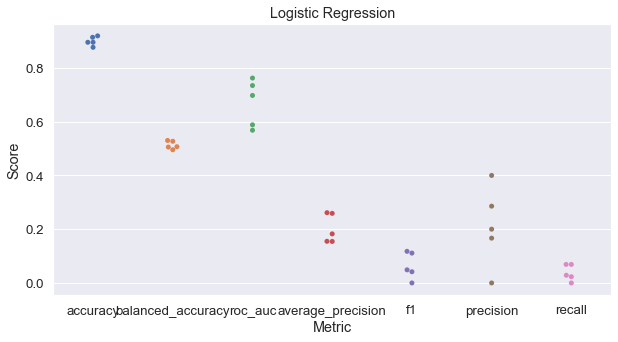

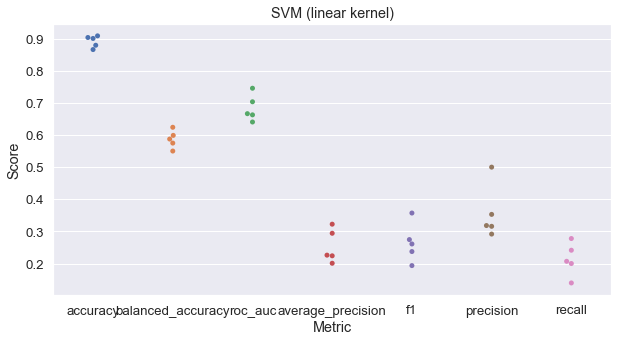

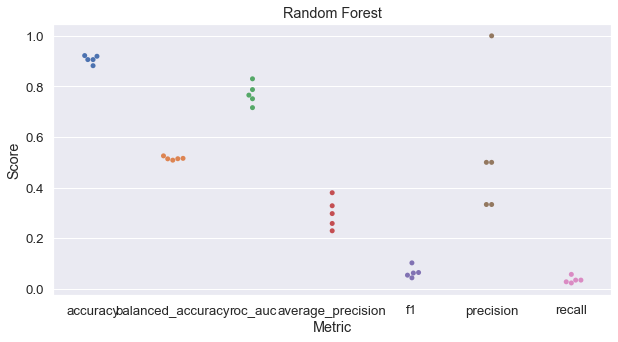

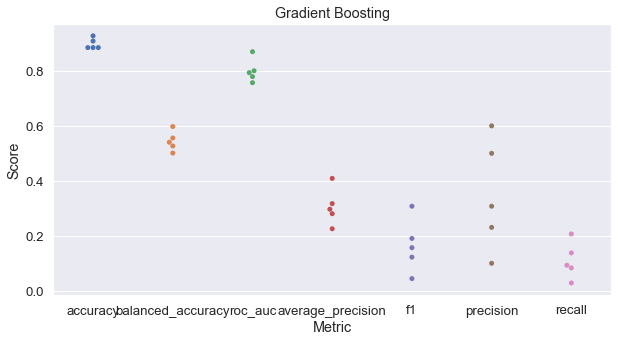

In [619]:
k = 5
# types of scoring paramters 
# https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
metric = ["accuracy", "balanced_accuracy", "roc_auc", "average_precision", "f1", "precision", "recall"]

models = [("Logistic Regression", LogisticRegression()),
          ("SVM (linear kernel)", SVC(kernel="linear")),
          #("SVM (RBF kernel)", SVC()),
          ("Random Forest",  RandomForestClassifier()),
          ("Gradient Boosting", GradientBoostingClassifier())]
results = []

for name, model in models:
    kfold = model_selection.KFold(n_splits=k, shuffle=True, random_state=seed)
    scores = model_selection.cross_validate(model, X_train, y_train, scoring=metric, cv=kfold)
    results.append((name, scores))

fig_size = (10, 5)
for name, scores in results:
    scores_df = pd.DataFrame.from_dict(scores).drop(columns=["fit_time", "score_time"])
    scores_df.columns = [col[5:] for col in scores_df.columns]
    scores_df = pd.melt(scores_df, var_name="Metric", value_name="Score")
    plt.figure(figsize=fig_size)
    ax = sns.swarmplot(data=scores_df, x="Metric", y="Score")
    ax.set_title(name)
    plt.show()
    print("\n\n")

In [620]:
results

[('Logistic Regression',
  {'fit_time': array([0.13514495, 0.03368092, 0.03450108, 0.03307223, 0.03319407]),
   'score_time': array([0.01659012, 0.008641  , 0.00735497, 0.00865579, 0.00774193]),
   'test_accuracy': array([0.89544236, 0.8766756 , 0.89544236, 0.91935484, 0.91397849]),
   'test_balanced_accuracy': array([0.50688926, 0.5055673 , 0.49554896, 0.53010958, 0.52719413]),
   'test_roc_auc': array([0.58833474, 0.76236786, 0.56816683, 0.73449281, 0.69759727]),
   'test_average_precision': array([0.15498822, 0.26141408, 0.15446566, 0.25893837, 0.18256421]),
   'test_f1': array([0.04878049, 0.04166667, 0.        , 0.11764706, 0.11111111]),
   'test_precision': array([0.16666667, 0.2       , 0.        , 0.4       , 0.28571429]),
   'test_recall': array([0.02857143, 0.02325581, 0.        , 0.06896552, 0.06896552])}),
 ('SVM (linear kernel)',
  {'fit_time': array([361.04823613, 233.30111623, 851.48727894, 366.74064803,
          606.775599  ]),
   'score_time': array([0.05975914, 0.048

**Logistic Regression Tuning**

In [82]:
metric = ["accuracy", "balanced_accuracy", "roc_auc", "average_precision", "f1", "precision", "recall"]
def validation_results(clf, X_val, y_val, name, results):
    y_pred = clf.predict(X_val)
    if "SVM" in name:
        y_score = clf.decision_function(X_val)
    else:
        y_score = clf.predict_proba(X_val)[:, 1]
    
    acc = metrics.accuracy_score(y_val, y_pred)
    bal_acc = metrics.balanced_accuracy_score(y_val, y_pred)
    roc_auc = metrics.roc_auc_score(y_val, y_score)
    avg_prec = metrics.average_precision_score(y_val, y_score)
    f1 = metrics.f1_score(y_val, y_pred)
    precision = metrics.precision_score(y_val, y_pred)
    recall = metrics.recall_score(y_val, y_pred)     
    results[name] = {"accuracy": acc,
                     "balanced_accuracy": bal_acc,
                     "roc_auc": roc_auc,
                     "average_precision": avg_prec,
                     "f1": f1,
                     "precision": precision,
                     "recall": recall}
    
    return results

In [579]:
solvers = ["newton-cg", "lbfgs", "liblinear", "sag", "saga"]
penalties = ["l1", "l2"]
C_values = [100, 10, 1.0, 0.1, 0.01] # smaller values = stronger regularization
#C_values = np.arange(0.005, 0.02, 0.001)
i = 0
results = {}
models = []
for solver, penalty, C in it.product(solvers, penalties, C_values):
    if solver in ["newton-cg", "sag", "lbfgs"] and penalty != "l2":
        # skip parameter configurations not supported by scikit-learn
        continue
        
    print("Model #{i} Hyperparameters => Solver: {s}, Penalty: {p}, C: {c}".format(i=i, s=solver, p=penalty, c=C))
    if solver in ["sag", "saga", "liblinear"]:
        # these solvers first shuffle the data, so include random seed
        model = LogisticRegression(solver=solver, penalty=penalty, C=C, random_state=seed)
    else:
        model = LogisticRegression(solver=solver, penalty=penalty, C=C)
    model.fit(X_train, y_train)
    models.append(model)
    results = validation_results(model, X_val, y_val, "Model #%d" % i, results)
    i += 1

Model #0 Hyperparameters => Solver: newton-cg, Penalty: l2, C: 100
Model #1 Hyperparameters => Solver: newton-cg, Penalty: l2, C: 10
Model #2 Hyperparameters => Solver: newton-cg, Penalty: l2, C: 1.0
Model #3 Hyperparameters => Solver: newton-cg, Penalty: l2, C: 0.1
Model #4 Hyperparameters => Solver: newton-cg, Penalty: l2, C: 0.01
Model #5 Hyperparameters => Solver: lbfgs, Penalty: l2, C: 100
Model #6 Hyperparameters => Solver: lbfgs, Penalty: l2, C: 10
Model #7 Hyperparameters => Solver: lbfgs, Penalty: l2, C: 1.0
Model #8 Hyperparameters => Solver: lbfgs, Penalty: l2, C: 0.1
Model #9 Hyperparameters => Solver: lbfgs, Penalty: l2, C: 0.01
Model #10 Hyperparameters => Solver: liblinear, Penalty: l1, C: 100
Model #11 Hyperparameters => Solver: liblinear, Penalty: l1, C: 10
Model #12 Hyperparameters => Solver: liblinear, Penalty: l1, C: 1.0
Model #13 Hyperparameters => Solver: liblinear, Penalty: l1, C: 0.1
Model #14 Hyperparameters => Solver: liblinear, Penalty: l1, C: 0.01
Model #15 

In [84]:
def plot_validation_results(results, model_name, fig_size=(10, 8)):
    results_df = pd.DataFrame()
    for name, result in results.items():
        results_df = results_df.append(result, ignore_index=True)

    results_df = pd.melt(results_df, var_name="Metric", value_name="Score")
    results_df["Name"] = list(results.keys()) * len(metric)

    ncol = (len(results.keys()) // 20) + 1
    plt.figure(figsize=fig_size)
    ax = sns.swarmplot(data=results_df, x="Metric", y="Score", hue="Name")
    ax.set_title("Performance of %s Models with Varied Hyperparameters" % model_name)
    plt.legend(bbox_to_anchor=(1.5, 1), loc="upper right", ncol=ncol)
    plt.show()
    
    print("\n\n")

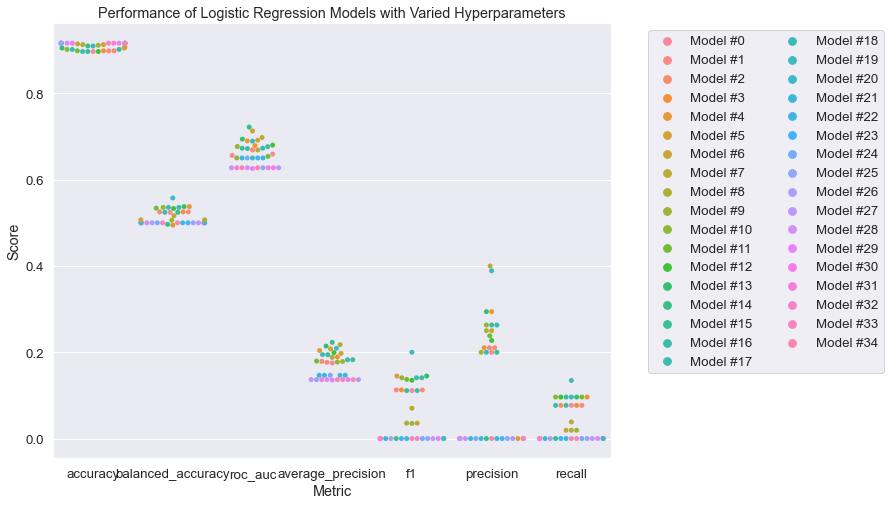

In [580]:
plot_validation_results(results, "Logistic Regression")

In [86]:
def filter_validation_results(results, metric_name, threshold):
    filtered_models = []
    for name, result in results.items():
        if result[metric_name] > threshold:
            print(name)
            filtered_models.append(name)
            
    return filtered_models

def find_models(filtered_results):
    for model_name in filtered_results:
        print(model_name)
        print(results[model_name])
        print()

In [581]:
p_6 = filter_validation_results(results, "precision", 0.35)

Model #7
Model #19


In [582]:
find_models(p_6)

Model #7
{'accuracy': 0.9147909967845659, 'balanced_accuracy': 0.5165991902834008, 'roc_auc': 0.6978070175438597, 'average_precision': 0.21754820337109224, 'f1': 0.07017543859649124, 'precision': 0.4, 'recall': 0.038461538461538464}

Model #19
{'accuracy': 0.909967845659164, 'balanced_accuracy': 0.5576585695006748, 'roc_auc': 0.6894399460188934, 'average_precision': 0.209207193547261, 'f1': 0.19999999999999998, 'precision': 0.3888888888888889, 'recall': 0.1346153846153846}



In [583]:
p_5 = filter_validation_results(results, "precision", 0.35)

Model #7
Model #19


In [584]:
r_1 = filter_validation_results(results, "recall", 0.1)

Model #19


In [585]:
good_models = set(p_5).intersection(set(r_1))
find_models(good_models)

Model #19
{'accuracy': 0.909967845659164, 'balanced_accuracy': 0.5576585695006748, 'roc_auc': 0.6894399460188934, 'average_precision': 0.209207193547261, 'f1': 0.19999999999999998, 'precision': 0.3888888888888889, 'recall': 0.1346153846153846}



In [586]:
f1_2 = filter_validation_results(results, "f1", 0.15)

Model #19


In [587]:
find_models(f1_2)

Model #19
{'accuracy': 0.909967845659164, 'balanced_accuracy': 0.5576585695006748, 'roc_auc': 0.6894399460188934, 'average_precision': 0.209207193547261, 'f1': 0.19999999999999998, 'precision': 0.3888888888888889, 'recall': 0.1346153846153846}



In [94]:
def plot_roc_pr_curves(X, y, clf, data, model, fig_size=(10, 8)):
    #fig, (ax1, ax2) = plt.subplots(1, 2)
    fig, ax = plt.subplots(1,1,figsize=fig_size)
    roc_disp = metrics.plot_roc_curve(clf, X, y, ax=ax)
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.set_title("Receiver Operating Characteristic (ROC) Curve")
    plt.show()
    title = data + '_' + model + '_validation_roc.svg'
    fig.savefig(title, format='svg', dpi=1200)

    # PR Curve and AP (average precision)
    fig, ax = plt.subplots(1,1,figsize=fig_size)
    pr_disp = metrics.plot_precision_recall_curve(clf, X_test, y_test, ax=ax)
    ax.set_xlabel("Recall")
    ax.set_ylabel("Precision")
    ax.set_title("Precision-Recall (PR) Curve")
    plt.show()
    title = data + '_' + model + '_validation_pr.svg'
    fig.savefig(title, format='svg', dpi=1200)

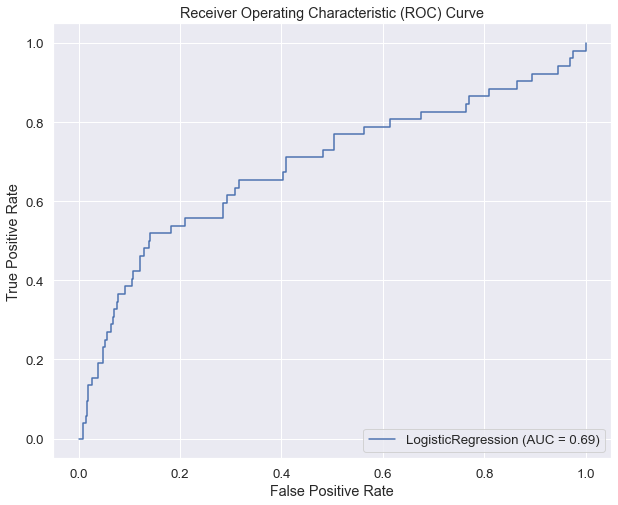

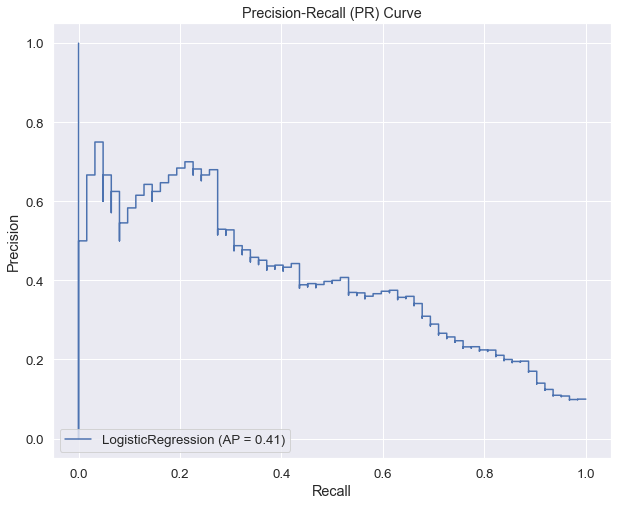

In [588]:
best_model_num = 19
lr_best_model = models[best_model_num]
plot_roc_pr_curves(X_val, y_val, lr_best_model, 'starr', 'lr')

##### Ensemble-based models: Gradient Boosting and Random Forest

In [297]:
ensemble_results = {}
ensemble_models = {}

**Gradient Boosting Classifier**

**Baseline scikit-learn settings**

n_estimators = 100 (number of trees)

max_depth = 3

min_samples_split = 2

min_samples_leaf = 1

subsample = 1.0


learning_rate = 0.1 (shrinkage)

subsample = 1

In [298]:
# Baseline model
gb_baseline = GradientBoostingClassifier(learning_rate = 0.1, n_estimators = 100, max_depth = 3, min_samples_split = 2, 
                                     min_samples_leaf = 1, subsample = 1, max_features = "sqrt", random_state = seed)
gb_baseline.fit(X_train, y_train)

ensemble_results = validation_results(gb_baseline, X_val, y_val, "GB baseline", ensemble_results)
ensemble_models["GB baseline"] = gb_baseline

In [397]:
param_1 = {'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1, 0.15, .25, .5, .75, 1], 'n_estimators': [200, 220, 240, 260, 280, 300]}
param_2 = {'learning_rate':  [0.001, 0.005, 0.01, 0.05, 0.1, 0.15, .25, .5, .75, 1], 'n_estimators': [100, 250, 500, 750, 1000, 1250, 1500, 1750]}
param_3 = {'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1, 0.15, .25, .5, .75, 1], 'n_estimators': [100, 250, 500, 750, 1000, 1250, 1500, 1750], 'max_depth': [2, 3, 4]}
param_4 = {'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1, 0.15, .25, .5, .75, 1], 
              'n_estimators': [100, 250, 500, 750, 1000, 1250, 1500, 1750], 
             'max_depth': [2, 3, 4], 
             'max_features': [3, 4, 5]}

In [398]:
# GBM with param_1
tuning = model_selection.GridSearchCV(estimator = GradientBoostingClassifier(subsample = 1, max_features= 'sqrt',
                                                                             n_estimators = 100,
                                                             max_depth = 3, min_samples_split = 2, min_samples_leaf = 1,
                                                             random_state = seed), 
                     param_grid = param_1, scoring = 'roc_auc', n_jobs = 4, cv = 5)
tuning.fit(X_train, y_train)
tuning.cv_results_, tuning.best_params_, tuning.best_score_

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

({'mean_fit_time': array([0.34970956, 0.39369121, 0.44754796, 0.46340413, 0.44411931,
         0.47250729, 0.27938995, 0.30642262, 0.33957062, 0.36179934,
         0.41894689, 0.56056981, 0.299965  , 0.3573472 , 0.35565557,
         0.45491381, 0.52052402, 0.55456119, 0.39073973, 0.32458572,
         0.3824441 , 0.39237685, 0.43293114, 0.40920982, 0.27987714,
         0.3068758 , 0.32826991, 0.37328801, 0.38782558, 0.41087055,
         0.27977085, 0.30136862, 0.33482218, 0.35327001, 0.39901452,
         0.42126942, 0.28401818, 0.30345116, 0.3366169 , 0.376583  ,
         0.39305525, 0.43053923, 0.29215422, 0.30930934, 0.33577571,
         0.37946935, 0.43542414, 0.41652164, 0.28551817, 0.33684306,
         0.33827643, 0.37849312, 0.40842643, 0.4136363 , 0.285288  ,
         0.33969359, 0.39781699, 0.37480187, 0.39341435, 0.42856002]),
  'std_fit_time': array([0.01638829, 0.02419396, 0.02577867, 0.01015453, 0.0149952 ,
         0.03889793, 0.00556452, 0.00178391, 0.00448027, 0.00258221,

In [412]:
# GBM with param_2
tuning = model_selection.GridSearchCV(estimator = GradientBoostingClassifier(subsample = 1, max_features= 'sqrt',
                                                             max_depth = 3, min_samples_split = 2, min_samples_leaf = 1,
                                                             random_state = seed), 
                     param_grid = param_2, scoring = 'roc_auc', n_jobs = 4, cv = 5)
tuning.fit(X_train, y_train)
tuning.cv_results_, tuning.best_params_, tuning.best_score_

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

({'mean_fit_time': array([0.19634271, 0.45699782, 0.83207092, 1.32484412, 1.61179223,
         1.87059355, 2.19009895, 2.47315879, 0.14380627, 0.36222653,
         0.71999545, 1.06015177, 1.39528189, 1.72907534, 2.18896909,
         2.55863609, 0.14201798, 0.35118179, 0.79617062, 1.1490098 ,
         1.47178226, 1.70485969, 2.00390444, 2.35904136, 0.14356747,
         0.34319563, 0.70586591, 1.09359169, 1.3698545 , 1.73055644,
         2.23769889, 2.98278379, 0.18273988, 0.71878901, 1.84695868,
         2.69778919, 2.83509789, 3.60417309, 3.33317513, 3.15984845,
         0.17286978, 0.53035078, 0.86908593, 1.20461893, 1.55992265,
         1.95086198, 2.77347975, 3.19424887, 0.1904902 , 0.42556224,
         0.78521681, 1.41001353, 1.77917562, 1.96512437, 2.34414678,
         3.57459922, 0.22478337, 0.59590549, 0.87671108, 1.28144155,
         1.70926843, 2.31702166, 2.34618583, 3.42200279, 0.21915121,
         0.51598191, 0.96177368, 1.17728   , 2.00836673, 2.007796  ,
         2.465937

In [413]:
# GBM with param_3
tuning = model_selection.GridSearchCV(estimator = GradientBoostingClassifier(subsample = 1, max_features= 'sqrt',
                                                             min_samples_split = 2, min_samples_leaf = 1,
                                                             random_state = seed), 
                     param_grid = param_3, scoring = 'roc_auc', n_jobs = 4, cv = 5)
tuning.fit(X_train, y_train)
tuning.cv_results_, tuning.best_params_, tuning.best_score_

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

({'mean_fit_time': array([0.1491148 , 0.40607324, 0.74055476, 0.97520747, 1.27974381,
         1.89098902, 1.97140603, 2.98699927, 0.31365399, 0.49991016,
         0.95829563, 1.41315098, 1.96223145, 2.2738976 , 2.43975844,
         2.69399118, 0.21174536, 0.47079906, 1.11566715, 1.65609732,
         2.20610557, 2.74984202, 3.1514936 , 3.73700819, 0.10894842,
         0.2659709 , 1.0356595 , 1.26804075, 1.35085902, 1.26366968,
         1.55272393, 1.83706079, 0.15548463, 0.39793601, 0.77017331,
         1.04988956, 1.56690364, 2.33584733, 2.7509038 , 2.86316385,
         0.21023502, 0.45983748, 1.01103582, 1.91066184, 2.14150529,
         2.40674539, 3.20188241, 4.02722921, 0.1237258 , 0.49102783,
         0.71700301, 1.07672925, 1.53963776, 2.26630182, 2.14940028,
         1.97595596, 0.18475232, 0.39332256, 0.74554501, 1.11216846,
         1.54547143, 2.03742757, 2.33166332, 2.66920185, 0.20422907,
         0.54263225, 1.15131931, 1.79445758, 2.90222321, 2.8553359 ,
         3.058043

In [414]:
# GBM with param_4
tuning = model_selection.GridSearchCV(estimator = GradientBoostingClassifier(subsample = 1, 
                                                             min_samples_split = 2, min_samples_leaf = 1,
                                                             random_state = seed), 
                     param_grid = param_4, scoring = 'roc_auc', n_jobs = 4, cv = 5)
tuning.fit(X_train, y_train)
tuning.cv_results_, tuning.best_params_, tuning.best_score_

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

({'mean_fit_time': array([0.08450561, 0.1827517 , 0.3281064 , 0.45228829, 0.60419674,
         0.77086039, 0.89667201, 1.00054049, 0.06729259, 0.16485915,
         0.32735591, 0.48033218, 0.64222116, 0.79758921, 0.95642929,
         1.11141539, 0.07702084, 0.17570724, 0.35377884, 0.52452636,
         0.70362267, 0.86724901, 1.03848095, 1.21822886, 0.08184037,
         0.19935689, 0.39016356, 0.57914877, 0.78278213, 0.95678682,
         1.153198  , 1.33952661, 0.09188404, 0.22138591, 0.44022813,
         0.66313238, 0.8578434 , 1.07320247, 1.27369781, 2.52355294,
         0.39147739, 0.3471611 , 0.57738357, 0.86163116, 1.20728874,
         1.78656702, 3.3216804 , 4.73695731, 0.2580163 , 0.72335224,
         0.80966516, 1.97140999, 2.48271194, 2.01748824, 2.47412615,
         1.99029584, 0.12687769, 0.29735999, 0.5835938 , 0.85633187,
         1.17207484, 1.40744982, 1.69689641, 1.95041966, 0.13319645,
         0.3182168 , 0.63810759, 0.92937527, 1.24194694, 1.53108096,
         1.843529

In [399]:
gb_model_param1 = GradientBoostingClassifier(learning_rate = 1, n_estimators = 280, random_state = seed)
gb_model_param1.fit(X_train, y_train)
predictions = gb_model_param1.predict(X_val)
print(metrics.classification_report(y_val, predictions))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94       570
           1       0.23      0.17      0.20        52

    accuracy                           0.88       622
   macro avg       0.58      0.56      0.57       622
weighted avg       0.87      0.88      0.87       622



In [415]:
gb_model_param2 = GradientBoostingClassifier(learning_rate = 0.005,n_estimators = 1250, random_state = seed)
gb_model_param2.fit(X_train, y_train)
predictions = gb_model_param2.predict(X_val)
print(metrics.classification_report(y_val, predictions))

              precision    recall  f1-score   support

           0       0.92      0.99      0.95       570
           1       0.11      0.02      0.03        52

    accuracy                           0.91       622
   macro avg       0.51      0.50      0.49       622
weighted avg       0.85      0.91      0.87       622



In [416]:
gb_model_param3 = GradientBoostingClassifier(learning_rate = 0.005, n_estimators = 1250, max_depth = 4, random_state = seed)
gb_model_param3.fit(X_train, y_train)
predictions = gb_model_param3.predict(X_val)
print(metrics.classification_report(y_val, predictions))

              precision    recall  f1-score   support

           0       0.92      0.98      0.95       570
           1       0.00      0.00      0.00        52

    accuracy                           0.90       622
   macro avg       0.46      0.49      0.47       622
weighted avg       0.84      0.90      0.87       622



In [417]:
gb_model_param4 = GradientBoostingClassifier(learning_rate = 0.1, max_depth = 2, max_features = 5,
                                             n_estimators = 100, random_state = seed)
gb_model_param4.fit(X_train, y_train)
predictions = gb_model_param4.predict(X_val)
print(metrics.classification_report(y_val, predictions))

              precision    recall  f1-score   support

           0       0.92      0.98      0.95       570
           1       0.10      0.02      0.03        52

    accuracy                           0.90       622
   macro avg       0.51      0.50      0.49       622
weighted avg       0.85      0.90      0.87       622



In [421]:
gb_best_model = gb_model_param3
ensemble_models["GB best model"] = gb_best_model

Random Forest Classifier

In [141]:
rf = RandomForestClassifier(random_state = seed)

# Look at parameters in rf 
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 212,
 'verbose': 0,
 'warm_start': False}


In [142]:
rf_baseline = RandomForestClassifier(random_state = seed)
rf_baseline.fit(X_train, y_train)

ensemble_results = validation_results(rf_baseline, X_val, y_val, "RF baseline", ensemble_results)
ensemble_models["RF baseline"] = rf_baseline

In [143]:
# Random search grid
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree 
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node 
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True, False]

In [144]:
# Create random grid
random_grid = {'n_estimators': n_estimators, 
              'max_features': max_features, 
              'max_depth': max_depth, 
              'min_samples_split': min_samples_split, 
              'min_samples_leaf': min_samples_leaf, 
              'bootstrap': bootstrap}

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}


In [145]:
# Random search training
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation
# Search across 100 different combinations, and use all available cores
rf_random = model_selection.RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 5, random_state = seed, 
                              n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)
rf_random_model = rf_random.best_estimator_

ensemble_results = validation_results(rf_random_model, X_val, y_val, "RF best model (Random Search)", ensemble_results)
ensemble_models["RF best model (Random Search)"] = rf_random_model

# View best parameters
rf_random.best_params_

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

{'n_estimators': 200,
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': 'auto',
 'max_depth': 90,
 'bootstrap': True}

In [146]:
param_grid = {
    'bootstrap':[True],
    'max_depth': [9, 10, 11], 
    'max_features': [3, 4, 5, 6],
    'min_samples_leaf': [1, 2, 3, 4],
    'min_samples_split': [1, 2, 3, 4], 
    'n_estimators': [400, 500, 600, 700, 800, 900]
}

In [147]:
# Create a base model
rf = RandomForestClassifier()

# Instantiate the grid search model
grid_search = model_selection.GridSearchCV(estimator = rf, param_grid = param_grid, cv = 5, n_jobs = -1, verbose = 2)

In [148]:
# Fit grid to search data
grid_search.fit(X_train, y_train)

# Best model
rf_grid_model = grid_search.best_estimator_

ensemble_results = validation_results(rf_grid_model, X_val, y_val, "RF best model (Grid Search)", ensemble_results)
ensemble_models["Rf best model (Grid Search)"] = rf_grid_model

grid_search.best_params_

Fitting 5 folds for each of 1152 candidates, totalling 5760 fits


/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=700; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   2.8s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total time=   1.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=800; total time=   2.7s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=700; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   2.9s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total time=   1.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=700; total time=   2.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=800; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   1.8s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   2.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=400; total time=   1.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total time=   1.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   1.8s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   2.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=400; total time=   1.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total time=   1.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   1.9s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   2.8s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=400; total time=   1.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total time=   1.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=700; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.7s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   2.9s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=400; total time=   1.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=600; total time=   2.0s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/usr/lo

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=800; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   2.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   3.1s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=600; total time=   1.9s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=800; total time=   2.7s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "/u

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=700; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   1.9s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   2.8s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=400; total time=   1.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=600; total time=   1.9s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=700; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   2.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   3.1s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=600; total time=   1.9s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=800; total time=   2.7s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=800; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   2.7s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   3.0s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=600; total time=   2.0s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=900; total time=   3.1s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=800; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   2.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   3.0s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=700; total time=   2.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=900; total time=   3.1s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklea

[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=1, n_estimators=800; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   1.8s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   2.6s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   3.0s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=700; total time=   2.3s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, min_samples_split=3, n_estimators=900; total time=   3.2s
[CV] END bootstrap=True, max_depth=9, max_features=3, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=2, n_estimators=700; total time=   2.9s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=3, n_estimators=400; total time=   1.7s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=3, n_estimators=500; total time=   2.1s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=3, n_estimators=700; total time=   2.8s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=400; total time=   1.6s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   2.1s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=700; total time=   3.0s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.8s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=600; total time=   2.7s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   4.0s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=600; total time=   2.9s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=800; total time=   3.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=700; total time=   3.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   2.1s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=700; total time=   2.9s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=800; total time=   3.7s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=1, n_estimators=500; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=1, n_estimators=500; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=1, n_estimators=700; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=1, n_estimators=800; total time=   0.7s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   3.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=700; total time=   3.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=900; total time=   4.0s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=700; total time=   3.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=900; total time=   4.9s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   2.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "/u

[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=400; total time=   1.6s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=400; total time=   1.7s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=600; total time=   2.4s
[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=900; total time=   3.9s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   3.1s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=400; total time=   1.8s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "/u

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=2, n_estimators=800; total time=   3.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=3, n_estimators=500; total time=   2.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=3, n_estimators=700; total time=   3.7s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=4, n_estimators=400; total time=   1.7s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=4, n_estimators=700; total time=   3.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=4, n_estimators=900; total time=   4.0s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=800; total time=   3.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=700; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=800; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=800; total time=   3.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   3.1s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   4.0s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=600; total time=   2.9s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=900; total time=   4.0s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=600; total time=   2.6s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=4, n_estimators=800; total time=   4.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, min_samples_split=1, n_estimators=800; total time=   0.6s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=2, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=800; total time=   0.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.6s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   3.1s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, min_samples_split=3, n_estimators=400; total time=   1.8s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=1, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklea

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=2, n_estimators=900; total time=   3.9s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=3, n_estimators=700; total time=   3.0s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=3, n_estimators=900; total time=   4.5s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=4, n_estimators=700; total time=   3.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=4, n_estimators=900; total time=   4.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   3.6s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 1041, in __call__
    if self.dispatch_one_batch(iterator):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/joblib/parallel.py", line 859, in dispatch_one_batch
    self._dispatch(tasks)
  File "/u

[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=3, n_estimators=800; total time=   3.6s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=4, n_estimators=500; total time=   2.6s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=3, min_samples_split=4, n_estimators=700; total time=   3.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, min_samples_split=1, n_estimators=400; total time=   0.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, min_samples_split=1, n_estimators=400; total time=   0.2s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=9, max_features=6, min_samples_leaf=4, mi

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=3, min_samples_split=4, n_estimators=700; total time=   2.9s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=1, n_estimators=500; total time=   0.4s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=1, n_estimators=500; total time=   0.4s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=1, n_estimators=700; total time=   0.5s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=500; total time=   2.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=800; total time=   3.5s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=3, n_estimators=400; total time=   2.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=3, n_estimators=500; total time=   2.8s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=3, n_estimators=800; total time=   4.1s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=4, n_estimators=400; total time=   1.9s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=4, n_estimators=500; total time=   2.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=500; total time=   2.0s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=700; total time=   2.8s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=400; total time=   1.6s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   2.0s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=700; total time=   2.8s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=1, n_estimators=900; total time=   0.6s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=2, n_estimators=400; total time=   1.8s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=2, n_estimators=700; total time=   3.1s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=2, n_estimators=900; total time=   4.2s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=3, n_estimators=700; total time=   3.2s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=3, n_estimators=900; total time=   4.0s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=4, n_estimators=600; total time=   2.7s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=600; total time=   2.4s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=800; total time=   3.2s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   2.0s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=800; total time=   3.2s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/ensemble/_forest.py", line 387, in fit
    trees = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/usr/lo

[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=2, n_estimators=900; total time=   3.5s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=600; total time=   2.4s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=800; total time=   3.2s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=400; total time=   1.6s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=600; total time=   2.5s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=900; total time=   3.7s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=2, n_estimators=500; total time=   2.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=4, n_estimators=600; total time=   2.7s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=4, n_estimators=800; total time=   4.0s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=1, n_estimators=700; total time=   0.4s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=1, n_estimators=900; total time=   0.5s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=2, n_estimators=400; total time=   1.7s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=2, n_estimators=600; total time=   2.6s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=2, n_estimators=900; total time=   4.2s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   2.4s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=2, n_estimators=700; total time=   2.7s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=400; total time=   1.6s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=500; total time=   2.0s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=3, n_estimators=700; total time=   2.8s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=400; total time=   1.6s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   2.0s
[CV] END bootstrap=True, max_depth=10, max_features=4, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=3, n_estimators=900; total time=   4.0s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=4, n_estimators=700; total time=   3.1s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=1, min_samples_split=4, n_estimators=900; total time=   4.1s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=600; total time=   2.7s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=2, n_estimators=800; total time=   3.7s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=3, n_estimators=400; total time=   2.5s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=2, min_samples_split=3, n_estimators=600; total time=   3.4s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=1, n_estimators=900; total time=   0.6s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=2, n_estimators=500; total time=   2.1s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=2, n_estimators=800; total time=   3.6s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=3, n_estimators=400; total time=   1.7s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=3, n_estimators=500; total time=   2.6s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=3, n_estimators=800; total time=   3.8s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=4, n_estimators=400; total time=   2.0s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=4, n_estimators=500; total time=   2.4s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=4, n_estimators=700; total time=   3.0s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=3, min_samples_split=4, n_estimators=900; total time=   4.1s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=2, n_estimators=500; total time=   2.2s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=2, n_estimators=800; total time=   3.6s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=3, n_estimators=400; total time=   1.8s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=3, n_estimators=600; total time=   2.8s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=3, n_estimators=800; total time=   3.9s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_leaf=4, min_samples_split=4, n_estimators=500; total time=   2.3s
[CV] END bootstrap=True, max_depth=10, max_features=5, min_samples_le

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:598: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib

{'bootstrap': True,
 'max_depth': 9,
 'max_features': 4,
 'min_samples_leaf': 3,
 'min_samples_split': 3,
 'n_estimators': 500}

In [149]:
ensemble_results

{'GB baseline': {'accuracy': 0.9067524115755627,
  'balanced_accuracy': 0.5209514170040486,
  'roc_auc': 0.7628205128205128,
  'average_precision': 0.21509909206177022,
  'f1': 0.09375,
  'precision': 0.25,
  'recall': 0.057692307692307696},
 'RF baseline': {'accuracy': 0.909967845659164,
  'balanced_accuracy': 0.4964912280701754,
  'roc_auc': 0.7591093117408907,
  'average_precision': 0.20952103346506756,
  'f1': 0.0,
  'precision': 0.0,
  'recall': 0.0},
 'RF best model (Random Search)': {'accuracy': 0.9147909967845659,
  'balanced_accuracy': 0.49912280701754386,
  'roc_auc': 0.7674257759784076,
  'average_precision': 0.24384478842275925,
  'f1': 0.0,
  'precision': 0.0,
  'recall': 0.0},
 'RF best model (Grid Search)': {'accuracy': 0.9147909967845659,
  'balanced_accuracy': 0.49912280701754386,
  'roc_auc': 0.7782726045883941,
  'average_precision': 0.24369171304798157,
  'f1': 0.0,
  'precision': 0.0,
  'recall': 0.0}}

Visualize model performance on validation set.

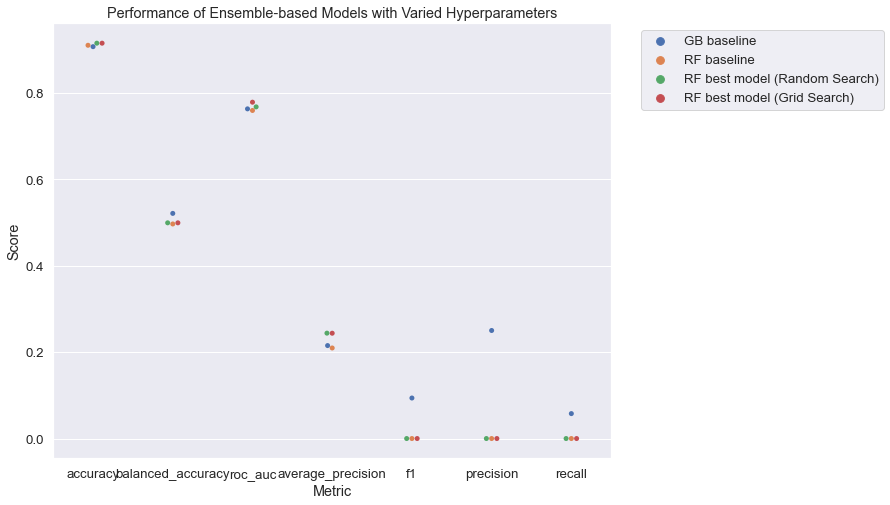




[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples_leaf=3, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples_leaf=3, min_samples_split=1, n_estimators=400; total time=   0.3s
[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples_leaf=3, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples_leaf=3, min_samples_split=1, n_estimators=500; total time=   0.3s
[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples_leaf=3, min_samples_split=1, n_estimators=600; total time=   0.4s
[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples_leaf=3, min_samples_split=1, n_estimators=700; total time=   0.5s
[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples_leaf=3, min_samples_split=1, n_estimators=800; total time=   0.6s
[CV] END bootstrap=True, max_depth=11, max_features=4, min_samples

In [150]:
plot_validation_results(ensemble_results, "Ensemble-based")

Best ensemble-based and logistic regression model.

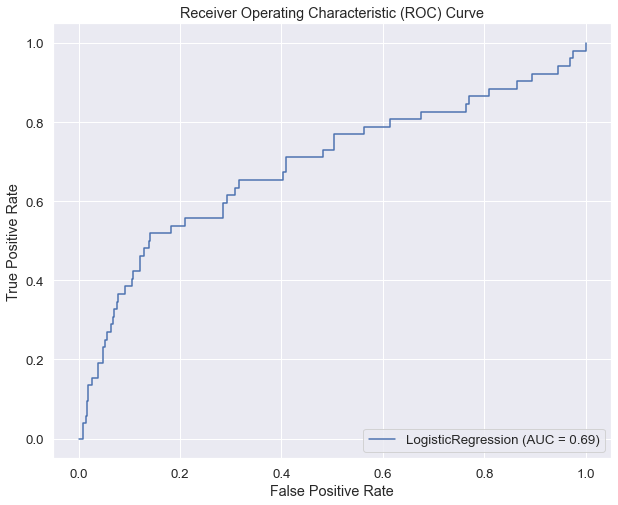

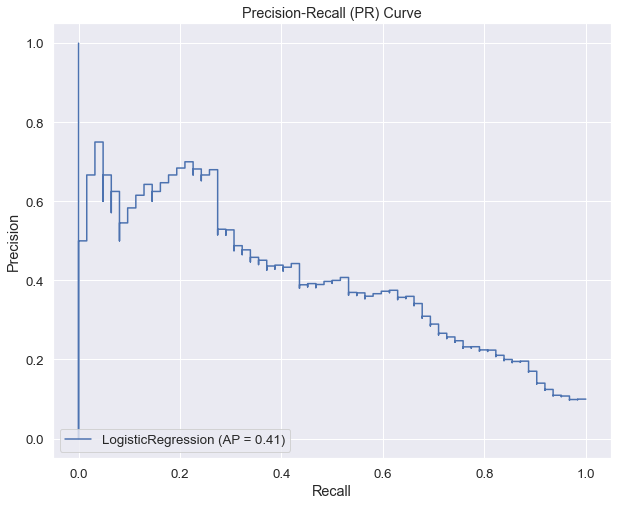

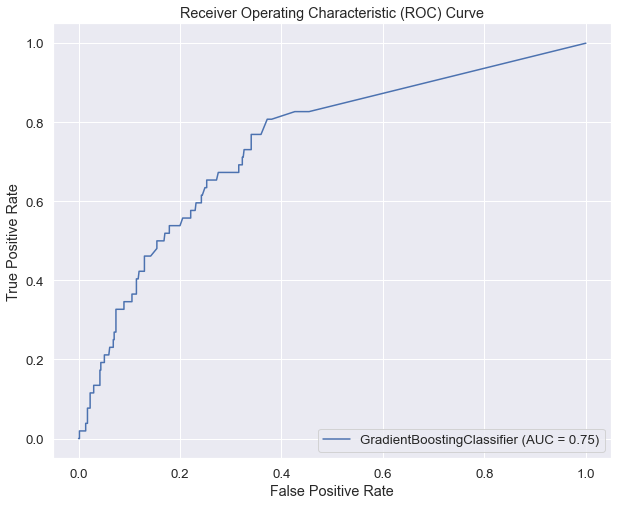

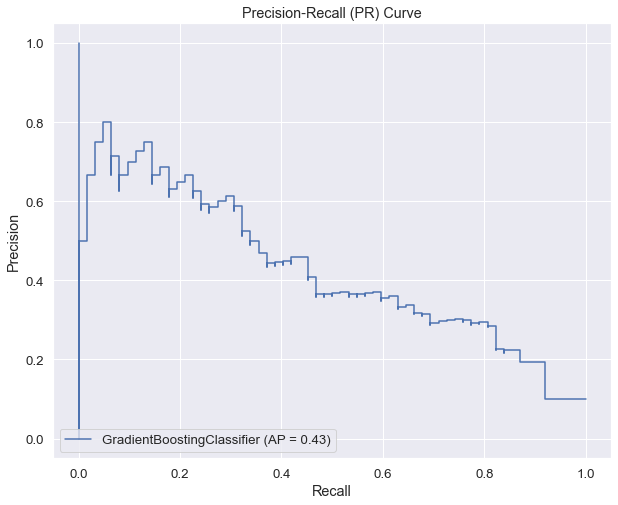

In [313]:
plot_roc_pr_curves(X_val, y_val, lr_best_model, 'starr', 'lr')
plot_roc_pr_curves(X_val, y_val, gb_best_model, 'starr', 'gbm')

#plt.savefig('gbm_internal.eps', format='eps')

In [242]:
##### TEST CELL
test = X_test.sample(frac = 0.01)
print(test.index.values)
test_y = y_test.loc[test.index, :] 
print(test_y.index.values)

[2082  329 2665 1349  467  569]
[2082  329 2665 1349  467  569]


In [333]:
def test_model(clf, X, y, data, model, fig_size=(10,8)):
    # clf: trained classifier (i.e. after using fit function)
    y_pred = clf.predict(X)
    y_score = clf.decision_function(X)

    # print out stats
    accuracy = metrics.accuracy_score(y, y_pred)
    print("Model accuracy: %.3f\n" % accuracy)

    # precision, recall, and f1-score is usually reported for class 1 (in binary case)
    # recall of positive class (1) = sensitivity
    # recall of negative class (0) = specificity
    # preicion of positive class (1) = PPV
    # precision of negative class (0) = NPV
    print(metrics.classification_report(y,y_pred))

    # confusion matrix
    cm_disp = metrics.plot_confusion_matrix(clf, X, y)  

    # ROC Curve and AUC
    auroc = metrics.roc_auc_score(y, y_score)
    fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
    roc_disp = metrics.plot_roc_curve(clf, X, y, ax=ax_roc)
    ax_roc.set_xlabel("False Positive Rate")
    ax_roc.set_ylabel("True Positive Rate")
    ax_roc.set_title("Receiver Operating Characteristic (ROC) Curve")
    title = data + '_' + model + '_roc.svg'
    fig_roc.savefig(title, format='svg', dpi=1200)
    
    
    
    fpr, tpr, thresholds = metrics.roc_curve(y, y_score)

    # Find optimal AUROC threshold by g-means.
    gmeans = np.sqrt(tpr * (1-fpr)) # calculate g-mean for each threshold
    ix = np.argmax(gmeans) # locate the index of the largest g-mean
    print('Best G-Mean Threshold=%f, G-Mean=%.3f, Sensitivity=%.3f, Specificity=%.3f' % (thresholds[ix], gmeans[ix], tpr[ix], 1-fpr[ix]))
    
    # Find optimal AUROC threshold by Youden's J statistic
    J = tpr - fpr
    ix = np.argmax(J)
    best_thresh = thresholds[ix]
    print('Best Youdens J statistic Threshold=%f, Sensitivity=%.3f, Specificity=%.3f' % (best_thresh, tpr[ix], 1-fpr[ix]))
    
    
    # Prevalence
    pos = y.sum()
    prev = pos/y.shape[0]
    print('Readmission prevalence=%.3f' % (prev))
    
    # Sensitivity, specificity
    sens = tpr[ix]
    spec = 1-fpr[ix]
    
    # PPV, NPV
    ppv = (sens * prev)/((sens*prev) + (1-spec)*(1-prev))
    npv = (spec * (1-prev))/((spec*(1-prev)) + (prev*(1-sens)))
    print('PPV=%.3f, NPV=%.3f' % (ppv, npv))
    
    # F1-score
    f1 = 2*((ppv*sens)/(ppv + sens))
    print('F1-score=%.3f' % (f1))
    
    # PR Curve and AP (average precision)
    fig, ax_pr = plt.subplots(1,1,figsize=fig_size)
    pr_disp = metrics.plot_precision_recall_curve(clf, X, y, ax=ax_pr)
    ax_pr.set_xlabel("Recall")
    ax_pr.set_ylabel("Precision")
    ax_pr.set_title("Precision-Recall (PR) Curve")
    title = data + '_' + model + '_pr.svg'
    fig.savefig(title, format='svg', dpi=1200)

    """
    # alternatively we can report the auc of the pr curve
    precision, recall, _ = metrics.precision_recall_curve(y_test, y_score)
    pr_auc = metrics.auc(precision, recall)
    pr_disp = metrics.plot_precision_recall_curve(clf, X_test, y_test, name="Precision-Recall Curve: AP=%.3f" % ap)
    """

    plt.show()

In [569]:
X_train = X_train.reset_index()
del X_train['index']
X_train.head()
#X_train = pd.DataFrame(X_train)
#n = round(0.5*X_train.shape[0])
#test = X_train.loc[random.sample(range(0, X_train.shape[0]-1), n)][:]
#test.head()

,age,gender,ethnicity,icu_los,hospital_los,admit_ed,ecg,xray,cxr,mri,ct,intub_days,extub_hrs,diuretics,antihypertensives,inotrope_pressor,sedatives,alt_last,ast_last,hco3_last,bnp_last,bun_last,ck_last,cr_last,crp_last,dbili_last,esr_last,fio2_last,inr_last,hr_last,k_last,lac_last,ph_last,lipase_last,na_last,map_last,pao2_last,paco2_last,plt_last,spo2_last,temp_last,tbili_last,wbc_last,trop_last,hgb_last,gcs_last,pafio2_last,rass_last,alt_max,ast_max,hco3_max,bnp_max,bun_max,ck_max,cr_max,crp_max,esr_max,dbili_max,hr_max,k_max,inr_max,cortisol_max,lipase_max,lac_max,map_max,ph_max,na_max,paco2_max,pao2_max,spo2_max,tbili_max,trop_max,temp_max,wbc_max,gcs_max,rass_max,gcs_min,hco3_min,cortisol_min,hr_min,inr_min,k_min,map_min,ph_min,na_min,paco2_min,pao2_min,plt_min,spo2_min,temp_min,wbc_min,hgb_min,rass_min,hco3_high,bnp_high,bun_high,inflamm_marker,glu_high,hr_high,k_high,na_high,lac_high,temp_high,trop_high,wbc_high,map_high,hco3_low,hgb_low,map_low,hr_low,k_low,plt_low,na_low,wbc_low,temp_low
0,69.0,1.0,1.0,4.0,16.0,0.0,5.0,5.0,5.0,1.0,4.0,1.0,118.0,3.0,0.0,7.0,9.0,112.823529,61.000000,23.200000,4691.675127,10.0,71.000000,0.70,12.490909,1.00279,52.123596,0.447304,1.200000,73.0,3.5,1.900000,7.430000,317.673575,135.0,105.000000,64.000000,37.20000,416.0,100.0,98.2,0.800000,14.5,0.480684,7.7,15.000000,284.748328,0.000000,203.000000,203.000000,26.700000,4991.167513,13.0,71.000000,1.00,14.948701,52.797753,1.157745,202.0,4.4,1.40000,22.886929,397.502591,3.300000,303.0,7.570000,138.0,49.600000,333.000000,100.0,1.900000,3.056957,100.6,31.5,15.000000,3.000000,9.000000,20.200000,20.224786,36.0,1.10000,3.3,40.0,7.270000,130.0,30.000000,64.000000,348.0,75.0,97.5,13.1,5.2,-2.000000,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,3.0,0.0,0.0,10.0,53.0,0.0,13.0,12.0,1.0,0.0,0.0,0.0,0.0,0.0
1,37.0,1.0,4.0,3.0,10.0,1.0,0.0,6.0,3.0,1.0,6.0,1.0,73.0,0.0,0.0,0.0,5.0,112.823529,55.000000,22.600000,4691.675127,16.0,1559.000000,0.90,3.600000,1.00279,52.123596,0.400000,1.200000,73.0,3.4,1.700000,7.490000,118.000000,140.0,89.357159,107.000000,36.10000,120.0,100.0,100.0,0.500000,13.9,0.480684,8.3,15.000000,267.500000,0.000000,75.000000,75.000000,26.400000,4991.167513,21.0,1568.000000,1.50,3.600000,52.797753,1.157745,116.0,4.6,1.60000,22.886929,118.000000,9.500000,93.0,7.490000,145.0,41.000000,153.000000,100.0,1.400000,3.056957,100.4,23.9,15.000000,3.000000,6.000000,15.800000,20.224786,50.0,1.10000,3.4,46.0,7.260000,139.0,31.900000,67.000000,83.0,91.0,97.7,10.5,7.4,-4.000000,0.0,0.0,1.0,0.0,0.0,27.0,0.0,4.0,11.0,0.0,0.0,9.0,0.0,8.0,4.0,2.0,1.0,0.0,6.0,0.0,0.0,0.0
2,48.0,1.0,4.0,2.0,23.0,0.0,1.0,2.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,112.823529,68.000000,24.842267,4691.675127,7.0,902.716387,1.70,12.490909,0.10000,52.123596,0.447304,1.300000,112.0,3.6,1.572799,7.398839,317.673575,142.0,93.000000,113.784329,40.02109,239.0,95.0,99.7,0.300000,5.8,0.480684,6.8,14.216185,284.748328,-0.299594,27.000000,27.000000,26.740127,4991.167513,7.0,1349.638655,1.70,14.948701,52.797753,0.100000,135.0,3.6,1.30000,22.886929,397.502591,2.875795,105.0,7.442633,142.0,46.590527,202.723995,99.0,0.300000,3.056957,102.6,7.1,14.603795,0.860755,11.028083,21.298729,20.224786,103.0,1.30000,3.2,85.0,7.317522,137.0,35.200829,90.984634,205.0,92.0,98.1,5.8,6.8,-1.900202,0.0,0.0,0.0,0.0,0.0,21.0,0.0,1.0,0.0,3.0,0.0,0.0,4.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,51.0,0.0,4.0,2.0,3.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,112.823529,76.991732,24.842267,4691.675127,9.0,902.716387,0.28,12.490909,1.00279,52.123596,0.447304,1.388497,100.0,4.0,1.572799,7.330000,317.673575,133.0,81.000000,113.784329,40.02109,251.0,94.0,98.2,1.484057,17.5,0.480684,10.6,15.000000,284.748328,0.000000,142.547973,142.547973,26.740127,4991.167513,10.0,1349.638655,0.34,14.948701,52.797753,1.157745,186.0,4.7,1.60366,22.886929,397.502591,2.875795,120.0,7.330000,133.0,46.590527,202.723995,100.0,1.961885,3.056957,99.3,17.5,15.000000,0.000000,15.000000,21.298729,20.224786,76.0,1.31573,4.0,69.0,7.330000,131.0,35.200829,90.984634,18

In [576]:
##### IN PROGRESS
def bootstrap(clf, feat, label, dataset, model_type, fig_size = (10,8)):
    import scipy
    from random import sample
    
    feat = feat.reset_index()
    del feat['index']
    
    label = label.reset_index()
    del label['index']
    
    n_iterations = 1000
    sample_prop = 0.9
    n = round(feat.shape[0]*sample_prop)
    
    accuracy = []
    auroc = []
    auprc = []
    sens = []
    spec = []
    ppv = []
    npv = []
    f1 = []
    
    results = {
    'fpr': [],
    'tpr': [],
    'precision': [],
    'recall': []
    }
    
    for i in range(n_iterations):
        ind = random.sample(range(0, feat.shape[0]-1), n)
        X_sub = feat.loc[ind, :]
        y_sub = label.loc[X_sub.index, :]
        y_pred = clf.predict(X_sub)
        y_prob = clf.predict_proba(X_sub)
        
        # Accuracy, AUROC, AUPRC
        accuracy.append(metrics.accuracy_score(y_sub, y_pred))
        auroc.append(metrics.roc_auc_score(y_sub, y_pred))
        auprc.append(metrics.average_precision_score(y_sub, y_pred))
        
        # ROC curve measures
        fpr, tpr, thresholds = metrics.roc_curve(y_sub, y_pred)
        results['fpr'].append(fpr)
        results['tpr'].append(tpr)
        
        #metrics.plot_roc_curve(clf, X_sub, y_sub)
        
        # PR curve measures
        precision, recall, thresholds = metrics.precision_recall_curve(y_sub, y_prob[:,1])
        results['precision'].append(precision)
        results['recall'].append(recall)
        
        #metrics.plot_precision_recall_curve(clf, X_sub, y_sub)
        
        # Youden's J statistic
        J = tpr - fpr
        ix = np.argmax(J)
        best_thresh = thresholds[ix]
        
        # Prevalence 
        pos = y_sub.sum()
        prev = pos/y_sub.shape[0]
        
        # Sensitivity, specificity
        sens.append(tpr[ix])
        spec.append(1-fpr[ix])
    
        # PPV, NPV
        ppv_temp = (tpr[ix] * prev)/((tpr[ix]*prev) + (1-(1-fpr[ix]))*(1-prev))
        npv_temp = ((1-fpr[ix]) * (1-prev))/(((1-fpr[ix])*(1-prev)) + (prev*(1-tpr[ix])))
        ppv.append(ppv_temp)
        npv.append(npv_temp)
    
        # F1-score
        f1_temp = 2*((ppv_temp*tpr[ix])/(ppv_temp + tpr[ix]))
        f1.append(f1_temp)
        
    # Get average metrics with 95% CI.
    acc_avg, acc_se = np.mean(accuracy), scipy.stats.sem(accuracy)
    acc_int = acc_se * scipy.stats.t.ppf((1+0.95)/2., len(accuracy)-1)
    acc_lower = acc_avg - acc_int
    acc_upper = acc_avg + acc_int
    
    print('accuracy')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (acc_avg, acc_lower, acc_upper))
    print('\n')
    
    auroc_avg, auroc_se = np.mean(auroc), scipy.stats.sem(auroc)
    auroc_int = auroc_se * scipy.stats.t.ppf((1+0.95)/2., len(auroc)-1)
    auroc_lower = auroc_avg - auroc_int
    auroc_upper = auroc_avg + auroc_int
    
    print('auroc')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (auroc_avg, auroc_lower, auroc_upper))
    print('\n')
    
    
    auprc_avg, auprc_se = np.mean(auprc), scipy.stats.sem(auprc)
    auprc_int = auprc_se * scipy.stats.t.ppf((1+0.95)/2., len(auprc)-1)
    auprc_lower = auprc_avg - auprc_int
    auprc_upper = auprc_avg + auprc_int
    
    print('auprc')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (auprc_avg, auprc_lower, auprc_upper))
    print('\n')
    
    
    sens_avg, sens_se = np.mean(sens), scipy.stats.sem(sens)
    sens_int = sens_se * scipy.stats.t.ppf((1+0.95)/2., len(sens)-1)
    sens_lower = sens_avg - sens_int
    sens_upper = sens_avg + sens_int
    
    print('sens')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (sens_avg, sens_lower, sens_upper))
    print('\n')
    
    
    spec_avg, spec_se = np.mean(spec), scipy.stats.sem(spec)
    spec_int = spec_se * scipy.stats.t.ppf((1+0.95)/2., len(spec)-1)
    spec_lower = spec_avg - spec_int
    spec_upper = spec_avg + spec_int
    
    print('spec')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (spec_avg, spec_lower, spec_upper))
    print('\n')
    
    
    ppv = pd.DataFrame(ppv)
    ppv = ppv.dropna()
    ppv_avg, ppv_se = np.mean(ppv), scipy.stats.sem(ppv)
    ppv_int = ppv_se * scipy.stats.t.ppf((1+0.95)/2., len(ppv)-1)
    ppv_lower = ppv_avg - ppv_int
    ppv_upper = ppv_avg + ppv_int
    
    print('ppv')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (ppv_avg, ppv_lower, ppv_upper))
    print('\n')
    
    
    npv_avg, npv_se = np.mean(npv), scipy.stats.sem(npv)
    npv_int = npv_se * scipy.stats.t.ppf((1+0.95)/2., len(npv)-1)
    npv_lower = npv_avg - npv_int
    npv_upper = npv_avg + npv_int
    
    print('npv')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (npv_avg, npv_lower, npv_upper))
    print('\n')
    
    
    f1 = pd.DataFrame(f1)
    f1 = f1.dropna()
    f1_avg, f1_se = np.mean(f1), scipy.stats.sem(f1)
    f1_int = f1_se * scipy.stats.t.ppf((1+0.95)/2., len(f1)-1)
    f1_lower = f1_avg - f1_int
    f1_upper = f1_avg + f1_int
    
    print('f1')
    print('mean: %.3f, CI lower: %.3f, CI upper: %.3f' % (f1_avg, f1_lower, f1_upper))
    print('\n')
    
    
    # PLOTS
    #if model_type == 'lr':
    #    model_name = 'Logistic Regression'
    #else:
    #    model_name = 'Gradient Boosting'
        
    #import plotly.graph_objects as go
    #c_fill      = 'rgba(52, 152, 219, 0.2)'
    #c_line      = 'rgba(52, 152, 219, 0.5)'
    #c_line_main = 'rgba(41, 128, 185, 1.0)'
    
    # ROC plot
    #fpr_avg = np.mean(results['fpr'], axis = 0)
    #fpr_std = 2*np.std(results['fpr'], axis = 0) 
    #fpr_upper = np.clip(fpr_avg + fpr_std, 0, 1)
    #fpr_lower = np.clip(fpr_avg - fpr_std, 0, 1)
    
    #tpr_avg = np.mean(results['tpr'], axis = 0)
    #tpr_std = 2*np.std(results['tpr'], axis = 0)
    #tpr_upper = np.clip(tpr_avg + tpr_std, 0, 1)
    #tpr_lower = np.clip(tpr_avg - tpr_std, 0, 1)
    
    #fig = go.Figure([
    #go.Scatter(
    #    x          = fpr_avg,
    #    y          = tpr_upper,
    #    line       = dict(color=c_line, width=1),
    #    hoverinfo  = "skip",
    #    showlegend = False,
    #    name       = 'upper'),
    #go.Scatter(
    #    x          = fpr_avg,
    #    y          = tpr_lower,
    #    fill       = 'tonexty',
    #    fillcolor  = c_fill,
    #    line       = dict(color=c_line, width=1),
    #    hoverinfo  = "skip",
    #    showlegend = False,
    #    name       = 'lower'),
    #go.Scatter(
    #    x          = fpr_avg,
    #    y          = tpr_avg,
    #    line       = dict(color=c_line_main, width=2),
    #    hoverinfo  = "skip",
    #    showlegend = True,
    #    name       = f'Average AUROC: {auroc_avg:.3f}')
    #])
    #fig.add.shape(
    #    type ='line', 
    #    line =dict(dash='dash'),
    #    x0=0, x1=1, y0=0, y1=1
    #)
    #fig.update.layout(
    #    template    = 'plotly_white', 
    #    title_x     = 0.5,
    #    xaxis_title = "True Positive Rate",
    #    yaxis_title = "False Positive Rate",
    #    width       = 800,
    #    height      = 800,
    #    legend      = dict(
    #        yanchor="bottom", 
    #        xanchor="right", 
    #        x=0.95,
    #        y=0.01,
    #    )
    #)
    #fig.update.yaxes(
    #    range       = [0, 1],
    #    gridcolor   = c_grid,
    #    scaleanchor = "x", 
    #    scaleratio  = 1,
    #    linecolor   = 'black')
    #fig.update.xaxes(
    #    range       = [0, 1],
    #    gridcolor   = c_grid,
    #    constrain   = 'domain',
    #    linecolor   = 'black')

    #print('fpr avg: ', fpr_avg)
    #fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
    #ax_roc.set_title('Receiver Operating Characteristic (ROC) Curve')
    #disp = plt.plot(fpr_avg, tpr_avg, 'b-', label = model_name)
    #plt.plot(fpr_avg, tpr_upper, 'k--')
    #plt.plot(fpr_avg, tpr_lower, 'k--')
    #ax_roc.fill_between(fpr_avg, tpr_lower, tpr_upper, alpha=0.2)
    #ax_roc.set_ylabel('True Positive Rate')
    #ax_roc.set_xlabel('False Positive Rate')

    #title = dataset + '_' + model_type + '_roc.svg'
    #fig_roc.savefig(title, format='svg', dpi=1200)


    
    # PR plot
    #precision_avg = np.mean(results['precision'], axis = 0)
    #precision_std = 2*np.std(results['precision'], axis = 0)
    #precision_upper = np.clip(precision_avg + precision_std, 0, 1)
    #precision_lower = np.clip(precision_avg - precision_std, 0, 1)
    
    
    #recall_avg = np.mean(results['recall'], axis = 0)
    #recall_std = 2*np.std(results['recall'], axis = 0)
    #recall_upper = np.clip(recall_avg + recall_std, 0, 1)
    #recall_lower = np.clip(recall_avg - recall_std, 0, 1)
    
    #fig_pr, ax_pr = plt.subplots(1,1,figsize=fig_size)
    #ax_pr.set_title('Precision-recall (PR) Curve')
    #disp = plt.plot(recall_avg, precision_avg, 'b-', label = model_name)
    #plt.plot(recall_avg, precision_upper, 'k--')
    #plt.plot(recal_avg, precision_lower, 'k--')
    #ax_roc.fill_between(recall_avg, precision_lower, precision_upper, alpha=0.2)
    #ax_pr.set_ylabel('Precision')
    #ax_pr.set_xlabel('Recall')
    
    #title = dataset + '_' + model_type + '_pr.svg'
    #fig_pr.savefig(title, format='svg', dpi=1200)
        
    plt.show()    
        

In [577]:
bootstrap(lr_best_model, X_test, y_test, 'starr', 'lr')

accuracy
mean: 0.913, CI lower: 0.913, CI upper: 0.913


auroc
mean: 0.622, CI lower: 0.622, CI upper: 0.623


auprc
mean: 0.248, CI lower: 0.247, CI upper: 0.249


sens
mean: 0.259, CI lower: 0.258, CI upper: 0.260


spec
mean: 0.986, CI lower: 0.986, CI upper: 0.986


ppv
mean: 0.668, CI lower: 0.666, CI upper: 0.670


npv
mean: 0.923, CI lower: 0.923, CI upper: 0.923


f1
mean: 0.373, CI lower: 0.372, CI upper: 0.374




In [578]:
bootstrap(gb_best_model, X_test, y_test, 'starr', 'gb')

accuracy
mean: 0.905, CI lower: 0.905, CI upper: 0.905


auroc
mean: 0.553, CI lower: 0.552, CI upper: 0.553


auprc
mean: 0.160, CI lower: 0.160, CI upper: 0.161


sens
mean: 0.112, CI lower: 0.112, CI upper: 0.113


spec
mean: 0.993, CI lower: 0.993, CI upper: 0.993


ppv
mean: 0.634, CI lower: 0.631, CI upper: 0.637


npv
mean: 0.910, CI lower: 0.909, CI upper: 0.910


f1
mean: 0.191, CI lower: 0.190, CI upper: 0.192




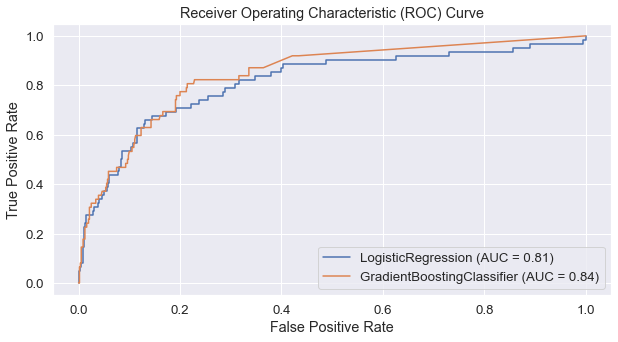

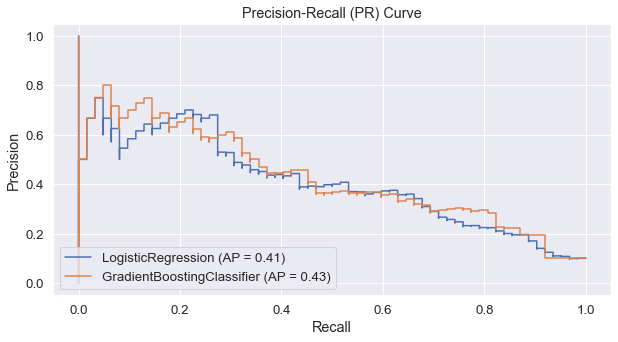

In [316]:
# STARR PLOTS
# ROC Curve and AUC
fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
roc_disp = metrics.plot_roc_curve(lr_best_model, X_test, y_test, ax=ax_roc)
metrics.plot_roc_curve(gb_best_model, X_test, y_test, ax=ax_roc)
ax_roc.set_xlabel("False Positive Rate")
ax_roc.set_ylabel("True Positive Rate")
ax_roc.set_title("Receiver Operating Characteristic (ROC) Curve")
title = 'starr_roc.svg'
fig_roc.savefig(title, format='svg', dpi=1200)
    
    
# PR Curve and AP (average precision)
fig, ax_pr = plt.subplots(1,1,figsize=fig_size)
pr_disp = metrics.plot_precision_recall_curve(lr_best_model, X_test, y_test, ax=ax_pr)
metrics.plot_precision_recall_curve(gb_best_model, X_test, y_test, ax=ax_pr)
ax_pr.set_xlabel("Recall")
ax_pr.set_ylabel("Precision")
ax_pr.set_title("Precision-Recall (PR) Curve")
title = 'starr_pr.svg'
fig.savefig(title, format='svg', dpi=1200)

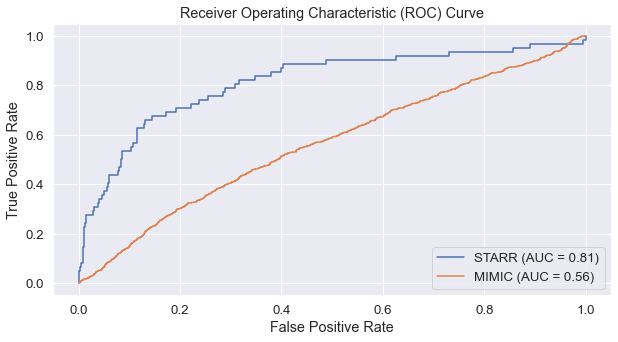

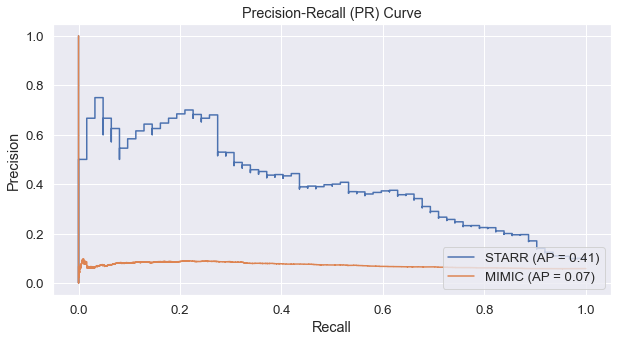

In [609]:
# LRM
# ROC Curve and AUC

starr_lr_auc = metrics.roc_auc_score(y_test, lr_best_model.predict(X_test))
mimic_lr_auc = metrics.roc_auc_score(y_mimic, lr_best_model.predict(X_mimic))

fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
roc_disp = metrics.plot_roc_curve(lr_best_model, X_test, y_test, ax=ax_roc)
metrics.plot_roc_curve(lr_best_model, X_mimic, y_mimic, ax=ax_roc)
#metrics.plot_roc_curve(gb_best_model, X_mimic, y_mimic, ax=ax_roc)
ax_roc.set_xlabel("False Positive Rate")
ax_roc.set_ylabel("True Positive Rate")
ax_roc.set_title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(['STARR (AUC = %.2f)' % (0.81), 'MIMIC (AUC = %.2f)' % (0.56)], loc = 'lower right')
title = 'lr_roc.svg'
fig_roc.savefig(title, format='svg', dpi=1200)
    
    
# PR Curve and AP (average precision)

starr_lr_ap = average_precision_score(y_test, lr_best_model.predict(X_test))
mimic_lr_ap = average_precision_score(y_mimic, lr_best_model.predict(X_mimic))

fig, ax_pr = plt.subplots(1,1,figsize=fig_size)
pr_disp = metrics.plot_precision_recall_curve(lr_best_model, X_test, y_test, ax=ax_pr)
metrics.plot_precision_recall_curve(lr_best_model, X_mimic, y_mimic, ax=ax_pr)
#metrics.plot_precision_recall_curve(gb_best_model, X_mimic, y_mimic, ax=ax_pr)
ax_pr.set_xlabel("Recall")
ax_pr.set_ylabel("Precision")
ax_pr.set_title("Precision-Recall (PR) Curve")
plt.legend(['STARR (AP = %.2f)' % (0.41), 'MIMIC (AP = %.2f)' % (0.07)], loc = 'lower right')
title = 'lr_pr.svg'
fig.savefig(title, format='svg', dpi=1200)

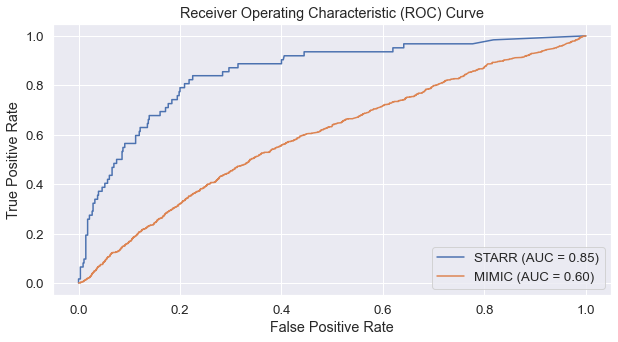

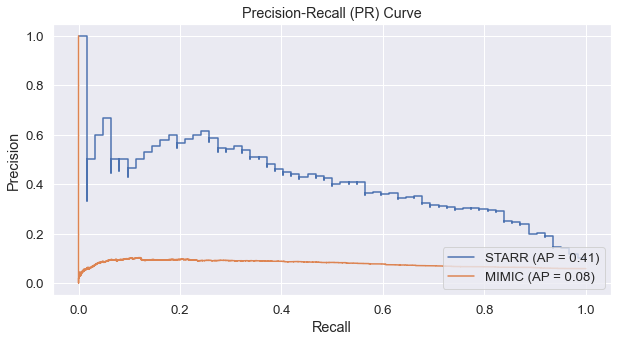

In [611]:
# GBM
# ROC Curve and AUC

starr_gb_auc = metrics.roc_auc_score(y_test, gb_best_model.predict(X_test))
mimic_gb_auc = metrics.roc_auc_score(y_mimic, gb_best_model.predict(X_mimic))

fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
roc_disp = metrics.plot_roc_curve(gb_best_model, X_test, y_test, ax=ax_roc)
metrics.plot_roc_curve(gb_best_model, X_mimic, y_mimic, ax=ax_roc)
#metrics.plot_roc_curve(gb_best_model, X_mimic, y_mimic, ax=ax_roc)
ax_roc.set_xlabel("False Positive Rate")
ax_roc.set_ylabel("True Positive Rate")
ax_roc.set_title("Receiver Operating Characteristic (ROC) Curve")
plt.legend(['STARR (AUC = %.2f)' % (0.85), 'MIMIC (AUC = %.2f)' % (0.60)], loc = 'lower right')
title = 'gb_roc.svg'
fig_roc.savefig(title, format='svg', dpi=1200)
    
    
# PR Curve and AP (average precision)

starr_gb_ap = average_precision_score(y_test, gb_best_model.predict(X_test))
mimic_gb_ap = average_precision_score(y_mimic, gb_best_model.predict(X_mimic))

fig, ax_pr = plt.subplots(1,1,figsize=fig_size)
pr_disp = metrics.plot_precision_recall_curve(gb_best_model, X_test, y_test, ax=ax_pr)
metrics.plot_precision_recall_curve(gb_best_model, X_mimic, y_mimic, ax=ax_pr)

#metrics.plot_precision_recall_curve(gb_best_model, X_mimic, y_mimic, ax=ax_pr)
ax_pr.set_xlabel("Recall")
ax_pr.set_ylabel("Precision")
ax_pr.set_title("Precision-Recall (PR) Curve")
plt.legend(['STARR (AP = %.2f)' % (0.41), 'MIMIC (AP = %.2f)' % (0.08)], loc = 'lower right')
title = 'gb_pr.svg'
fig.savefig(title, format='svg', dpi=1200)

In [325]:
### ORIGINAL CODE, TEST
def test_model(clf, X_test, y_test, fig_size=(10,8)):
    # clf: trained classifier (i.e. after using fit function)
    y_pred = clf.predict(X_test)
    y_score = clf.decision_function(X_test)

    # print out stats
    accuracy = metrics.accuracy_score(y_test, y_pred)
    print("Model accuracy: %.3f\n" % accuracy)

    # precision, recall, and f1-score is usually reported for class 1 (in binary case)
    # recall of positive class (1) = sensitivity
    # recall of negative class (0) = specificity
    # preicion of positive class (1) = PPV
    # precision of negative class (0) = NPV
    print(metrics.classification_report(y_test,y_pred))

    # confusion matrix
    cm_disp = metrics.plot_confusion_matrix(clf, X_test, y_test)  

    # ROC Curve and AUC
    auroc = metrics.roc_auc_score(y_test, y_score)
    fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
    roc_disp = metrics.plot_roc_curve(clf, X_test, y_test, ax=ax_roc)
    ax_roc.set_xlabel("False Positive Rate")
    ax_roc.set_ylabel("True Positive Rate")
    ax_roc.set_title("Receiver Operating Characteristic (ROC) Curve")

    # PR Curve and AP (average precision)
    fig, ax_pr = plt.subplots(1,1,figsize=fig_size)
    pr_disp = metrics.plot_precision_recall_curve(clf, X_test, y_test, ax=ax_pr)
    ax_pr.set_xlabel("Recall")
    ax_pr.set_ylabel("Precision")
    ax_pr.set_title("Precision-Recall (PR) Curve")

    """
    # alternatively we can report the auc of the pr curve
    precision, recall, _ = metrics.precision_recall_curve(y_test, y_score)
    pr_auc = metrics.auc(precision, recall)
    pr_disp = metrics.plot_precision_recall_curve(clf, X_test, y_test, name="Precision-Recall Curve: AP=%.3f" % ap)
    """

    plt.show()

Model accuracy: 0.913

              precision    recall  f1-score   support

           0       0.92      0.99      0.95       560
           1       0.67      0.26      0.37        62

    accuracy                           0.91       622
   macro avg       0.79      0.62      0.66       622
weighted avg       0.90      0.91      0.90       622

Best G-Mean Threshold=-2.027536, G-Mean=0.761, Sensitivity=0.677, Specificity=0.855
Best Youdens J statistic Threshold=-2.027536, Sensitivity=0.677, Specificity=0.855
Readmission prevalence=0.100
PPV=0.341, NPV=0.960
F1-score=0.454


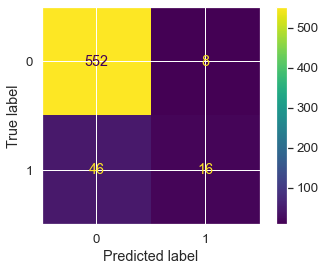

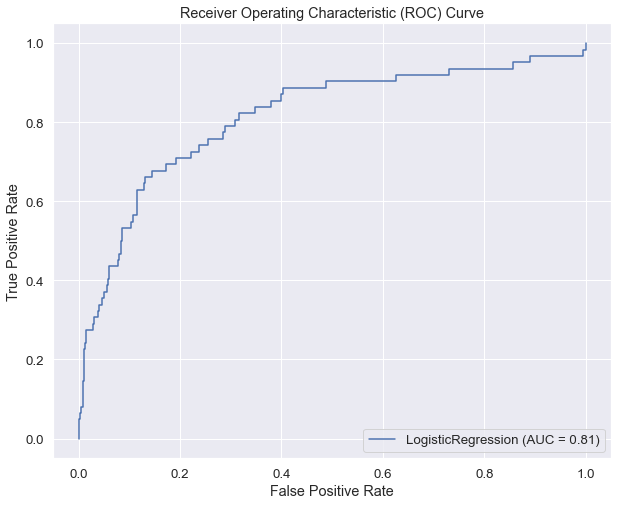

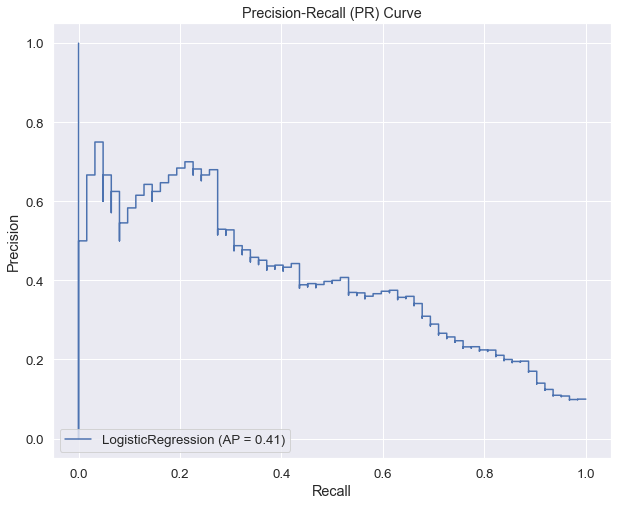

In [589]:
test_model(lr_best_model, X_test, y_test, 'starr', 'lr')
#test_model(lr_best_model, X_test, y_test)

In [454]:
param_test = {#'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1, 0.15, .25, .5, .75, 1], 
              #'n_estimators': [100, 250, 500, 750, 1000, 1250, 1500, 1750],
            'learning_rate': [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008],
            'n_estimators': [450, 455, 460, 465, 470, 475, 480, 485, 490],
             'max_depth': [2, 3, 4, 5], 
             'max_features': [50, 55, 60, 65, 70]}

In [455]:
# GBM with param_test
tuning = model_selection.GridSearchCV(estimator = GradientBoostingClassifier(subsample = 1, 
                                                             min_samples_split = 2, min_samples_leaf = 1,
                                                             random_state = seed), 
                     param_grid = param_test, scoring = 'roc_auc', n_jobs = 20, cv = 5)
tuning.fit(X_train, y_train)
tuning.cv_results_, tuning.best_params_, tuning.best_score_

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
/usr/local/Cellar/jupyterlab/3.1.6/libexec/lib/python3.9/site-packages/sklearn/utils/validation.py:63: DataConversionWarning: A column-vect

({'mean_fit_time': array([ 4.97935076,  5.11662488,  5.25084515, ..., 17.48091378,
         16.15933332, 14.22066078]),
  'std_fit_time': array([0.04866493, 0.04319848, 0.06836214, ..., 0.0935171 , 0.08098131,
         0.57786284]),
  'mean_score_time': array([0.03851647, 0.03806643, 0.03305688, ..., 0.03121538, 0.02227335,
         0.01279469]),
  'std_score_time': array([0.02600655, 0.02545079, 0.01520695, ..., 0.00342228, 0.00132625,
         0.00378437]),
  'param_learning_rate': masked_array(data=[0.001, 0.001, 0.001, ..., 0.008, 0.008, 0.008],
               mask=[False, False, False, ..., False, False, False],
         fill_value='?',
              dtype=object),
  'param_max_depth': masked_array(data=[2, 2, 2, ..., 5, 5, 5],
               mask=[False, False, False, ..., False, False, False],
         fill_value='?',
              dtype=object),
  'param_max_features': masked_array(data=[50, 50, 50, ..., 70, 70, 70],
               mask=[False, False, False, ..., False, False, 

In [602]:
gb_model_param_test = GradientBoostingClassifier(learning_rate = 0.004, max_depth = 3, max_features = 60,
                                             n_estimators = 470, random_state = seed)
gb_model_param_test.fit(X_train, y_train)
predictions = gb_model_param_test.predict(X_val)
print(metrics.classification_report(y_val, predictions))

              precision    recall  f1-score   support

           0       0.92      1.00      0.96       570
           1       0.33      0.02      0.04        52

    accuracy                           0.91       622
   macro avg       0.63      0.51      0.50       622
weighted avg       0.87      0.91      0.88       622



In [603]:
gb_best_model = gb_model_param_test
ensemble_models["GB best model"] = gb_best_model

Model accuracy: 0.899

              precision    recall  f1-score   support

           0       0.90      1.00      0.95       560
           1       0.33      0.02      0.03        62

    accuracy                           0.90       622
   macro avg       0.62      0.51      0.49       622
weighted avg       0.84      0.90      0.86       622

Best G-Mean Threshold=-2.118813, G-Mean=0.806, Sensitivity=0.839, Specificity=0.775
Best Youdens J statistic Threshold=-2.118813, Sensitivity=0.839, Specificity=0.775
Readmission prevalence=0.100
PPV=0.292, NPV=0.977
F1-score=0.433


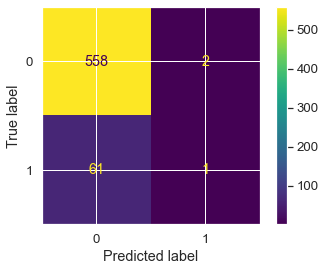

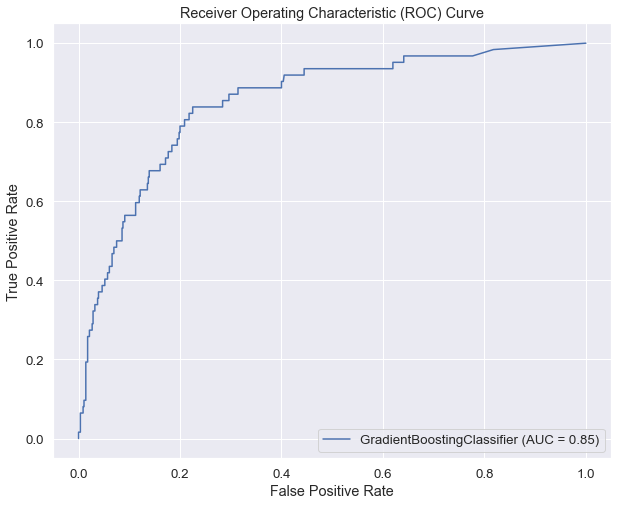

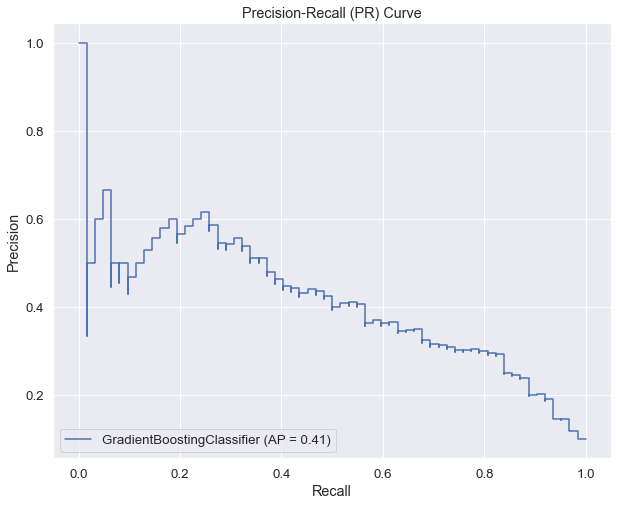

In [604]:
test_model(gb_best_model, X_test, y_test, 'starr', 'gbm')
#test_model(gb_best_model, X_test, y_test)

Model accuracy: 0.929

              precision    recall  f1-score   support

         0.0       0.94      0.99      0.96     13039
         1.0       0.06      0.01      0.02       802

    accuracy                           0.93     13841
   macro avg       0.50      0.50      0.49     13841
weighted avg       0.89      0.93      0.91     13841

Best G-Mean Threshold=-1.901784, G-Mean=0.580, Sensitivity=0.526, Specificity=0.639
Best Youdens J statistic Threshold=-1.901784, Sensitivity=0.526, Specificity=0.639
Readmission prevalence=0.058
PPV=0.082, NPV=0.956
F1-score=0.142


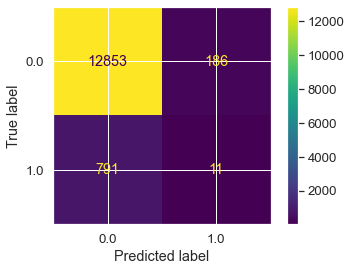

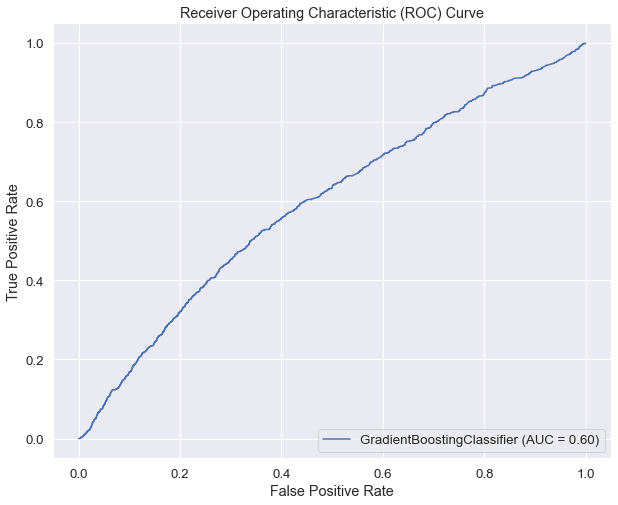

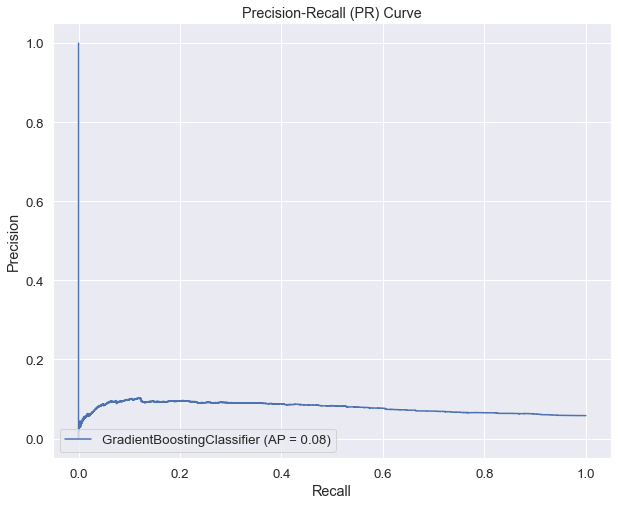

In [605]:
test_model(gb_best_model, X_mimic, y_mimic, 'mimic', 'gbm')
#test_model(gb_best_model, X_mimic, y_mimic)

### External validation: MIMIC

In [139]:
X_mimic.head()

,age,hospital_los,icu_los,admit_ed,gender,ecg,xray,cxr,mri,ct,diuretics,antihypertensives,inotrope_pressor,sedatives,intub_days,extub_hrs,hgb_low,wbc_low,wbc_high,plt_low,glu_high,bun_high,hco3_low,hco3_high,k_low,k_high,na_low,na_high,lac_high,bnp_high,trop_high,map_low,map_high,hr_low,hr_high,temp_low,temp_high,inflamm_marker,hgb_last,wbc_last,plt_last,inr_last,ck_last,alt_last,ast_last,dbili_last,tbili_last,lipase_last,bun_last,na_last,k_last,hco3_last,ph_last,cr_last,lac_last,bnp_last,trop_last,fio2_last,pao2_last,paco2_last,pafio2_last,crp_last,esr_last,temp_last,hr_last,map_last,gcs_last,rass_last,sao2_last,spo2_last,hgb_min,wbc_max,wbc_min,plt_min,inr_max,inr_min,cortisol_max,cortisol_min,ck_max,alt_max,ast_max,dbili_max,tbili_max,lipase_max,ph_max,ph_min,na_max,na_min,k_max,k_min,hco3_max,hco3_min,bun_max,cr_max,lac_max,bnp_max,trop_max,paco2_max,paco2_min,pao2_max,pao2_min,sao2_max,sao2_min,esr_max,crp_max,temp_max,temp_min,hr_max,hr_min,spo2_max,spo2_min,map_max,map_min,gcs_max,gcs_min,rass_max,rass_min,ethnicity,age_imputed,hospital_los_imputed,icu_los_imputed,admit_ed_imputed,gender_imputed,ecg_imputed,xray_imputed,cxr_imputed,mri_imputed,ct_imputed,diuretics_imputed,antihypertensives_imputed,inotrope_pressor_imputed,sedatives_imputed,intub_days_imputed,extub_hrs_imputed,hgb_low_imputed,wbc_low_imputed,wbc_high_imputed,plt_low_imputed,glu_high_imputed,bun_high_imputed,hco3_low_imputed,hco3_high_imputed,k_low_imputed,k_high_imputed,na_low_imputed,na_high_imputed,lac_high_imputed,bnp_high_imputed,trop_high_imputed,map_low_imputed,map_high_imputed,hr_low_imputed,hr_high_imputed,temp_low_imputed,temp_high_imputed,inflamm_marker_imputed,hgb_last_imputed,wbc_last_imputed,plt_last_imputed,inr_last_imputed,ck_last_imputed,alt_last_imputed,ast_last_imputed,dbili_last_imputed,tbili_last_imputed,lipase_last_imputed,bun_last_imputed,na_last_imputed,k_last_imputed,hco3_last_imputed,ph_last_imputed,cr_last_imputed,lac_last_imputed,bnp_last_imputed,trop_last_imputed,fio2_last_imputed,pao2_last_imputed,paco2_last_imputed,pafio2_last_imputed,crp_last_imputed,esr_last_imputed,temp_last_imputed,hr_last_imputed,map_last_imputed,gcs_last_imputed,rass_last_imputed,sao2_last_imputed,spo2_last_imputed,hgb_min_imputed,wbc_max_imputed,wbc_min_imputed,plt_min_imputed,inr_max_imputed,inr_min_imputed,cortisol_max_imputed,cortisol_min_imputed,ck_max_imputed,alt_max_imputed,ast_max_imputed,dbili_max_imputed,tbili_max_imputed,lipase_max_imputed,ph_max_imputed,ph_min_imputed,na_max_imputed,na_min_imputed,k_max_imputed,k_min_imputed,hco3_max_imputed,hco3_min_imputed,bun_max_imputed,cr_max_imputed,lac_max_imputed,bnp_max_imputed,trop_max_imputed,paco2_max_imputed,paco2_min_imputed,pao2_max_imputed,pao2_min_imputed,sao2_max_imputed,sao2_min_imputed,esr_max_imputed,crp_max_imputed,temp_max_imputed,temp_min_imputed,hr_max_imputed,hr_min_imputed,spo2_max_imputed,spo2_min_imputed,map_max_imputed,map_min_imputed,gcs_max_imputed,gcs_min_imputed,rass_max_imputed,rass_min_imputed,ethnicity_imputed
0,65.0,15.082454,15.076204,1.0,1.0,4.0,8.0,8.0,0.0,2.0,8.0,1.0,2.0,17.0,10.0,127.0,12.000000,0.000000,14.0,0.000000,1.0,2.0,0.0000,13.0,0.000000,0.0,0.000000,10.0,4.0,0.0,0.0,0.000000,0.0,0.000000,48.0,6.000000,3.0,5.0,7.2,10.2,669.0,1.100000,21.000000,23.000000,22.000000,3.571843,0.400000,104.175814,27.0,148.0,3.6,31.0,7.440000,0.7,0.900000,7354.401899,0.010000,0.400000,80.057191,52.000000,174.662497,51.100000,52.329114,97.0,73.000000,81.546816,15.0,-0.286988,98.000000,97.0,7.0,24.8,9.9,353.0,20.200000,1.00000,30.662053,25.164558,604.000000,29.000000,30.000000,3.972782,0.400000,166.178938,7.510000,7.260000,148.0,135.0,4.8,2.6,36.0,28.0,27.0,0.8,3.000000,7577.321203,0.040000,66.000000,35.000000,206.00000,50.000000,98.000000,98.000000,52.911392,137.700000,101.8,96.4,184.0,53.0,100.0,89.0,105.438202,63.044944,15.0,6.0,0.716509,-2.456016,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [338]:
X_mimic = mimic_imputed.drop(columns=["readmit"]).astype("float")
X_mimic = X_mimic[feature_order]
y_mimic = mimic_imputed[["readmit"]]

In [339]:
X_mimic.describe()
X_mimic.shape
y_mimic.shape

(13841, 1)

Model accuracy: 0.630

              precision    recall  f1-score   support

         0.0       0.95      0.64      0.77     13039
         1.0       0.07      0.47      0.13       802

    accuracy                           0.63     13841
   macro avg       0.51      0.55      0.45     13841
weighted avg       0.90      0.63      0.73     13841

Best G-Mean Threshold=-0.108110, G-Mean=0.556, Sensitivity=0.521, Specificity=0.593
Best Youdens J statistic Threshold=0.040380, Sensitivity=0.459, Specificity=0.657
Readmission prevalence=0.058
PPV=0.076, NPV=0.952
F1-score=0.130


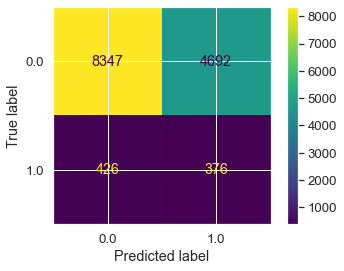

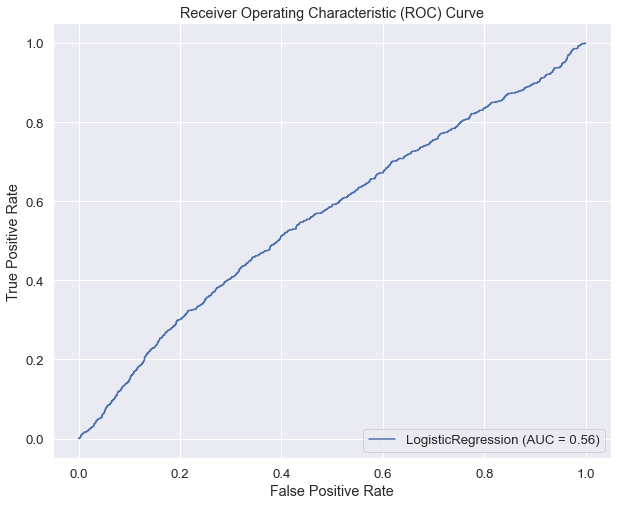

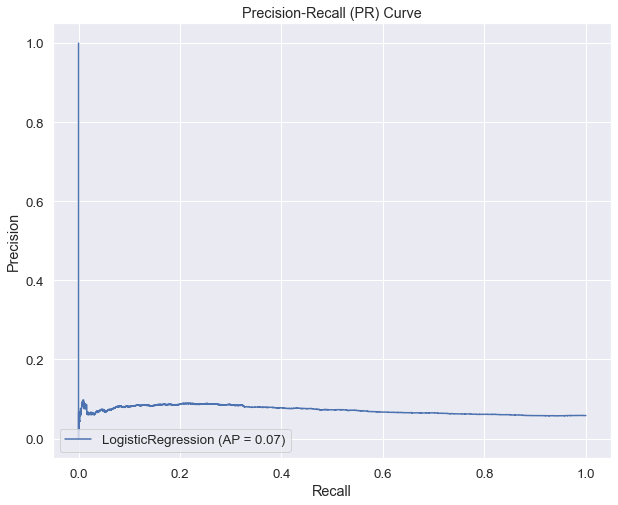

In [606]:
test_model(lr_best_model, X_mimic, y_mimic, 'mimic', 'lr')
#test_model(lr_best_model, X_mimic, y_mimic)

### SWIFT metrics.

In [65]:
X_test = X_test.reset_index()
del X_test['index']
y_test = y_test.reset_index()
del y_test['index']

X_mimic = X_mimic.reset_index()
del X_mimic['index']
y_mimic = y_mimic.reset_index()
del y_mimic['index']


In [66]:
starr_swift = []
for i in range(X_test.shape[0]):
  score = 0
  if X_test['admit_ed'][i] == 0:
    score += 8
  else:
    score += 0
  if X_test['icu_los'][i] > 10: 
    score += 14
  elif X_test['icu_los'][i] >= 2 and X_test['icu_los'][i] <= 10:
    score += 1
  else: 
    score += 0
  if X_test['pafio2_last'][i] < 100:
    score += 13
  elif X_test['pafio2_last'][i] < 150:
    score += 10
  elif X_test['pafio2_last'][i] < 400: 
    score += 5
  else:
    score += 0
  if X_test['gcs_last'][i] < 8:
    score += 24
  elif X_test['gcs_last'][i] < 11:
    score += 14
  elif X_test['gcs_last'][i] < 14:
    score += 6
  else: 
    score += 0 
  if X_test['paco2_last'][i] > 45:
    score += 5
  else: 
    score += 0
  starr_swift.append(score)

mimic_swift = []
for i in range(X_mimic.shape[0]):
  score = 0
  if X_mimic['admit_ed'][i] == 0:
    score += 8
  else:
    score += 0
  if X_mimic['icu_los'][i] > 10: 
    score += 14
  elif X_mimic['icu_los'][i] >= 2 and X_mimic['icu_los'][i] <= 10:
    score += 1
  else: 
    score += 0
  if X_mimic['pafio2_last'][i] < 100:
    score += 13
  elif X_mimic['pafio2_last'][i] < 150:
    score += 10
  elif X_mimic['pafio2_last'][i] < 400: 
    score += 5
  else:
    score += 0
  if X_mimic['gcs_last'][i] < 8:
    score += 24
  elif X_mimic['gcs_last'][i] < 11:
    score += 14
  elif X_mimic['gcs_last'][i] < 14:
    score += 6
  else: 
    score += 0
  if X_mimic['paco2_last'][i] > 45:
    score += 5
  else: 
    score += 0
  mimic_swift.append(score)

starr_swift = pd.DataFrame(starr_swift)
mimic_swift = pd.DataFrame(mimic_swift)


In [67]:
starr_swift.columns = ['score']
mimic_swift.columns = ['score']

In [68]:
starr_swift['outcome'] = [1 if x >= 15 else 0 for x in starr_swift['score']]
mimic_swift['outcome'] = [1 if x >= 15 else 0 for x in mimic_swift['score']]

#data[col_name] = [1 if x >= 0 else 0 for x in data[col]]

In [69]:
def swift_metrics(y_pred, y_test, fig_size=(10,8)):
# precision, recall, and f1-score is usually reported for class 1 (in binary case)
    # recall of positive class (1) = sensitivity
    # recall of negative class (0) = specificity
    # preicion of positive class (1) = PPV
    # precision of negative class (0) = NPV
    print(metrics.classification_report(y_test,y_pred))

    # confusion matrix
    #cm_disp = metrics.plot_confusion_matrix(y_test, y_pred)  

    # ROC Curve and AUC
    #auroc = metrics.roc_auc_score(y_test, y_pred)
    #fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
    #roc_disp = metrics.plot_roc_curve(y_test, y_pred, ax=ax_roc)
    #ax_roc.set_xlabel("False Positive Rate")
    #ax_roc.set_ylabel("True Positive Rate")
    #ax_roc.set_title("Receiver Operating Characteristic (ROC) Curve")

    # PR Curve and AP (average precision)
    #fig, ax_pr = plt.subplots(1,1,figsize=fig_size)
    #pr_disp = metrics.plot_precision_recall_curve(y_test, y_pred, ax=ax_pr)
    #ax_pr.set_xlabel("Recall")
    #ax_pr.set_ylabel("Precision")
    #ax_pr.set_title("Precision-Recall (PR) Curve")

    """
    # alternatively we can report the auc of the pr curve
    precision, recall, _ = metrics.precision_recall_curve(y_test, y_score)
    pr_auc = metrics.auc(precision, recall)
    pr_disp = metrics.plot_precision_recall_curve(clf, X_test, y_test, name="Precision-Recall Curve: AP=%.3f" % ap)
    """

    #plt.show()

In [70]:
swift_metrics(starr_swift['outcome'], y_test)

              precision    recall  f1-score   support

           0       0.94      0.81      0.87       560
           1       0.23      0.53      0.33        62

    accuracy                           0.78       622
   macro avg       0.59      0.67      0.60       622
weighted avg       0.87      0.78      0.81       622



In [71]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_fscore_support
print('roc_auc_score for STARR SWIFT: ', roc_auc_score(y_test, starr_swift['outcome']))
print('precision_recall_score for STARR SWIFT: ', precision_recall_fscore_support(y_test, starr_swift['outcome'], average = 'micro'))
FPR_starr, TPR_starr, threshold_starr = roc_curve(y_test, starr_swift['outcome'])

roc_auc_score for STARR SWIFT:  0.6697004608294931
precision_recall_score for STARR SWIFT:  (0.7797427652733119, 0.7797427652733119, 0.7797427652733119, None)


In [72]:
from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_test, starr_swift['outcome'])

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))

Average precision-recall score: 0.17


In [616]:
y = y_test
y_score = starr_swift['outcome']

# Find optimal AUROC threshold by g-means.
fpr, tpr, thresholds = metrics.roc_curve(y, y_score)
   
gmeans = np.sqrt(tpr * (1-fpr)) # calculate g-mean for each threshold
ix = np.argmax(gmeans) # locate the index of the largest g-mean
print('Best G-Mean Threshold=%f, G-Mean=%.3f, Sensitivity=%.3f, Specificity=%.3f' % (thresholds[ix], gmeans[ix], tpr[ix], 1-fpr[ix]))
    
# Find optimal AUROC threshold by Youden's J statistic
J = tpr - fpr
ix = np.argmax(J)
best_thresh = thresholds[ix]
print('Best Youdens J statistic Threshold=%f, Sensitivity=%.3f, Specificity=%.3f' % (best_thresh, tpr[ix], 1-fpr[ix]))

# Prevalence
pos = y.sum()
prev = pos/y.shape[0]
print('Readmission prevalence=%.3f' % (prev))
    
# Sensitivity, specificity
sens = tpr[ix]
spec = 1-fpr[ix]
    
# PPV, NPV
ppv = (sens * prev)/((sens*prev) + (1-spec)*(1-prev))
npv = (spec * (1-prev))/((spec*(1-prev)) + (prev*(1-sens)))
print('PPV=%.3f, NPV=%.3f' % (ppv, npv))

# F1-score
f1 = 2*((ppv*sens)/(ppv + sens))
print('F1-score=%.3f' % (f1))

Best G-Mean Threshold=1.000000, G-Mean=0.655, Sensitivity=0.532, Specificity=0.807
Best Youdens J statistic Threshold=1.000000, Sensitivity=0.532, Specificity=0.807
Readmission prevalence=0.100
PPV=0.234, NPV=0.940
F1-score=0.325


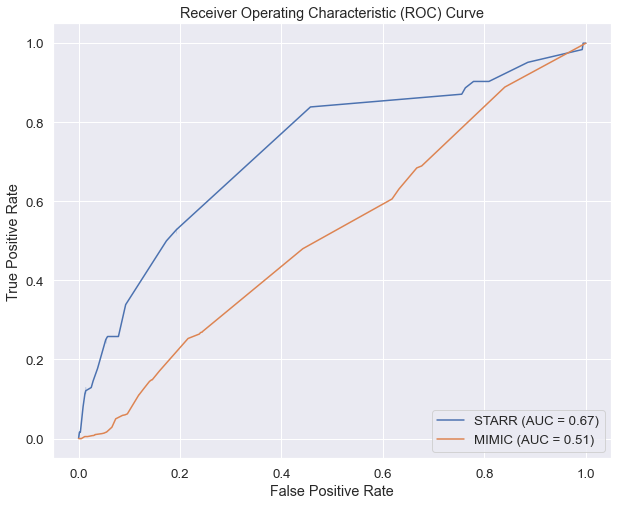

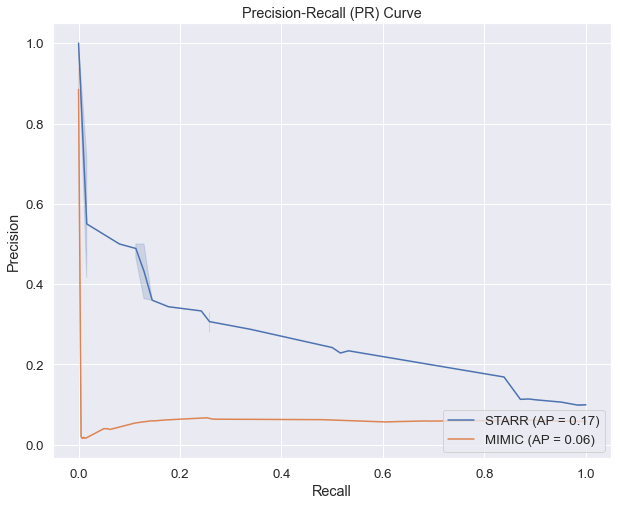

In [615]:
# SWIFT PLOTS.

from sklearn.metrics import average_precision_score

FPR_starr = []
TPR_starr = []
FPR_mimic = []
TPR_mimic = []

precision_starr = []
recall_starr = []
precision_mimic = []
recall_mimic = []

#auc_starr = []
#auc_mimic = []

#ap_starr = []
#ap_mimic = []

for i in range(100):
    mimic_score = [1 if x >= i+1 else 0 for x in mimic_swift['score']]
    starr_score = [1 if x >= i+1 else 0 for x in starr_swift['score']]
    
    fpr_temp, tpr_temp, threshold = roc_curve(y_test, starr_score)
    FPR_starr.append(fpr_temp)
    TPR_starr.append(tpr_temp)
    #auc_starr = metrics.auc(fpr_temp, tpr_temp)
    
    fpr_temp, tpr_temp, threshold = roc_curve(y_mimic, mimic_score)
    FPR_mimic.append(fpr_temp)
    TPR_mimic.append(tpr_temp)
    #auc_mimic = metrics.auc(fpr_temp, tpr_temp)
    
    precision_temp, recall_temp, threshold = metrics.precision_recall_curve(y_test, starr_score)
    precision_starr.append(precision_temp)
    recall_starr.append(recall_temp)
    
    precision_temp, recall_temp, threshold = metrics.precision_recall_curve(y_mimic, mimic_score)
    precision_mimic.append(precision_temp)
    recall_mimic.append(recall_temp)

    #ap_starr.append(average_precision_score(y_test, starr_score))
    #ap_mimic.append(average_precision_score(y_mimic, mimic_score))
    
    
    
TPR_starr = np.concatenate(TPR_starr).ravel()
FPR_starr = np.concatenate(FPR_starr).ravel()
TPR_mimic = np.concatenate(TPR_mimic).ravel()
FPR_mimic = np.concatenate(FPR_mimic).ravel()

precision_starr = np.concatenate(precision_starr).ravel()
recall_starr = np.concatenate(recall_starr).ravel()
precision_mimic = np.concatenate(precision_mimic).ravel()
recall_mimic = np.concatenate(recall_mimic).ravel()

    
# ROC
#FPR_starr, TPR_starr, threshold_starr = roc_curve(y_test, starr_swift['outcome'])
#FPR_mimic, TPR_mimic, threshold_mimic = roc_curve(y_mimic, mimic_swift['outcome'])

auc_starr = roc_auc_score(y_test, starr_swift['outcome'])
auc_mimic = roc_auc_score(y_mimic, mimic_swift['outcome'])


fig, ax = plt.subplots(1,1,figsize=(10,8))
#plt.subplots(1, figsize=(10,10))
ax.set_title('Receiver Operating Characteristic (ROC) Curve')
disp = sns.lineplot(FPR_starr, TPR_starr, label = 'STARR (AUC = %.2f)' % (auc_starr))
sns.lineplot(FPR_mimic, TPR_mimic, label = 'MIMIC (AUC = %.2f)' % (auc_mimic))
#plt.plot([0, 1], ls="--")
#plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
ax.set_ylabel('True Positive Rate')
ax.set_xlabel('False Positive Rate')
plt.legend(loc='lower right')
           #ncol=2, mode="expand", borderaxespad=0.)

title = 'swift_roc.svg'
fig.savefig(title, format='svg', dpi=1200)

# PR
#precision_starr, recall_starr, thresholds = metrics.precision_recall_curve(y_test, starr_swift['outcome'])
#precision_mimic, recall_mimic, thresholds = metrics.precision_recall_curve(y_mimic, mimic_swift['outcome'])


ap_starr = average_precision_score(y_test, starr_swift['outcome'])
ap_mimic = average_precision_score(y_mimic, mimic_swift['outcome'])

fig_pr, ax_pr = plt.subplots(1,1,figsize=(10,8))
ax_pr.set_title('Precision-Recall (PR) Curve')
disp = sns.lineplot(recall_starr, precision_starr, label = 'STARR (AP = %.2f)' % (ap_starr))
sns.lineplot(recall_mimic, precision_mimic, label = 'MIMIC (AP = %.2f)' % (ap_mimic))
ax_pr.set_ylabel('Precision')
ax_pr.set_xlabel('Recall')
plt.legend(loc='lower right')

title = 'swift_pr.svg'
fig_pr.savefig(title, format='svg', dpi=1200)

plt.show()

In [75]:
swift_metrics(mimic_swift['outcome'], y_mimic)

              precision    recall  f1-score   support

         0.0       0.94      0.76      0.84     13039
         1.0       0.06      0.27      0.10       802

    accuracy                           0.73     13841
   macro avg       0.50      0.51      0.47     13841
weighted avg       0.89      0.73      0.80     13841



In [76]:
print('roc_auc_score for MIMIC SWIFT: ', roc_auc_score(y_mimic, mimic_swift['outcome']))
print('precision_recall_score for MIMIC SWIFT: ', precision_recall_fscore_support(y_mimic, mimic_swift['outcome'], average = 'micro'))

FPR_mimic, TPR_mimic, threshold_mimic = roc_curve(y_mimic, mimic_swift['outcome'])
print(FPR_mimic)

roc_auc_score for MIMIC SWIFT:  0.5131531838400012
precision_recall_score for MIMIC SWIFT:  (0.7276208366447511, 0.7276208366447511, 0.7276208366447511, None)
[0.        0.2442672 1.       ]


In [77]:
from sklearn.metrics import average_precision_score
average_precision = average_precision_score(y_mimic, mimic_swift['outcome'])

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision))

Average precision-recall score: 0.06


In [78]:
y = y_mimic
y_score = mimic_swift['outcome']

# Find optimal AUROC threshold by g-means.
fpr, tpr, thresholds = metrics.roc_curve(y, y_score)
   
gmeans = np.sqrt(tpr * (1-fpr)) # calculate g-mean for each threshold
ix = np.argmax(gmeans) # locate the index of the largest g-mean
print('Best G-Mean Threshold=%f, G-Mean=%.3f, Sensitivity=%.3f, Specificity=%.3f' % (thresholds[ix], gmeans[ix], tpr[ix], 1-fpr[ix]))
    
# Find optimal AUROC threshold by Youden's J statistic
J = tpr - fpr
ix = np.argmax(J)
best_thresh = thresholds[ix]
print('Best Youdens J statistic Threshold=%f, Sensitivity=%.3f, Specificity=%.3f' % (best_thresh, tpr[ix], 1-fpr[ix]))

# Prevalence
pos = y.sum()
prev = pos/y.shape[0]
print('Readmission prevalence=%.3f' % (prev))
    
# Sensitivity, specificity
sens = tpr[ix]
spec = 1-fpr[ix]
    
# PPV, NPV
ppv = (sens * prev)/((sens*prev) + (1-spec)*(1-prev))
npv = (spec * (1-prev))/((spec*(1-prev)) + (prev*(1-sens)))
print('PPV=%.3f, NPV=%.3f' % (ppv, npv))

# F1-score
f1 = 2*((ppv*sens)/(ppv + sens))
print('F1-score=%.3f' % (f1))

Best G-Mean Threshold=1.000000, G-Mean=0.452, Sensitivity=0.271, Specificity=0.756
Best Youdens J statistic Threshold=1.000000, Sensitivity=0.271, Specificity=0.756
Readmission prevalence=0.058
PPV=0.064, NPV=0.944
F1-score=0.103


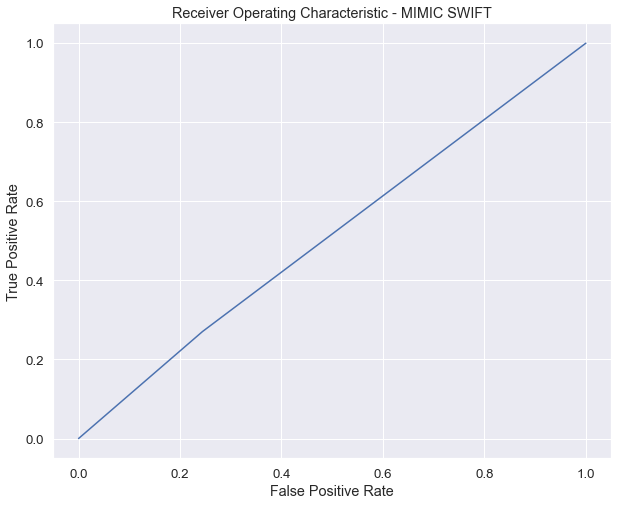

In [79]:
fig, ax = plt.subplots(1,1,figsize=(10,8))
#plt.subplots(1, figsize=(10,10))
ax.set_title('Receiver Operating Characteristic - MIMIC SWIFT')
disp = plt.plot(FPR_mimic, TPR_mimic)
#plt.plot([0, 1], ls="--")
#plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
ax.set_ylabel('True Positive Rate')
ax.set_xlabel('False Positive Rate')

title = 'mimic_swift_roc.svg'
fig.savefig(title, format='svg', dpi=1200)
    
plt.show()

In [522]:
def swift_curves(scores, y_test, data, model, fig_size=(10,8)):
    
    # Get 'outcomes' dataframe of readmit labels for each probability threshold.
    thresh = np.arange(0,101,1)
    #print(thresh)
    outcomes = pd.DataFrame(scores, columns = ['scores'])
    for i in range(len(thresh)):
        name_thresh = str(i) + '_threshold'
        temp_scores = [1 if x >= thresh[i] else 0 for x in scores]
        outcomes[name_thresh] = temp_scores
    
    outcomes = outcomes.drop(['scores'], axis = 1)

    # Get npv, spec dataframe for each threshold.
    metrics = pd.DataFrame(np.zeros(len(thresh)), columns = ['scores'])
    npv = []
    ppv = []
    spec = []
    sens = []
    for j in outcomes:
        TN = 0
        FN = 0
        TP = 0
        FP = 0
        for k in range(outcomes.shape[0]):
            if outcomes[j][k] == 0 and y_test.readmit[k] == 0:
                TN += 1
            elif outcomes[j][k] == 0 and y_test.readmit[k] == 1:
                FN += 1
            elif outcomes[j][k] == 1 and y_test.readmit[k] == 0:
                FP += 1
            elif outcomes[j][k] == 1 and y_test.readmit[k] == 1:
                TP += 1
            else:
                continue
        if TN == 0 and FN == 0:
            npv.append(1)
        else:
            npv.append(TN/(TN+FN))
        if TN == 0 and FP == 0:
            spec.append(1)
        else:
            spec.append(TN/(TN+FP))
        if TP == 0 and FP == 0:
            ppv.append(1)
        else: 
            ppv.append(TP/(TP+FP))
        if TP == 0 and FN == 0:
            sens.append(1)
        else:
            sens.append(TP/(TP+FN))
            
        #TN = [1 if temp_outcome[x] == 0 and y_test[y] == 0 else 0 for x, y in zip(temp_outcome, y_test)]
        #FN = [1 if temp_outcome[x] == 0 and y_test[y] == 1 else 0 for x, y in zip(temp_outcome, y_test)]
        #FP = [1 if temp_outcome[x] == 1 and y_test[y] == 0 else 0 for x in len(y_test)]
        #name_npv = outcomes[j] + '_npv'
        #name_spec = outcomes[j] + '_spec'
        #npv.append(TN.sum()/(TN.sum() + FN.sum()))
        #spec.append(TN.sum()/(TN.sum() + FP.sum()))
    
    metrics['npv'] = npv
    metrics['ppv'] = ppv
    metrics['spec'] = spec
    metrics['sens'] = sens
    metrics['tpr'] = sens
    metrics['fpr'] = np.ones(len(spec))-spec
    metrics = metrics.drop(['scores'], axis = 1)
    
    fig_roc, ax_roc = plt.subplots(1,1,figsize=fig_size)
    disp_roc = sns.lineplot(data=metrics, x='tpr', y='fpr')
    ax_roc.set_ylabel('True Positive Rate')
    ax_roc.set_xlabel('False Positive Rate')
    
    fig_pr, ax_pr = plt.subplots(1,1,figsize=fig_size)
    disp_pr = sns.lineplot(data=metrics, x="sens", y="ppv")
    ax_pr.set_xlabel("Recall")
    ax_pr.set_ylabel("Precision")
    ax_pr.set_title("Precision-Recall (PR) Curve")
    ax_pr.set(ylim=(-0.05, 1.05))
    title = data + '_' + model + '_pr_scratch.svg'
    fig_pr.savefig(title, format='svg', dpi=1200)
    
    
    fig, ax = plt.subplots(1,1,figsize=fig_size)
    disp = sns.lineplot(data=metrics, x="spec", y="npv")
    ax.set_xlabel("Specificity")
    ax.set_ylabel("NPV")
    ax.set_title("NPV vs Specificity")
    ax.set(ylim=(-0.05, 1.05))
    title = data + '_' + model + '_negcurve.svg'
    fig.savefig(title, format='svg', dpi=1200)
    
    plt.show()
    
    #return metrics
    

In [525]:
swift_curves(starr_swift['score'], y_test, 'starr', 'swift')

KeyError: 0

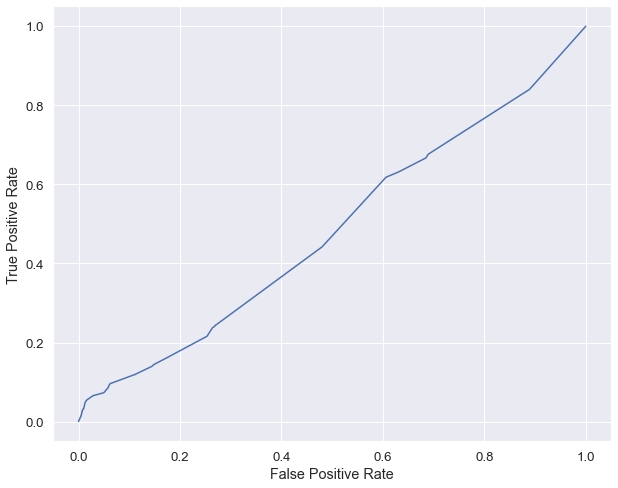

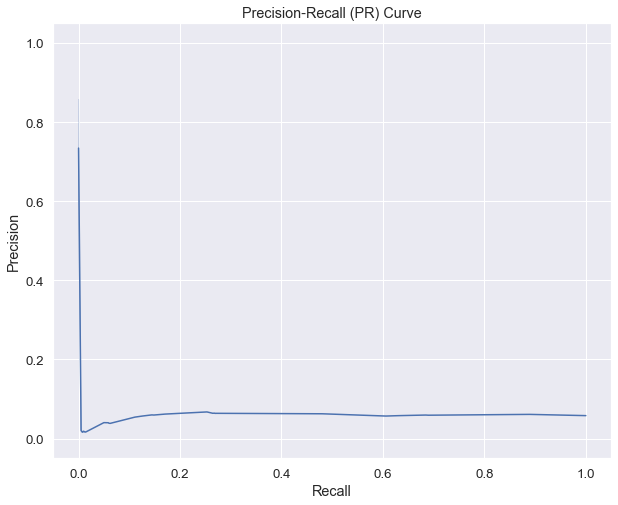

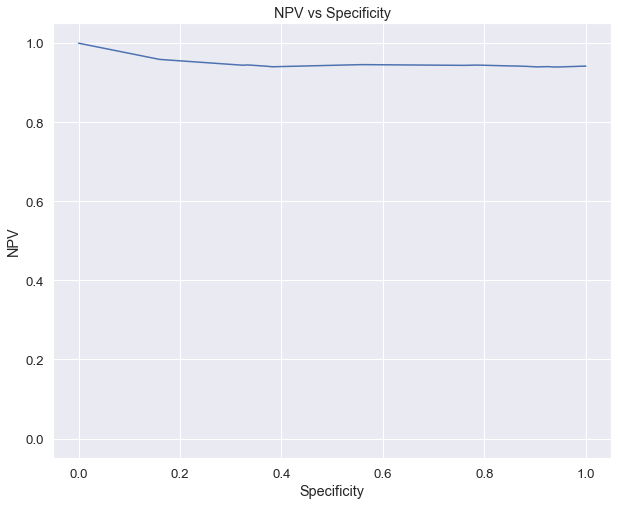

In [524]:
swift_curves(mimic_swift['score'], y_mimic, 'mimic', 'swift')


**Additional graphs**

In [127]:
# Get probabilities. 
starr_lr_probs = lr_best_model.predict_proba(X_test)
starr_gb_probs = gb_best_model.predict_proba(X_test)

mimic_lr_probs = lr_best_model.predict_proba(X_mimic)
mimic_gb_probs = gb_best_model.predict_proba(X_mimic)


In [128]:
def curves(probs, y_test, data, model, fig_size=(10,8)):
    
    # Get 'outcomes' dataframe of readmit labels for each probability threshold.
    thresh = np.arange(0,1.005,0.001)
    #print(thresh)
    outcomes = pd.DataFrame(probs, columns = ['probs'])
    for i in range(len(thresh)):
        name_thresh = str(i) + '_threshold'
        temp_probs = [1 if x >= thresh[i] else 0 for x in probs]
        outcomes[name_thresh] = temp_probs
    
    outcomes = outcomes.drop(['probs'], axis = 1)

    # Get npv, spec dataframe for each threshold.
    metrics = pd.DataFrame(np.zeros(len(thresh)), columns = ['probs'])
    npv = []
    ppv = []
    spec = []
    sens = []
    for j in outcomes:
        TN = 0
        FN = 0
        TP = 0
        FP = 0
        for k in range(outcomes.shape[0]):
            if outcomes[j][k] == 0 and y_test.readmit[k] == 0:
                TN += 1
            elif outcomes[j][k] == 0 and y_test.readmit[k] == 1:
                FN += 1
            elif outcomes[j][k] == 1 and y_test.readmit[k] == 0:
                FP += 1
            elif outcomes[j][k] == 1 and y_test.readmit[k] == 1:
                TP += 1
            else:
                continue
        if TN == 0 and FN == 0:
            npv.append(1)
        else:
            npv.append(TN/(TN+FN))
        if TN == 0 and FP == 0:
            spec.append(1)
        else:
            spec.append(TN/(TN+FP))
        if TP == 0 and FP == 0:
            ppv.append(1)
        else: 
            ppv.append(TP/(TP+FP))
        if TP == 0 and FN == 0:
            sens.append(1)
        else:
            sens.append(TP/(TP+FN))
            
        #TN = [1 if temp_outcome[x] == 0 and y_test[y] == 0 else 0 for x, y in zip(temp_outcome, y_test)]
        #FN = [1 if temp_outcome[x] == 0 and y_test[y] == 1 else 0 for x, y in zip(temp_outcome, y_test)]
        #FP = [1 if temp_outcome[x] == 1 and y_test[y] == 0 else 0 for x in len(y_test)]
        #name_npv = outcomes[j] + '_npv'
        #name_spec = outcomes[j] + '_spec'
        #npv.append(TN.sum()/(TN.sum() + FN.sum()))
        #spec.append(TN.sum()/(TN.sum() + FP.sum()))
    
    metrics['npv'] = npv
    metrics['ppv'] = ppv
    metrics['spec'] = spec
    metrics['sens'] = sens
    metrics = metrics.drop(['probs'], axis = 1)
    
    
    fig_pr, ax_pr = plt.subplots(1,1,figsize=fig_size)
    disp_pr = sns.lineplot(data=metrics, x="sens", y="ppv")
    ax_pr.set_xlabel("Sensitivity")
    ax_pr.set_ylabel("PPV")
    ax_pr.set_title("PPV vs Sensitivity")
    ax_pr.set(ylim=(-0.05, 1.05))
    title = data + '_' + model + '_pr_scratch.svg'
    fig_pr.savefig(title, format='svg', dpi=1200)
    
    
    fig, ax = plt.subplots(1,1,figsize=fig_size)
    disp = sns.lineplot(data=metrics, x="spec", y="npv")
    ax.set_xlabel("Specificity")
    ax.set_ylabel("NPV")
    ax.set_title("NPV vs Specificity")
    ax.set(ylim=(-0.05, 1.05))
    title = data + '_' + model + '_negcurve.svg'
    fig.savefig(title, format='svg', dpi=1200)
    
    plt.show()
    
        
        

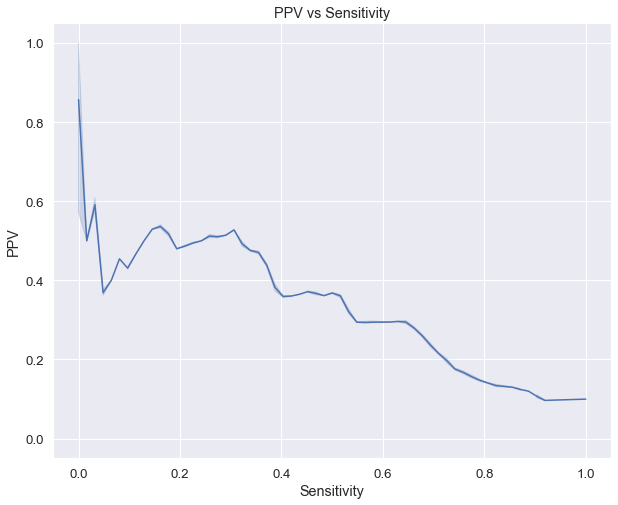

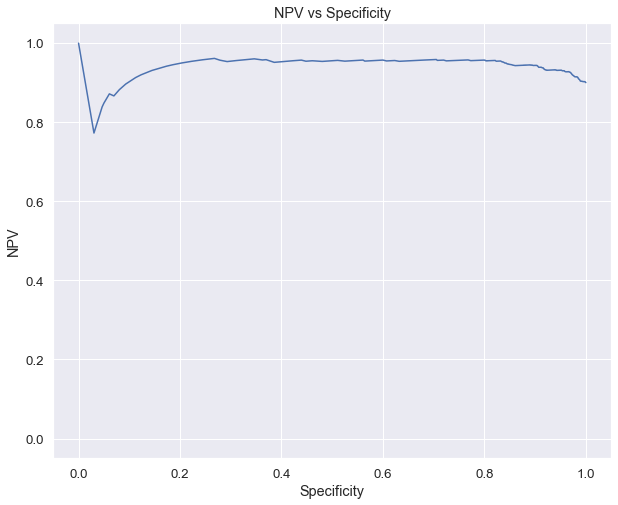

In [129]:
curves(starr_lr_probs[:,1], y_test, 'starr', 'lr')

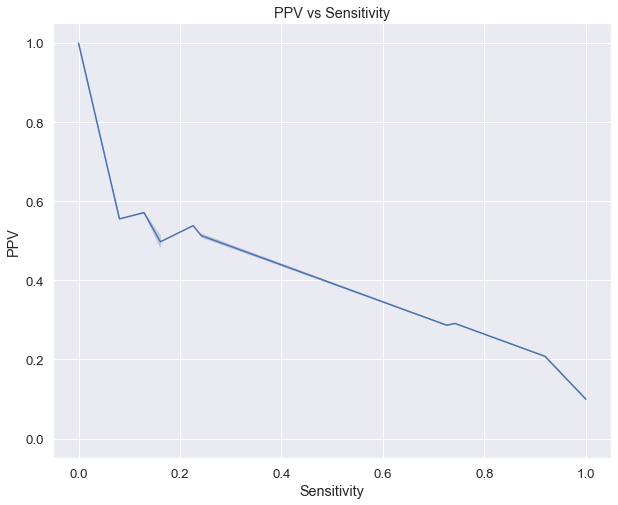

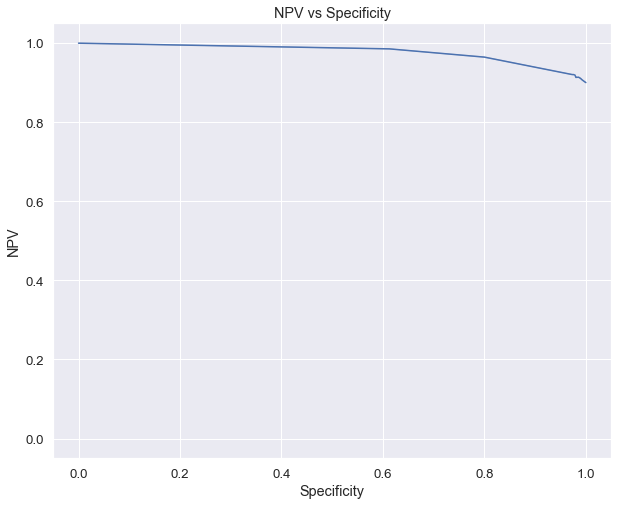

In [130]:
curves(starr_gb_probs[:,1], y_test, 'starr', 'gb')

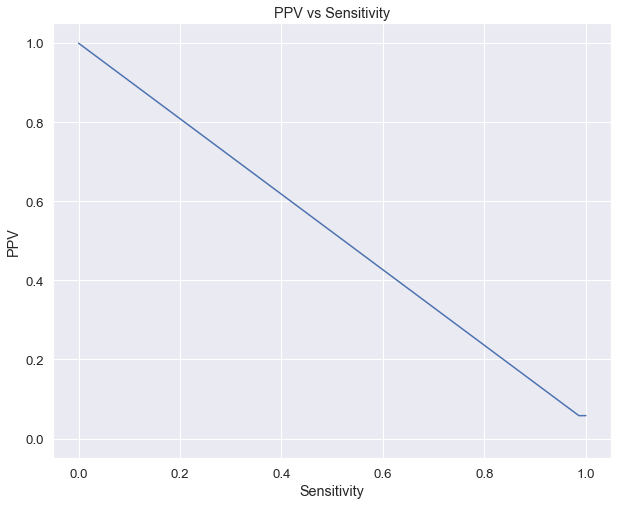

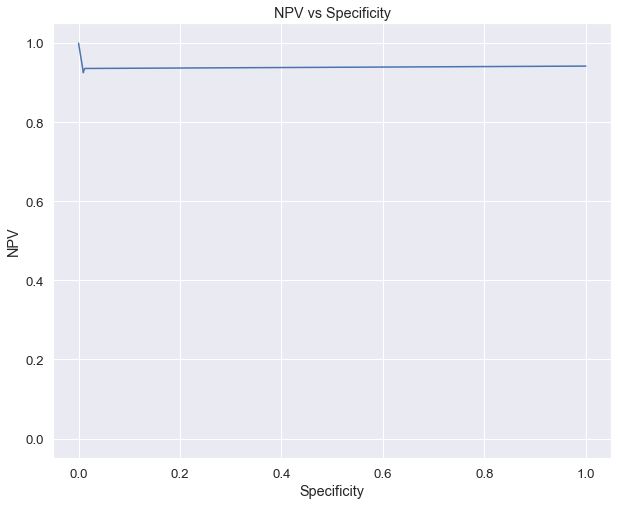

In [131]:
curves(mimic_lr_probs[:,1], y_mimic, 'mimic', 'lr')

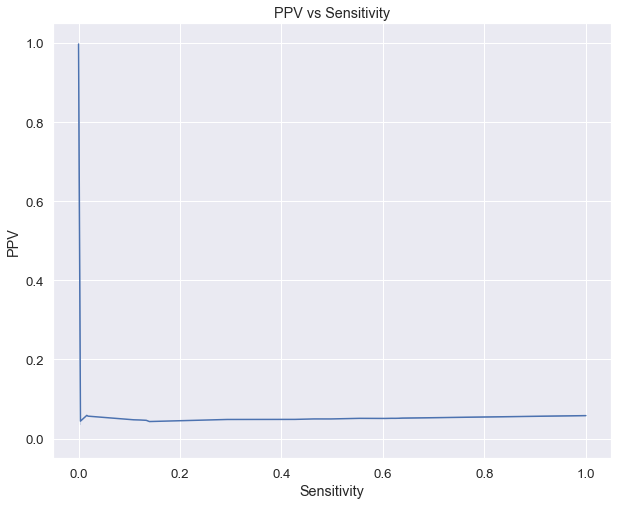

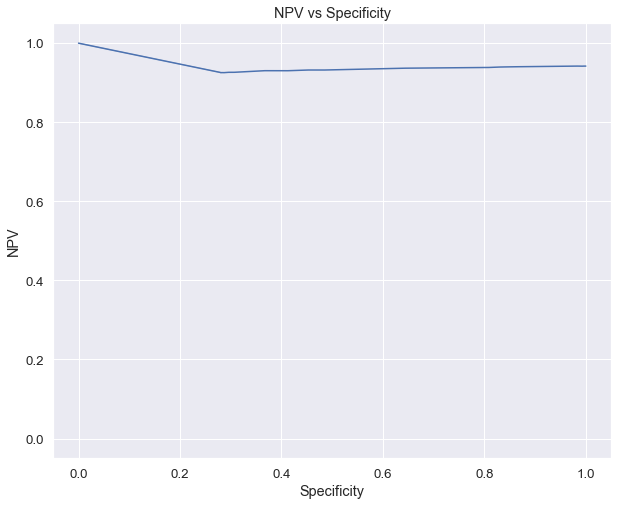

In [132]:
curves(mimic_gb_probs[:,1], y_mimic, 'mimic', 'gb')

In [354]:
temp_probs = [1 if x >= 0.5 else 0 for x in starr_lr_probs[:,1]]
temp_probs
len(temp_probs)
#y_test.iloc[[0],[1]] == 1
thresh = np.arange(0,1.05,0.05)
print(thresh)
outcomes = pd.DataFrame(starr_lr_probs[:,1], columns = ['probs'])
for i in range(len(thresh)):
    name_thresh = str(i) + '_threshold'
    temp_probs = [1 if x >= thresh[i] else 0 for x in starr_lr_probs[:,1]]
    outcomes[name_thresh] = temp_probs
outcomes.head()


[0.   0.05 0.1  0.15 0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65
 0.7  0.75 0.8  0.85 0.9  0.95 1.  ]


,probs,0_threshold,1_threshold,2_threshold,3_threshold,4_threshold,5_threshold,6_threshold,7_threshold,8_threshold,9_threshold,10_threshold,11_threshold,12_threshold,13_threshold,14_threshold,15_threshold,16_threshold,17_threshold,18_threshold,19_threshold,20_threshold
0,0.286886,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0.009857,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0.031643,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0.068918,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0.170837,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


**Additional computations**

In [184]:
# FOR OVERALL TEST COHORT
starr_test_n = X_test.shape[0]
mimic_test_n = X_mimic.shape[0]

# Gender distribution.
starr_M = X_test.gender.sum()
starr_F = X_test.shape[0] - starr_M

mimic_M = X_mimic.gender.sum()
mimic_F = X_mimic.shape[0] - mimic_M

print('starr M=%.3f, starr F=%.3f' % (starr_M, starr_F))
print('starr M=%.3f, starr F=%.3f' % (starr_M/X_test.shape[0], starr_F/X_test.shape[0]))

print('mimic M=%.3f, mimic F=%.3f' % (mimic_M, mimic_F))
print('mimic M=%.3f, mimic F=%.3f' % (mimic_M/X_mimic.shape[0], mimic_F/X_mimic.shape[0]))

# Ethnicity distribution.
starr_white = np.count_nonzero(X_test.ethnicity == 1)
starr_black = np.count_nonzero(X_test.ethnicity == 2)
starr_asian = np.count_nonzero(X_test.ethnicity == 3)
starr_latino = np.count_nonzero(X_test.ethnicity == 4)
starr_NA = np.count_nonzero(X_test.ethnicity == 5)
starr_other = np.count_nonzero(X_test.ethnicity == 6)
starr_unknown = np.count_nonzero(X_test.ethnicity == 7)

mimic_white = np.count_nonzero(X_mimic.ethnicity == 1)
mimic_black = np.count_nonzero(X_mimic.ethnicity == 2)
mimic_asian = np.count_nonzero(X_mimic.ethnicity == 3)
mimic_latino = np.count_nonzero(X_mimic.ethnicity == 4)
mimic_NA = np.count_nonzero(X_mimic.ethnicity == 5)
mimic_other = np.count_nonzero(X_mimic.ethnicity == 6)
mimic_unknown = np.count_nonzero(X_mimic.ethnicity == 7)

print('STARR')
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
     (starr_white, starr_black, starr_asian, starr_latino, starr_NA, starr_other, starr_unknown))
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
     (starr_white/starr_test_n, starr_black/starr_test_n, starr_asian/starr_test_n, starr_latino/starr_test_n, starr_NA/starr_test_n, starr_other/starr_test_n, starr_unknown/starr_test_n))

print('MIMIC')
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
      (mimic_white, mimic_black, mimic_asian, mimic_latino, mimic_NA, mimic_other, mimic_unknown))
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
      (mimic_white/mimic_test_n, mimic_black/mimic_test_n, mimic_asian/mimic_test_n, mimic_latino/mimic_test_n, mimic_NA/mimic_test_n, mimic_other/mimic_test_n, mimic_unknown/mimic_test_n))

starr M=376.000, starr F=246.000
starr M=0.605, starr F=0.395
mimic M=8200.000, mimic F=5641.000
mimic M=0.592, mimic F=0.408
STARR
white=321.000, black=49.000, asian=85.000, latino=114.000, native american=2.000, other=34.000, unknown=17.000
white=0.516, black=0.079, asian=0.137, latino=0.183, native american=0.003, other=0.055, unknown=0.027
MIMIC
white=9227.000, black=1122.000, asian=385.000, latino=494.000, native american=23.000, other=691.000, unknown=1899.000
white=0.667, black=0.081, asian=0.028, latino=0.036, native american=0.002, other=0.050, unknown=0.137


In [ ]:
# Split starr and mimic into readmit and nonreadmit.
starr_nonreadmit = X_test.loc[np.where((y_test.readmit == 0))]
starr_readmit = X_test.loc[np.where((y_test.readmit == 1))]

mimic_nonreadmit = X_mimic.loc[np.where((y_mimic.readmit == 0))]
mimic_readmit = X_mimic.loc[np.where((y_mimic.readmit == 1))]

In [388]:
# Gender distribution.
starr_nonreadmit_M = starr_nonreadmit.gender.sum()
starr_nonreadmit_F = starr_nonreadmit.shape[0] - starr_nonreadmit_M

starr_readmit_M = starr_readmit.gender.sum()
starr_readmit_F = starr_readmit.shape[0] - starr_readmit_M


mimic_nonreadmit_M = mimic_nonreadmit.gender.sum()
mimic_nonreadmit_F = mimic_nonreadmit.shape[0] - mimic_nonreadmit_M

mimic_readmit_M = mimic_readmit.gender.sum()
mimic_readmit_F = mimic_readmit.shape[0] - mimic_readmit_M

print('STARR')
print('starr nonreadmit M=%.3f, F=%.3f' % (starr_nonreadmit_M, starr_nonreadmit_F))
print('starr nonreadmit percent M=%.3f, F = %.3f' % (starr_nonreadmit_M/starr_nonreadmit.shape[0], starr_nonreadmit_F/starr_nonreadmit.shape[0]))
print('starr readmit M=%.3f, F=%.3f' % (starr_readmit_M, starr_readmit_F))
print('starr readmit percent M=%.3f, F=%.3f' % (starr_readmit_M/starr_readmit.shape[0], starr_readmit_F/starr_readmit.shape[0]))
print('\n', '\n')

print('MIMIC')
print('mimic nonreadmit M=%.3f, F=%.3f' % (mimic_nonreadmit_M, mimic_nonreadmit_F))
print('mimic nonreadmit percent M=%.3f, mimic F=%.3f' % (mimic_nonreadmit_M/mimic_nonreadmit.shape[0], mimic_nonreadmit_F/mimic_nonreadmit.shape[0]))
print('readmit M=%.3f, F = %.3f' % (mimic_readmit_M, mimic_readmit_F))
print('readmit percent M=%.3f, F=%.3f' % (mimic_readmit_M/mimic_readmit.shape[0], mimic_readmit_F/mimic_readmit.shape[0]))
print('\n', '\n')


# Ethnicity distribution.
starr_white = np.count_nonzero(starr_nonreadmit.ethnicity == 1)
starr_black = np.count_nonzero(starr_nonreadmit.ethnicity == 2)
starr_asian = np.count_nonzero(starr_nonreadmit.ethnicity == 3)
starr_latino = np.count_nonzero(starr_nonreadmit.ethnicity == 4)
starr_NA = np.count_nonzero(starr_nonreadmit.ethnicity == 5)
starr_other = np.count_nonzero(starr_nonreadmit.ethnicity == 6)
starr_unknown = np.count_nonzero(starr_nonreadmit.ethnicity == 7)

mimic_white = np.count_nonzero(mimic_nonreadmit.ethnicity == 1)
mimic_black = np.count_nonzero(mimic_nonreadmit.ethnicity == 2)
mimic_asian = np.count_nonzero(mimic_nonreadmit.ethnicity == 3)
mimic_latino = np.count_nonzero(mimic_nonreadmit.ethnicity == 4)
mimic_NA = np.count_nonzero(mimic_nonreadmit.ethnicity == 5)
mimic_other = np.count_nonzero(mimic_nonreadmit.ethnicity == 6)
mimic_unknown = np.count_nonzero(mimic_nonreadmit.ethnicity == 7)

print('STARR nonreadmit')
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
     (starr_white, starr_black, starr_asian, starr_latino, starr_NA, starr_other, starr_unknown))
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
     (starr_white/starr_nonreadmit.shape[0], starr_black/starr_nonreadmit.shape[0], starr_asian/starr_nonreadmit.shape[0], starr_latino/starr_nonreadmit.shape[0], starr_NA/starr_nonreadmit.shape[0], starr_other/starr_nonreadmit.shape[0], starr_unknown/starr_nonreadmit.shape[0]))
print('\n', '\n')

print('MIMIC nonreadmit')
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
      (mimic_white, mimic_black, mimic_asian, mimic_latino, mimic_NA, mimic_other, mimic_unknown))
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
      (mimic_white/mimic_nonreadmit.shape[0], mimic_black/mimic_nonreadmit.shape[0], mimic_asian/mimic_nonreadmit.shape[0], mimic_latino/mimic_nonreadmit.shape[0], mimic_NA/mimic_nonreadmit.shape[0], mimic_other/mimic_nonreadmit.shape[0], mimic_unknown/mimic_nonreadmit.shape[0]))
print('\n', '\n')


starr_white = np.count_nonzero(starr_readmit.ethnicity == 1)
starr_black = np.count_nonzero(starr_readmit.ethnicity == 2)
starr_asian = np.count_nonzero(starr_readmit.ethnicity == 3)
starr_latino = np.count_nonzero(starr_readmit.ethnicity == 4)
starr_NA = np.count_nonzero(starr_readmit.ethnicity == 5)
starr_other = np.count_nonzero(starr_readmit.ethnicity == 6)
starr_unknown = np.count_nonzero(starr_readmit.ethnicity == 7)

mimic_white = np.count_nonzero(mimic_readmit.ethnicity == 1)
mimic_black = np.count_nonzero(mimic_readmit.ethnicity == 2)
mimic_asian = np.count_nonzero(mimic_readmit.ethnicity == 3)
mimic_latino = np.count_nonzero(mimic_readmit.ethnicity == 4)
mimic_NA = np.count_nonzero(mimic_readmit.ethnicity == 5)
mimic_other = np.count_nonzero(mimic_readmit.ethnicity == 6)
mimic_unknown = np.count_nonzero(mimic_readmit.ethnicity == 7)

print('STARR readmit')
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
     (starr_white, starr_black, starr_asian, starr_latino, starr_NA, starr_other, starr_unknown))
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
     (starr_white/starr_readmit.shape[0], starr_black/starr_readmit.shape[0], starr_asian/starr_readmit.shape[0], starr_latino/starr_readmit.shape[0], starr_NA/starr_readmit.shape[0], starr_other/starr_readmit.shape[0], starr_unknown/starr_readmit.shape[0]))
print('\n', '\n')

print('MIMIC readmit')
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
      (mimic_white, mimic_black, mimic_asian, mimic_latino, mimic_NA, mimic_other, mimic_unknown))
print('white=%.3f, black=%.3f, asian=%.3f, latino=%.3f, native american=%.3f, other=%.3f, unknown=%.3f' %
      (mimic_white/mimic_readmit.shape[0], mimic_black/mimic_readmit.shape[0], mimic_asian/mimic_readmit.shape[0], mimic_latino/mimic_readmit.shape[0], mimic_NA/mimic_readmit.shape[0], mimic_other/mimic_readmit.shape[0], mimic_unknown/mimic_readmit.shape[0]))




STARR
starr nonreadmit M=337.000, F=223.000
starr nonreadmit percent M=0.602, F = 0.398
starr readmit M=39.000, F=23.000
starr readmit percent M=0.629, F=0.371

 

MIMIC
mimic nonreadmit M=7711.000, F=5328.000
mimic nonreadmit percent M=0.591, mimic F=0.409
readmit M=489.000, F = 313.000
readmit percent M=0.610, F=0.390

 

STARR nonreadmit
white=286.000, black=42.000, asian=80.000, latino=104.000, native american=2.000, other=31.000, unknown=15.000
white=0.511, black=0.075, asian=0.143, latino=0.186, native american=0.004, other=0.055, unknown=0.027

 

MIMIC nonreadmit
white=8692.000, black=1043.000, asian=358.000, latino=467.000, native american=20.000, other=656.000, unknown=1803.000
white=0.667, black=0.080, asian=0.027, latino=0.036, native american=0.002, other=0.050, unknown=0.138

 

STARR readmit
white=35.000, black=7.000, asian=5.000, latino=10.000, native american=0.000, other=3.000, unknown=2.000
white=0.565, black=0.113, asian=0.081, latino=0.161, native american=0.000, o

In [204]:
# age: mean (std)
starr_nonreadmit_age_mean = starr_nonreadmit.age.mean()
starr_nonreadmit_age_std = starr_nonreadmit.age.std()

starr_readmit_age_mean = starr_readmit.age.mean()
starr_readmit_age_std = starr_readmit.age.std()

mimic_nonreadmit_age_mean = mimic_nonreadmit.age.mean()
mimic_nonreadmit_age_std = mimic_nonreadmit.age.std()

mimic_readmit_age_mean = mimic_readmit.age.mean()
mimic_readmit_age_std = mimic_readmit.age.std()

print('STARR')
print('nonreadmit age mean = %.3f, std = %.3f' % (starr_nonreadmit_age_mean, starr_nonreadmit_age_std))
print('readmit age mean = %.3f, std = %.3f' % (starr_readmit_age_mean, starr_readmit_age_std))
print('\n', '\n')

print('MIMIC')
print('nonreadmit age mean = %.3f, std = %.3f' % (mimic_nonreadmit_age_mean, mimic_nonreadmit_age_std))
print('readmit age mean = %.3f, std = %.3f' % (mimic_readmit_age_mean, mimic_readmit_age_std))
print('\n', '\n')


# admit_ed
starr_nonreadmit_ed = np.count_nonzero(starr_nonreadmit.admit_ed == 1)
starr_readmit_ed = np.count_nonzero(starr_readmit.admit_ed == 1)

mimic_nonreadmit_ed = np.count_nonzero(mimic_nonreadmit.admit_ed == 1)
mimic_readmit_ed = np.count_nonzero(mimic_readmit.admit_ed == 1)

print('STARR')
print('nonreadmit ED = %.3f, readmit ED = %.3f' % (starr_nonreadmit_ed, starr_readmit_ed))
print('nonreadmit ED = %.3f, readmit ED = %.3f' % (starr_nonreadmit_ed/starr_nonreadmit.shape[0], starr_readmit_ed/starr_readmit.shape[0]))
print('\n', '\n')

print('MIMIC')
print('nonreadmit ED = %.3f, readmit ED = %.3f' % (mimic_nonreadmit_ed, mimic_readmit_ed))
print('nonreadmit ED = %.3f, readmit ED = %.3f' % (mimic_nonreadmit_ed/mimic_nonreadmit.shape[0], mimic_readmit_ed/mimic_readmit.shape[0]))


STARR
nonreadmit age mean = 58.430, std = 17.218
readmit age mean = 57.516, std = 15.434

 

MIMIC
nonreadmit age mean = 61.256, std = 17.327
readmit age mean = 63.334, std = 15.838

 

STARR
nonreadmit ED = 132.000, readmit ED = 14.000
nonreadmit ED = 0.236, readmit ED = 0.226

 

MIMIC
nonreadmit ED = 6265.000, readmit ED = 405.000
nonreadmit ED = 0.480, readmit ED = 0.505


In [203]:
# icu_los
starr_nonreadmit_icu_los_mean = starr_nonreadmit.icu_los.mean()
starr_nonreadmit_icu_los_std = starr_nonreadmit.icu_los.std()
starr_readmit_icu_los_mean = starr_readmit.icu_los.mean()
starr_readmit_icu_los_std = starr_readmit.icu_los.std()

mimic_nonreadmit_icu_los_mean = mimic_nonreadmit.icu_los.mean()
mimic_nonreadmit_icu_los_std = mimic_nonreadmit.icu_los.std()
mimic_readmit_icu_los_mean = mimic_readmit.icu_los.mean()
mimic_readmit_icu_los_std = mimic_readmit.icu_los.std()

print('STARR')
print('nonreadmit icu los mean = %.3f, nonreadmit icu los std = %.3f' % (starr_nonreadmit_icu_los_mean, starr_nonreadmit_icu_los_std))
print('readmit icu los mean = %.3f, readmit icu los std = %.3f' % (starr_readmit_icu_los_mean, starr_readmit_icu_los_std))
print('\n', '\n')

print('MIMIC')
print('nonreadmit icu los mean = %.3f, nonreadmit std = %.3f' % (mimic_nonreadmit_icu_los_mean, mimic_nonreadmit_icu_los_std))
print('readmit icu los mean = %.3f, readmit std = %.3f' % (mimic_readmit_icu_los_mean, mimic_readmit_icu_los_std))
print('\n', '\n')

# hospital_los
starr_nonreadmit_hosp_los_mean = starr_nonreadmit.hospital_los.mean()
starr_nonreadmit_hosp_los_std = starr_nonreadmit.hospital_los.std()
starr_readmit_hosp_los_mean = starr_readmit.hospital_los.mean()
starr_readmit_hosp_los_std = starr_readmit.hospital_los.std()

mimic_nonreadmit_hosp_los_mean = mimic_nonreadmit.hospital_los.mean()
mimic_nonreadmit_hosp_los_std = mimic_nonreadmit.hospital_los.std()
mimic_readmit_hosp_los_mean = mimic_readmit.hospital_los.mean()
mimic_readmit_hosp_los_std = mimic_readmit.hospital_los.std()

print('STARR')
print('nonreadmit hosp los mean = %.3f, std = %.3f' % (starr_nonreadmit_hosp_los_mean, starr_nonreadmit_hosp_los_std))
print('readmit hosp los mean = %.3f, std = %.3f' % (starr_readmit_hosp_los_mean, starr_readmit_hosp_los_std))
print('\n', '\n')

print('MIMIC')
print('nonreadmit hosp los mean = %.3f, std %.3f' % (mimic_nonreadmit_hosp_los_mean, mimic_nonreadmit_hosp_los_std))
print('readmit hosp los mean = %.3f, std %.3f' % (mimic_readmit_hosp_los_mean, mimic_readmit_hosp_los_std))


STARR
nonreadmit icu los mean = 2.650, nonreadmit icu los std = 3.138
readmit icu los mean = 4.274, readmit icu los std = 3.914

 

MIMIC
nonreadmit icu los mean = 4.483, nonreadmit std = 5.714
readmit icu los mean = 5.709, readmit std = 6.206

 

STARR
nonreadmit hosp los mean = 10.229, std = 11.793
readmit hosp los mean = 26.145, std = 18.306

 

MIMIC
nonreadmit hosp los mean = 5.262, std 6.418
readmit hosp los mean = 7.306, std 8.288


In [190]:
X_test.shape[1]
X_mimic.shape[1]

96

In [180]:
np.count_nonzero(X_test.ethnicity == 1)

321

In [179]:
starr_unique, starr_counts = np.unique(X_test.ethnicity, return_counts=True)
dict(zip(starr_unique, starr_counts))
starr

{1.0: 321, 2.0: 49, 3.0: 85, 4.0: 114, 5.0: 2, 6.0: 34, 7.0: 17}

In [ ]:
for i in range(mimic_final.shape[0]):
    if mimic_final['gender'][i] == 'M':
        temp_gender.append(1)
    else:
        temp_gender.append(0)
    if mimic_final['ethnicity'][i] == 'WHITE':
        temp.append(1)
    elif mimic_final['ethnicity'][i] == 'BLACK/AFRICAN AMERICAN':
        temp.append(2)
    elif mimic_final['ethnicity'][i] == 'ASIAN':
        temp.append(3)
    elif mimic_final['ethnicity'][i] == 'HISPANIC/LATINO':
        temp.append(4)
    elif mimic_final['ethnicity'][i] == 'AMERICAN INDIAN/ALASKA NATIVE':
        temp.append(5)
    elif mimic_final['ethnicity'][i] == 'OTHER':
        temp.append(6)
    else: 
        temp.append(7)

END.

In [215]:
y_pred = gb_best_model.predict(X_test)
#y_pred
y_score = gb_best_model.decision_function(X_test)
#y_score
y_prob = gb_best_model.predict_proba(X_test)
y_prob[:,0]

array([0.75359732, 0.97127235, 0.83450882, 0.75518263, 0.95047982,
       0.96061441, 0.93795576, 0.96137677, 0.95148039, 0.88948329,
       0.9699056 , 0.91292191, 0.96137677, 0.97049364, 0.85993544,
       0.90936841, 0.89464739, 0.76967819, 0.97127235, 0.81920376,
       0.96083378, 0.84703221, 0.80806068, 0.76925679, 0.89964819,
       0.79816008, 0.95217361, 0.95978384, 0.82407711, 0.59216972,
       0.96263713, 0.96137677, 0.96118245, 0.9699056 , 0.84117217,
       0.97049364, 0.95978384, 0.9699056 , 0.97049364, 0.96123957,
       0.95519657, 0.9699056 , 0.86863848, 0.97076783, 0.97049364,
       0.72950196, 0.97049364, 0.97049364, 0.9699056 , 0.97049364,
       0.53412922, 0.8527602 , 0.96083378, 0.83706648, 0.9699056 ,
       0.962377  , 0.9699056 , 0.95978384, 0.9699056 , 0.91716452,
       0.59271258, 0.9699056 , 0.85118012, 0.95047982, 0.95467057,
       0.97069936, 0.97049364, 0.9442576 , 0.97076783, 0.86662456,
       0.9699056 , 0.97069936, 0.94236603, 0.4196447 , 0.46653

In [ ]:
X_test, y_test
X_mimic, y_mimic

In [ ]:
# X = features, y = readmit (outcome)

# define model
model = RandomForestClassifier()

# define imputer
imputer = IterativeImputer() # default is described below
#imputer = IterativeImputer(estimator=BayesianRidge(), n_nearest_features=None, imputation_order='ascending')

# define pipeline
pipeline = Pipeline(steps=[('i', imputer), ('m', model)])

# define model evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)

# evaluate model
scores = cross_val_score(pipeline, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
print('Mean Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))

# fit on the dataset
#imputer.fit(X)
# transform the dataset
#Xtrans = imputer.transform(X)


### Write out files.

In [25]:
### Write results to csv file.
import csv

# name of csv file 
filename = "starr_final.csv"
    
# writing to csv file 
with open(filename, 'w') as csvfile: 
    # creating a csv writer object 
    csvwriter = csv.writer(csvfile) 
        
    # writing the header
    csvwriter.writerow(starr.columns) 
        
    # writing the data rows 
    for i in range(starr.shape[0]):
        csvwriter.writerow(starr.iloc[i])

In [26]:
### Write results to csv file.
# name of csv file 
filename = "mimic_final.csv"
    
# writing to csv file 
with open(filename, 'w') as csvfile: 
    # creating a csv writer object 
    csvwriter = csv.writer(csvfile) 
        
    # writing the header
    csvwriter.writerow(mimic.columns) 
        
    # writing the data rows 
    for i in range(mimic.shape[0]):
        csvwriter.writerow(mimic.iloc[i])